# CLASE 2.4: Modelo de regresión lineal (parte II).
---

## Introducción.
Habiendo profundizado en los fundamentos elementales del modelo de regresión lineal, nos preparamos para expandir y enriquecer este conocimiento adentrándonos en construcciones más sofisticadas que pondrán de manifiesto el valor intrínseco de lo estudiado hasta ahora, al revisar los detalles relativos a los **modelos lineales regularizados** y **modelos lineales Bayesianos**. Anteriormente establecimos, al comenzar nuestro estudio del modelo de regresión lineal, que haríamos un gran esfuerzo por construir dicho modelo de la forma más general posible, anticipando la posible (falsa) impresión de que, dada su simplicidad y presencia en cualquier plan de estudios de ciencias básicas en la mayoría de las escuelas de ingeniería, los interesados en profundizar en aprendizaje automático podrían pensar que su incorporación a un curso de estos tópicos sería poco más que inútil y sin sentido (y esa es una impresión que me he llevado después de casi una década compartiendo con colegas de diversas escuelas y lugares). En los próximos apartados, exploraremos cómo la introducción de técnicas de regularización permite controlar el sobreajuste y mejorar la capacidad de generalización de los modelos. Asimismo, examinaremos el enfoque Bayesiano, que incorpora la incertidumbre y el conocimiento previo en la estimación de los parámetros. A lo largo de este recorrido, la regresión lineal continuará siendo nuestro hilo conductor, sirviendo como base sobre la cual construimos y adaptamos métodos más avanzados para abordar desafíos complejos en aprendizaje automático e inteligencia artificial.

Partiremos esta sección importando todas las librerías y objetos que ya habíamos utilizado en la Parte I de esta sección. Mantendremos un esquema continuista en la numeración de las ecuaciones para darle fuerza al hecho de que esta es simplemente una continuación de la sección anterior, elaborada por separado para evitar que Github tenga problemas para renderizar un notebook tan grande:

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

In [2]:
import warnings

In [3]:
warnings.filterwarnings('ignore')

In [4]:
from mpl_toolkits import mplot3d
from scipy.special import factorial
from sklearn.linear_model import LinearRegression, SGDRegressor
from sklearn.metrics import (
    mean_squared_error,
    root_mean_squared_error,
    mean_absolute_error,
    mean_absolute_percentage_error,
    r2_score,
)
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import PolynomialFeatures

In [5]:
from tqdm import tqdm

In [6]:
# Seteamos algunos parámetros para hermosear nuestras figuras.
plt.rcParams["figure.dpi"] = 145
sns.set()
plt.style.use("seaborn-v0_8-white")

In [7]:
%matplotlib widget

## Modelos lineales regularizados.
Los modelos de regresión lineal que son el resultado de transformaciones que permiten incorporar casos no lineales siempre que el modelo resultante sea lineal en sus parámetros son, como hemos revisado en los ejemplos anteriores, **propensos a experimentar overfitting**. Lo anterior provoca ciertos comportamientos indeseables a nivel estructural. Por ejemplo, si $\mathbf{X}\in \mathbb{R}^{m\times n}$ es la matriz de diseño que describe los datos de entrada de un conjunto de entrenamiento, un problema estructural típico es que la matriz $\mathbf{X}^{\top}\mathbf{X}$ sea mal condicionada o no singular, lo que afecta directamente nuestra capacidad de estimar los parámetros de un modelo de regresión mediante los métodos estudiados con anterioridad, porque $\mathbf{X}^{\top}\mathbf{X}$ es un ingrediente esencial de las soluciones de tales problemas. Para enfrentarnos a este tipo de problemas mal condicionados y evitar ciertas condiciones indeseables, como el ya mencionado overfitting, procederemos a desarrollar un concepto de enorme importancia en la teoría del aprendizaje automatizado, llamado **regularización**.

En el aprendizaje automatizado, un **desafío clave** es permitir que nuestros modelos puedan predecir resultados, con precisión y exactitud razonables, con respecto a datos que no fueron vistos durante su entrenamiento (los famosos *datos de prueba*, que naturalmente son potencialmente infinitos). El objetivo de las **técnicas de regularización** es permitir que nuestros modelos *aprendan* patrones más amplios inherentes a nuestros datos en vez de simplemente *memorizar* ruido y patrones que son parte únicamente del conjunto de entrenamiento, mejorando significativamente los correspondientes **errores de generalización**.

Una forma de clasificar las técnicas de regularización es la siguiente:

- **Técnicas explícitas:** Se trata de técnicas que añaden un término a la función objetivo inherente a nuestro problema de regresión. Estos términos varían en naturaleza, pero pueden ser **conocimiento a priori** (desde una perspectiva Bayesiana), penalizaciones o restricciones. Estas técnicas son propias de **problemas mal condicionados**.

- **Técnicas implícitas:** Comprenden todas las demás técnicas de regularización. Estas incluyen procedimientos de **early stopping** (donde detenemos los algoritmos de optimización implementados cuando se dan condiciones especiales, dependientes de la tolerancia del problema, y que permiten evitar que los errores en datos de validación se degraden progresivamente), robustecimiento de las funciones de costo o limpieza más profunda de nuestros datos.

En esta sección, nos dedicaremos a describir algunas técnicas explícitas de gran importancia en el contexto de los modelos de regresión lineal. Para ello, definiremos el concepto base que nos servirá para desarrollar de manera orgánica dichas técnicas.

**<font color='blue'>Definición 4.4 – Término explícito de regularización</font>**: Sea el conjunto de entrenamiento $\mathcal{D} =\left\{ \left( \mathbf{X} ,\mathbf{y} \right)  :\mathbf{X} \in \mathbb{R}^{m\times n} \wedge \mathbf{y} \in \mathbb{R} \right\}$, donde $\mathbf{x}_{i}\in \mathbb{R}^{n}$ representa una fila o instancia $i$-ésima de la matriz de datos de entrada $\mathbf{X}$, siendo $m$ el total de instancias de $\mathcal{D}$. Sea $f$ una función regresora que estima $y_{i}$ en términos de $\mathbf{x}_{i}$. Si $L$ es la función de costo a optimizar para nuestro problema, entonces un **término explícito de regularización** es una función $R$ que se añade al objetivo del problema de optimización subyacente al modelo, de manera tal que éste puede escribirse como

$$\min_{f} \sum_{i=1}^{m} L\left( f\left( \mathbf{x}_{i} ,y_{i} \right) \right) +\alpha R\left( f \right)$$
<p style="text-align: right;">$(4.57)$</p>

Donde $\alpha$ se denomina **peso o potencia del regularizador**.

A continuación, estudiaremos tres casos particulares de regularización de modelos de regresión lineal, todos ellos muy similares entre sí, y que tienen como objetivo la **selección de variables independientes** de un conjunto de entrenamiento.

### Regresión de tipo "ridge".
El primero de estos casos se denomina **regresión de tipo "ridge"**, y resulta apto para abordar problemas en los cuales las variables independientes están altamente correlacionadas entre sí, y que es común cuando el número $n$ de dichas variables es sigificativamente grande. En general, si $\mathbf{y}=\mathbf{X}\mathbf{w}$ representa nuestro modelo de regresión lineal, este método se aplica cuando: 

- El estimador de mínimos cuadrados $\hat{\mathbf{w}} =\left( \mathbf{X}^{\top} \mathbf{X} \right)^{-1} \left( \mathbf{X}^{\top} \mathbf{y} \right)$ no es único, lo que ocurre cuando la matriz $\mathbf{X}^{\top} \mathbf{X}$ es singular (es decir, $\det \left( \mathbf{X}^{\top} \mathbf{X} \right) =0$). Este caso se da cuando hay variables independientes (columnas de $\mathbf{X}$) que son linealmente dependientes, lo que implica la existencia de **multicolinealidad**.

- El estimador de mínimos cuadrados $\hat{\mathbf{w}} =\left( \mathbf{X}^{\top} \mathbf{X} \right)^{-1} \left( \mathbf{X}^{\top} \mathbf{y} \right)$ no está bien definido, o bien, es difícil de calcular, lo que comúnmente se asocia a que la matriz $\mathbf{X}^{\top} \mathbf{X}$ esté mal condicionada. Por extensión, el problema de regresión resultante se denomina como **mal condicionado**.

Sea cual sea el caso, consideramos la **función de costo regularizada** $J$, definida como

$$J\left( \mathbf{w} \right) =\frac{1}{m} \sum_{i=1}^{m} L\left( y_{i},f\left( \mathbf{x}_{i} \right) \right) +\alpha \sum_{j=1}^{n} w_{j}^{2}$$
<p style="text-align: right;">$(4.58)$</p>

Donde $L$ es la función de costo original (no regularizada) de interés. Notemos que el **término de regularización** es $R\left( \mathbf{w} \right) :=\alpha \sum_{j=1}^{n} w_{j}^{2}=\alpha \left\Vert \mathbf{w} \right\Vert_{2}^{2}$, siendo $\alpha=$ la potencia de dicho término y $\left\Vert \mathbf{w} \right\Vert_{2}= \sqrt{\mathbf{w}^{\top} \mathbf{w}}$ es la norma $\ell_{2}$ (o Euclidiana) del vector de parámetros $\mathbf{w}$. Por esta razón, la función $R$ así definida se denomina **regularizador de tipo $\ell_{2}$**. El modelo de regresión cuya función de costo es la definida en (4.58) es llamado, por extensión, **regresión de tipo "ridge"**.

De la misma forma que en el caso de la estimación por mínimos cuadrados, debemos resolver el problema de optimización derivado de la función de costo definida en (4.58). Es decir, el estimador del vector de parámetros $\mathbf{w}$ para este problema es

$$\hat{\mathbf{w}} =\underset{\mathbf{w}}{\mathrm{argmin}} \left( \frac{1}{m} \sum_{i=1}^{m} L\left( y_{i},f\left( \mathbf{x}_{i} \right) \right) +\alpha \sum_{j=1}^{n} w_{j}^{2} \right)$$
<p style="text-align: right;">$(4.59)$</p>

Notemos que el problema (4.59) es, de hecho, un problema no restringido, siendo la función de costo $L$ la función objetivo original. Sobre la base del método de multiplicadores de Lagrange, la función $J$ es el Lagrangiano de dicho problema, cuya restricción es una desigualdad del tipo $\left\Vert \mathbf{w} \right\Vert_{2}^{2} \leq c$, donde $c$ es un número real que simplemente restringe el valor que puede tomar la norma $\ell_{2}$ del vector $\mathbf{w}$, a fin de garantizar que las soluciones factible del problema (4.59) se encuentren en una región deseable, tal que los parámetros asociados a variables independientes altamente correlacionadas (o **redundantes**) tengan una magnitud tan pequeña como sea posible, reduciendo su influencia en el modelo resultante. La potencia $\alpha$ del término de regularización resulta ser, por tanto, el multiplicador de Lagrange asociado a la restricción $\left\Vert \mathbf{w} \right\Vert_{2}^{2} \leq c$.

Notemos que, si $L$ corresponde al error cuadrático medio, la ecuación (4.59) puede reescribirse en forma matricial como

$$\hat{\mathbf{w}} =\underset{\mathbf{w}}{\mathrm{argmin}} \left( \left( \mathbf{y} -\mathbf{X} \mathbf{w} \right)^{\top} \left( \mathbf{y} -\mathbf{X} \mathbf{w} \right) +\alpha \mathbf{w}^{\top} \mathbf{w} \right)$$
<p style="text-align: right;">$(4.60)$</p>

Derivando la función de costo e igualando a cero, obtenemos:

$$\begin{array}{llll}&0&=&\displaystyle \frac{\partial}{\partial \mathbf{w}} \left( \left( \mathbf{y} -\mathbf{X} \mathbf{w} \right)^{\top} \left( \mathbf{y} -\mathbf{X} \mathbf{w} \right) +\alpha \mathbf{w}^{\top} \mathbf{w} \right)\\ \Longrightarrow&0&=&-2\mathbf{X}^{\top} \left( \mathbf{y} -\mathbf{X} \mathbf{w} \right) +2\alpha \mathbf{w}\\ \Longrightarrow&\mathbf{X}^{\top} \mathbf{y}&=&\mathbf{X}^{\top} \mathbf{X} \mathbf{w} +\alpha \mathbf{w}\\ \Longrightarrow&\mathbf{X}^{\top} \mathbf{y}&=&\left( \mathbf{X}^{\top} \mathbf{X} +\alpha \mathbf{I} \right) \mathbf{w}\end{array}$$
<p style="text-align: right;">$(4.61)$</p>

Donde $\mathbf{I}\in \mathbb{R}^{n\times n}$ es la matriz identidad. Por lo tanto, el estimador $\hat{\mathbf{w}}$ para la regresión "ridge" es

$$\hat{\mathbf{w}}_{\mathrm{ridge}} =\left( \mathbf{X}^{\top} \mathbf{X} +\alpha \mathbf{I} \right)^{-1} \mathbf{X}^{\top} \mathbf{y}$$
<p style="text-align: right;">$(4.62)$</p>

Al comparar la ecuación (4.62) con el estimador de mínimos cuadrados, podemos observar que el efecto del término regularizador de tipo "ridge" es la adición del término $\alpha \mathbf{I}$ a la matriz $\mathbf{X}^{\top} \mathbf{X}$, lo que permite obtener una nueva matriz $\mathbf{X}^{\top} \mathbf{X} +\alpha \mathbf{I}$ que siempre es invertible para $\alpha> 0$, incluso cuando $\mathbf{X}^{\top} \mathbf{X}$ es singular, lo que permite disponer de un estimador parámetros apto para tratar cualquier problema de regresión lineal, incluso cuando hay multicolinealidad o el problema está mal condicionado. Notemos además que, cuando $\alpha= 0$, el estimador (4.62) se reduce al de mínimos cuadrados.

**Ejemplo 4.12 – El estimador "ridge" es sensible al escalamiento:** Una propiedad muy útil del estimador de mínimos cuadrados es que éste es invariante ante cambios de escala (orden de magnitud) de las variables independientes. Esto quiere decir que si multiplicamos la matriz de diseño $\mathbf{X}$ por otra matriz no singular $\mathbf{P}$, de manera tal que construimos otra matriz $\mathbf{Z} =\mathbf{X} \mathbf{P}$, entonces el "nuevo" estimador de mínimos cuadrados diferirá del anterior por un factor igual a $\mathbf{P}^{-1}$. En efecto,

$$\begin{array}{lll}\hat{\mathbf{w}}_{\mathrm{OLS}} \left( \mathbf{Z} \right)&=&\left( \mathbf{Z}^{\top} \mathbf{Z} \right)^{-1} \mathbf{Z}^{\top} \mathbf{y}\\ &=&\left( \mathbf{P}^{\top} \mathbf{X}^{\top} \mathbf{X} \mathbf{P} \right)^{-1} \mathbf{P}^{\top} \mathbf{X}^{\top} \mathbf{y}\\ &=&\mathbf{P}^{-1} \left( \mathbf{X}^{\top} \mathbf{X} \right)^{-1} \left( \mathbf{P}^{\top} \right)^{-1} \mathbf{P}^{\top} \mathbf{X}^{\top} \mathbf{y}\\ &=&\mathbf{P}^{-1} \left( \mathbf{X}^{\top} \mathbf{X} \right)^{-1} \mathbf{X}^{\top} \mathbf{y}\\ &=&\mathbf{P}^{-1} \hat{\mathbf{w}}_{\mathrm{OLS}} \left( \mathbf{X} \right)\end{array}$$
<p style="text-align: right;">$(4.63)$</p>

Por lo tanto, no importa la escala de la matriz $\mathbf{X}$, el estimador de mínimos cuadrados únicamente diferirá por un factor constante. Esta propiedad resulta extremadamente útil, puesto que permite factorizar la matriz de diseño de nuestro problema, reemplazándola por cualquier combinación que permita un cómputo más sencillo (en tiempo de ejecución). Lamentablemente, **el estimador de tipo "ridge" no presenta esta propiedad**.

En efecto,

$$\begin{array}{lll}\hat{\mathbf{w}}_{\mathrm{ridge}} \left( \mathbf{Z} \right)&=&\left( \mathbf{Z}^{\top} \mathbf{Z} +\alpha \mathbf{I} \right)^{-1} \mathbf{Z}^{\top} \mathbf{y}\\ &=&\left( \mathbf{P}^{\top} \mathbf{X}^{\top} \mathbf{X} \mathbf{P} +\alpha \mathbf{I} \right)^{-1} \mathbf{P}^{\top} \mathbf{X}^{\top} \mathbf{y}\\ &=&\left( \mathbf{P}^{\top} \mathbf{X}^{\top} \mathbf{X} \mathbf{P} +\alpha \mathbf{P}^{\top} \left( \mathbf{P}^{\top} \right)^{-1} \mathbf{P}^{-1} \mathbf{P} \right)^{-1} \mathbf{P}^{\top} \mathbf{X}^{\top} \mathbf{y}\\ &=&\left( \mathbf{P}^{\top} \left( \mathbf{X}^{\top} \mathbf{X} +\alpha \left( \mathbf{P}^{\top} \right)^{-1} \mathbf{P}^{-1} \right) \mathbf{P} \right)^{-1} \mathbf{P}^{\top} \mathbf{X}^{\top} \mathbf{y}\\ &=&\mathbf{P}^{-1} \left( \mathbf{X}^{\top} \mathbf{X} +\alpha \left( \mathbf{P}^{\top} \right)^{-1} \mathbf{P}^{-1} \right)^{-1} \left( \mathbf{P}^{\top} \right)^{-1} \mathbf{P}^{\top} \mathbf{X}^{\top} \mathbf{y}\\ &=&\mathbf{P}^{-1} \left( \mathbf{X}^{\top} \mathbf{X} +\alpha \left( \mathbf{P}^{\top} \right)^{-1} \mathbf{P}^{-1} \right)^{-1} \mathbf{X}^{\top} \mathbf{y}\end{array}$$
<p style="text-align: right;">$(4.64)$</p>

Por lo tanto, se tiene que

$$\hat{\mathbf{w}}_{\mathrm{ridge}} \left( \mathbf{Z} \right) =\hat{\mathbf{w}}_{\mathrm{ridge}} \left( \mathbf{X} \right) \  \Longleftrightarrow \  \mathbf{P} \mathbf{P}^{\top} =\mathbf{I}$$
<p style="text-align: right;">$(4.65)$</p>

De esta manera, **el estimador de tipo "ridge" es invariante ante cambios de escala sólo en el caso particular en que la matriz de escalamiento $\mathbf{P}$ es ortonormal**. Por esta razón, si deseamos implementar este modelo en la práctica, **siempre debemos estandarizar o normalizar nuestra matriz de diseño**. ◼︎

**Ejemplo 4.13 – Sesgo y varianza del estimador de tipo "ridge":** Vamos a mostrar cómo la regularización de tipo "ridge" impacta en el sesgo y la varianza del modelo de regresión lineal. Para ello, partiremos desde los mismos supuestos que tomamos para derivar el estimador de mínimos cuadrados: Los residuos tienen una media igual a cero y varianza $\sigma^{2}$ constante, y no están correlacionados. Es decir,

$$\mathrm{E} \left[ \mathbf{\varepsilon} |\mathbf{X} \right] =0\  \wedge \  \mathrm{Var} \left( \mathbf{\varepsilon} |\mathbf{X} \right) =\sigma^{2} \mathbf{I}$$
<p style="text-align: right;">$(4.66)$</p>

Donde $\mathbf{\varepsilon}\in \mathbb{R}^{m}$ es el vector que aglutina a los residuos del modelo para las $m$ instancias del conjunto de entrenamiento e $\mathbf{I}\in \mathbb{R}^{n\times n}$ es la matriz identidad, siendo $n$ el número de variables independientes.

Partamos calculando el **sesgo** de nuestro estimador. Para ello, como base, recordemos el hecho de que **el estimador de mínimos cuadrados $\hat{\mathbf{w}}_{\mathrm{OLS}}$ es insesgado**. Es decir, su valor esperado es igual al vector *real* de parámetros $\mathbf{w}\in \mathbb{R}^{n}$. Para calcular el sesgo del estimador de tipo "ridge", consideremos nuestro modelo lineal $\mathbf{y} =\mathbf{X} \mathbf{w} +\mathbf{\varepsilon}$ y reemplacemos el valor de $\mathbf{y}$ en la ecuación (4.62):

$$\begin{array}{lll}\hat{\mathbf{w}}_{\mathrm{ridge}}&=&\left( \mathbf{X}^{\top} \mathbf{X} +\alpha \mathbf{I} \right)^{-1} \mathbf{X}^{\top} \underbrace{\mathbf{y}}_{\mathbf{X} \mathbf{w} +\mathbf{\varepsilon}}\\ &=&\left( \mathbf{X}^{\top} \mathbf{X} +\alpha \mathbf{I} \right)^{-1} \mathbf{X}^{\top} \left( \mathbf{X} \mathbf{w} +\mathbf{\varepsilon} \right)\\ &=&\left( \mathbf{X}^{\top} \mathbf{X} +\alpha \mathbf{I} \right)^{-1} \left( \mathbf{X}^{\top} \mathbf{X} \mathbf{w} +\mathbf{X}^{\top} \mathbf{\varepsilon} \right)\\ &=&\left[ \left( \mathbf{X}^{\top} \mathbf{X} +\alpha \mathbf{I} \right)^{-1} \mathbf{X}^{\top} \mathbf{X} \right] \mathbf{w} +\left( \mathbf{X}^{\top} \mathbf{X} +\alpha \mathbf{I} \right)^{-1} \mathbf{X}^{\top} \mathbf{\varepsilon}\end{array}$$
<p style="text-align: right;">$(4.67)$</p>

Pongamos $\mathbf{V} =\left( \mathbf{X}^{\top} \mathbf{X} +\alpha \mathbf{I} \right)^{-1} \mathbf{X}^{\top} \mathbf{X}$. De esta manera, podemos expresar el estimador de tipo "ridge" en términos únicamente de la matriz de diseño $\mathbf{X}$ y de la potencia $\alpha$ del término de regularización como

$$\hat{\mathbf{w}}_{\mathrm{ridge}} =\mathbf{V} \mathbf{w} +\left( \mathbf{X}^{\top} \mathbf{X} +\alpha \mathbf{I} \right)^{-1} \mathbf{X}^{\top} \mathbf{\varepsilon}$$
<p style="text-align: right;">$(4.68)$</p>

Ahora calculamos el valor esperado de nuestro estimador como sigue,

$$\begin{array}{lll}\mathrm{E} \left[ \hat{\mathbf{w}}_{\mathrm{ridge}} \right]&=&\mathrm{E} \left[ \mathbf{V} \mathbf{w} +\left( \mathbf{X}^{\top} \mathbf{X} +\alpha \mathbf{I} \right)^{-1} \mathbf{X}^{\top} \mathbf{\varepsilon} \right]\\ &=&\mathrm{E} \left[ \mathbf{V} \mathbf{w} \right] +\underbrace{\mathrm{E} \left[ \left( \mathbf{X}^{\top} \mathbf{X} +\alpha \mathbf{I} \right)^{-1} \mathbf{X}^{\top} \mathbf{\varepsilon} \right]}_{=0,\  \mathrm{porque} \  \mathrm{E} \left[ \mathbf{\varepsilon} \right] =0}\\ &=&\mathrm{E} \left[ \mathbf{V} \mathbf{w} \right]\end{array}$$
<p style="text-align: right;">$(4.69)$</p>

El sesgo del estimador de tipo "ridge" es igual a la diferencia entre su valor esperado (y que calculamos en la última línea de la expresión (4.69)) y el valor "real" de $\mathrm{w}$. De esta manera,

$$\begin{array}{lll}B_{\mathrm{ridge}}&=&\mathrm{E} \left[ \hat{\mathbf{w}}_{\mathrm{ridge}} \right] -\mathbf{w}\\ &=&\mathbf{V} \mathbf{w} -\mathbf{w}\\ &=&\left( \mathbf{V} -\mathbf{I} \right) \mathbf{w}\end{array}$$
<p style="text-align: right;">$(4.70)$</p>

Desarrollando la expresión $\left( \mathbf{V} -\mathbf{I} \right)$, obtenemos

$$\begin{array}{lll}\mathbf{V} -\mathbf{I}&=&\left( \mathbf{X}^{\top} \mathbf{X} +\alpha \mathbf{I} \right)^{-1} \mathbf{X}^{\top} \mathbf{X} -\mathbf{I}\\ &=&\left( \mathbf{X}^{\top} \mathbf{X} +\alpha \mathbf{I} \right)^{-1} \left( \mathbf{X}^{\top} \mathbf{X} -\left( \mathbf{X}^{\top} \mathbf{X} +\alpha \mathbf{I} \right) \right)\\ &=&-\alpha \left( \mathbf{X}^{\top} \mathbf{X} +\alpha \mathbf{I} \right)^{-1}\end{array}$$
<p style="text-align: right;">$(4.71)$</p>

Por lo tanto, **el sesgo del estimador de tipo "ridge"** es

$$B_{\mathrm{ridge}}=-\alpha \left( \mathbf{X}^{\top} \mathbf{X} +\alpha \mathbf{I} \right)^{-1} \mathbf{w}$$
<p style="text-align: right;">$(4.72)$</p>

Notemos que el estimador de tipo "ridge" es insesgado sólo cuando $\alpha=0$, reduciéndose en ese caso al estimador de mímimos cuadrados para $\mathbf{w}$.

Para el caso de la varianza, tenemos que

$$\begin{array}{lll}\mathrm{Var} \left( \hat{\mathbf{w}}_{\mathrm{ridge}} \right)&=&\mathrm{Var} \left( \left( \mathbf{X}^{\top} \mathbf{X} +\alpha \mathbf{I} \right)^{-1} \mathbf{X}^{\top} \mathbf{\varepsilon} \right)\\ &=&\left( \mathbf{X}^{\top} \mathbf{X} +\alpha \mathbf{I} \right)^{-1} \mathbf{X}^{\top} \underbrace{\mathrm{Var} \left( \mathbf{\varepsilon} \right)}_{=\sigma^{2} \mathbf{I}} \mathbf{X} \left( \mathbf{X}^{\top} \mathbf{X} +\alpha \mathbf{I} \right)^{-1}\\ &=&\sigma^{2} \underbrace{\left( \mathbf{X}^{\top} \mathbf{X} +\alpha \mathbf{I} \right)^{-1} \mathbf{X}^{\top} \mathbf{X}}_{=\mathbf{V}} \left( \mathbf{X}^{\top} \mathbf{X} +\alpha \mathbf{I} \right)^{-1}\\ &=&\sigma^{2} \mathbf{V} \left( \mathbf{X}^{\top} \mathbf{X} +\alpha \mathbf{I} \right)^{-1}\end{array}$$
<p style="text-align: right;">$(4.73)$</p>

En la segunda línea de la expresión (4.73) hemos usado la identidad $\mathrm{Var} \left( \mathbf{A} \mathbf{\varepsilon} \right) =\mathbf{A} \mathrm{Var} \left( \mathbf{\varepsilon} \right) \mathbf{A}^{\top}$, y que es válida cuando la matriz $\mathbf{A}$ no incluye entradas aleatorizadas. Por lo tanto, $\mathrm{Var} \left( \hat{\mathbf{w}}_{\mathrm{ridge}} \right)= \sigma^{2} \mathbf{V} \left( \mathbf{X}^{\top} \mathbf{X} +\alpha \mathbf{I} \right)^{-1}$. Notemos que la varianza del estimador de tipo "ridge" decrece a medida que la potencia $\alpha$ del término de regularización crece, debido a que el estimador se vuelve cada más insensible a fluctuaciones aleatorias de los datos de entrada. Por lo tanto, **la varianza del estimador de tipo "ridge" es que la varianza del estimador de mínimos cuadrados**. ◼︎

**Ejemplo 4.14 – Implementación en <font color='mediumorchid'>Scikit-Learn</font>:** La implementación del modelo de regresión de tipo "ridge" en **<font color='mediumorchid'>Scikit-Learn</font>** es sencilla, y está disponible en varias formas. La más común es por medio de la clase `Ridge`, cuya dependencia es igualmente el módulo `sklearn.linear_model`, y que está caracterizada por los siguientes parámetros:

- `alpha`: Potencia del término de regularización. Por definición, se trata de un número de punto flotante en el intervalo `[0, inf)`, siendo `alpha=0` el caso no regularizado.
- `fit_intercept`: Como en el caso de `LinearRegression` y `SGDRegressor`, este hiperparámetro nos permite definir si nuestro modelo incorparará o no un parámetro de sesgo. En el caso de que `fit_intercept=False`, **<font color='mediumorchid'>Scikit-Learn</font>** esperará que los datos de entrada estén centrados con respecto a la media.
- `max_iter`: Número máximo de iteraciones que serán implementadas en el algoritmo de gradiente descendente. Por defecto, este valor es igual a `1000`.
- `tol`: Tolerancia del algoritmo, la que se define como la mínima diferencia entre parámetros en iteraciones sucesivas.
- `positive`: Parámetro booleano que fuerza a que los parámetros estimados para la regresión sean todos positivos. Esto puede resultar útil cuando sabemos que la variable de respuesta que queremos estimar debe ser siempre positiva. Esta opción estará disponible siempre que la matriz de diseño `X` no sea dispersa. Es decir, que la mayoría de sus entradas no sean nulas.

Vamos a observar el efecto de una regularización de tipo $\ell_{2}$ sobre los coeficientes de un modelo de regresión lineal de manera gráfica. Para ello, nos inspiraremos en un ejercicio que es posible repasar en el [maravilloso repositorio del libro "Hands-on Machine Learning with Scikit-Learn, Keras and Tensorflow" de Aurélien Géron](https://github.com/ageron/handson-ml3/blob/main/04_training_linear_models.ipynb) consideraremos un conjunto de datos generados por la función $y=1- 2x+ \frac{1}{2}x^{2}+ \mathrm{ruido\ Gaussiano}$. Recordemos que el modelo de regresión de tipo "ridge" requiere de un proceso de escalamiento previo, el cual realizaremos por medio de la clase `StandardScaler`:

In [8]:
from sklearn.linear_model import Ridge
from sklearn.preprocessing import StandardScaler

In [9]:
# Generamos una semilla aleatoria fija.
rng = np.random.default_rng(seed=42)

In [10]:
# Definimos nuestra matriz de diseño y vector de valores observados.
m = 50
X_train = 3 * rng.random(size=(m, 1))
X_new = np.linspace(start=X_train.min(), stop=X_train.max(), num=1000).reshape(-1, 1)
y_train = 1 - 2 * X_train + 0.5 * X_train ** 2 + rng.standard_normal(size=(m, 1)) / 5.0

Vamos a observar el efecto de la regularización de tipo "ridge" por medio de dos implementaciones: Una de tipo lineal y otra de tipo polinómica. Estamos interesados en observar qué tan variables son los modelos construidos en cada caso, chequeando que, a media que la potencia $\alpha$ de la regularización aumenta, efectivamente se obtienen modelos más insensibles a cambios abruptos de los puntos que constituyen el conjunto de entrenamiento:

In [11]:
# Definimos una función que nos permitirá visualizar el efecto del estimador de tipo "ridge" sobre los coeficientes
# de nuestro modelo.
def plot_ridge_model(model_class, polynomial, alphas, X_train, y_train, X_new, ax, **model_kwargs):
    for alpha_k, style_k in zip(alphas, ("b-", "g--", "r:")):
        model_k = model_class(alpha_k, **model_kwargs) if alpha_k > 0 else LinearRegression()
        if polynomial:
            model_k = Pipeline([
                    ("poly_features", PolynomialFeatures(degree=10, include_bias=False)),
                    ("std_scaler", StandardScaler()),
                    ("regul_reg", model_k),
                ])
        model_k.fit(X_train, y_train)
        y_new_regul = model_k.predict(X_new)
        lw = 2 if alpha_k > 0 else 1
        ax.plot(X_new, y_new_regul, style_k, linewidth=lw, label=r"$\alpha = {}$".format(alpha_k))
    ax.plot(X_train, y_train, "k.", linewidth=3)
    ax.legend(loc="best", fontsize=10, frameon=True)
    ax.set_xlabel(r"$x$", fontsize=12, labelpad=10)

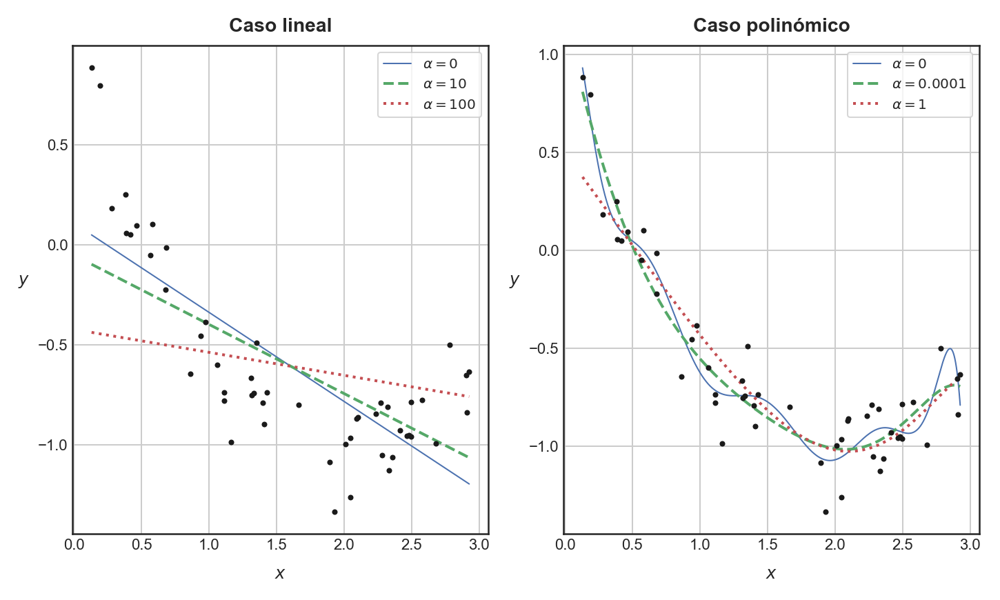

In [12]:
# Generamos nuestros gráficos.
fig, ax = plt.subplots(figsize=(10, 6), ncols=2)
plot_ridge_model(
    model_class=Ridge, polynomial=False, alphas=(0, 10, 100), X_train=X_train,
    y_train=y_train, X_new=X_new, ax=ax[0], random_state=42,
)
plot_ridge_model(
    model_class=Ridge, polynomial=True, alphas=(0, 10e-5, 1), X_train=X_train,
    y_train=y_train, X_new=X_new, ax=ax[1], random_state=42,
)
ax[0].set_ylabel(r"$y$", rotation=0, fontsize=12, labelpad=10)
ax[1].set_ylabel(r"$y$", rotation=0, fontsize=12, labelpad=10)
ax[0].set_title("Caso lineal", fontsize=14, fontweight="bold", pad=10)
ax[1].set_title("Caso polinómico", fontsize=14, fontweight="bold", pad=10)
ax[0].grid(True)
ax[1].grid(True)
plt.tight_layout();

Podemos observar que, a medida que el parámetro de regularización $\alpha$ aumenta, los modelos lineales tienden a horizontalizarse, lo que equivale a que los valores de los coeficientes tienden a estabilizarse en valores más y más pequeños. Esto es particularmente cierto en el caso de los modelos polinomiales, donde, a pesar de que el grado de los mismos es igual a $10$, la regularización de tipo $\ell_{2}$ tiende a *encoger* (aunque no anular) los coeficientes asignados a los términos polinomiales de grado más alto, logrando que el modelo resultante sea *cada vez más cuadrático*. En una revisión posterior de los coeficientes estimados podremos, naturalmente, limitar la complejidad de la transformación que estamos aplicando sobre nuestro modelo de regresión lineal. ◼︎

**Ejemplo 4.15 – La regresión de tipo "ridge" y el efecto de "shrinkage"**: El ejemplo (3.14) pone de manifiesto algo que es deseable de la regresión de tipo "ridge", que es el hecho de que ésta permite "encoger" (aunque no anular) los coeficientes de regresión asociados a las variables independientes que no contribuyen con información "valiosa" al modelo. Esto es particularmente en el caso de regresiones polinomiales de alto grado, ya que permite *encoger* los parámetros asociados a las variables transformadas con potencias que son más altas de lo necesario.

En este ejemplo, veremos como los coeficientes asociados a las variables independientes que constituyen un conjunto de entrenamiento son influenciados a medida que la potencia $\alpha$ de la regularización de tipo $\ell_{2}$ aumenta. Este ejemplo puede encontrarse en la [documentación de **<font color='mediumorchid'>Scikit-Learn</font>**](https://scikit-learn.org/stable/auto_examples/linear_model/plot_ridge_coeffs.html#sphx-glr-auto-examples-linear-model-plot-ridge-coeffs-py), y aquí simplemente lo traducimos porque es perfecto para ilustrar el efecto de encogimiento o *shrinkage* propio de la regularización de tipo $\ell_{2}$.

Partiremos construyendo nuestro conjunto de datos haciendo uso de la función `make_regression()`, la que acepta, entre otros, los siguientes argumentos:

- `n_samples`: El número de instancias del conjunto de datos a construir.
- `n_features`: El número de variables independientes del conjunto de datos a construir.
- `n_informative`: El número de variables que efectivamente contriubuyen con información sobre la variable dependiente. *Tras bambalinas*, esto significa que la variable dependiente es construida por medio de un modelo de regresión que tiene `n_informative` variables independientes, siendo la diferencia entre `n_features` y `n_informative` el total de variables independientes que únicamente aportan ruido (y que están ahí únicamente para dificultar nuestro problema, a modo de benchmark).
- `coef`: Parámetro booleano que permite retornar los coeficientes de regresión *reales* que generaron el conjunto de datos.
- `random_state`: Parámetro que permite fijar la semilla aleatoria del generador de puntos. Naturalmente, este parámetro nos permite asegurar la reproducibilidad del conjunto de datos.

Procedemos por tanto como sigue:

In [13]:
from sklearn.datasets import make_regression

In [14]:
# Creamos un conjunto de datos apto para plantear un modelo de regresión.
X, y, w = make_regression(
    n_samples=250, n_features=10, n_informative=8, coef=True, random_state=42
)

Los coeficientes reales que han generado este conjunto de datos son los siguientes:

In [15]:
# Revisamos los valores de los coeficientes "reales" que deberíamos estimar.
print("Coeficientes 'reales' que queremos estimar:")
for wk in w:
    print(f"{round(wk, 4)}")

Coeficientes 'reales' que queremos estimar:
30.9807
0.0
28.9187
11.0432
0.0
51.5006
24.9957
53.5554
81.4126
68.5134


Listando las variables como $x_{1},x_{2},...,x_{10}$, podemos observar que las variables no informativas (que sólo aportan con ruido) de este conjunto de datos son $x_{2}$ y $x_{5}$.

Para testear el efecto de la potencia del término de regularización $\ell_{2}$, setearemos un arreglo de valores en secuencia de tipo logarítmica por medio de la función `np.logspace()`. Esta función trabaja exactamente igual que `np.linspace()`:

In [16]:
# Generamos algunos valores para el parámetro de regularización uniformemente distribuidos en una escala logarítmica.
alphas = np.logspace(start=-3, stop=4, num=200)

Y finalmente entrenamos modelos para cada valor de $\alpha$:

In [17]:
# Generamos algunas listas para almacenar nuestros resultados.
coefs = []
errors = []

In [18]:
# Entrenamos un set de modelos para cada uno de estas potencias de regularización.
model = Ridge()
for alpha_k in alphas:
    model.set_params(alpha=alpha_k).fit(X, y)
    coefs.append(model.coef_)
    errors.append(mean_squared_error(model.coef_, w))

Guardamos nuestros resultados en formatos adecuados y visualizamos los resultados:

In [19]:
# Guardamos nuestros resultados en estructuras de Pandas.
alphas = pd.Index(alphas, name="Potencia regularización")
coefs = pd.DataFrame(coefs, index=alphas, columns=[f"Variable {i}" for i in range(1, 11)])
errors = pd.Series(errors, index=alphas, name="MSE")

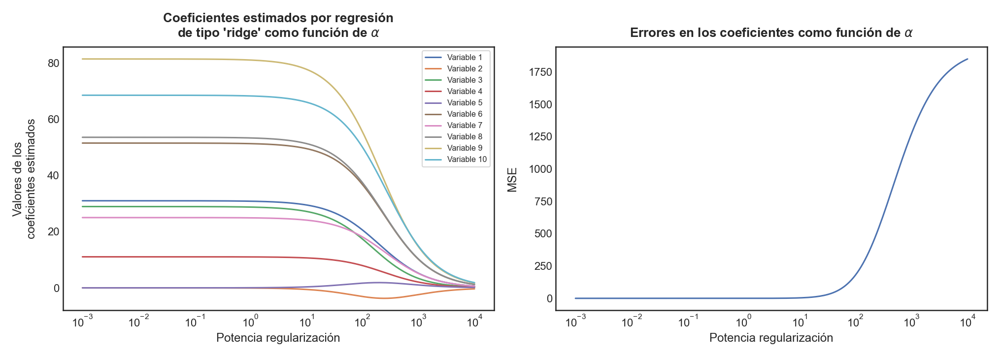

In [20]:
# Visualizamos los resultados
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(14, 5))
coefs.plot(ax=ax[0], logx=True)
ax[0].set_title(
    "Coeficientes estimados por regresión\n" + r"de tipo 'ridge' como función de $\alpha$",
    fontsize=13, fontweight="bold", pad=10,
)
ax[0].set_ylabel("Valores de los\ncoeficientes estimados", fontsize=12, labelpad=10)
errors.plot(ax=ax[1], logx=True)
ax[1].set_title(
    r"Errores en los coeficientes como función de $\alpha$",
    fontsize=13, fontweight="bold", pad=10,
)
ax[0].legend(fontsize=8, frameon=True, loc="best")
ax[1].set_ylabel("MSE", fontsize=12, labelpad=10)
plt.tight_layout();

Notemos que los coeficientes asociados a las variables no informativas $x_{2}$ y $x_{5}$ se mantienen siempre con magnitudes bajas, independientemente de la potencia del término de regularización. El resto de coeficientes mantienen todos ellos valores similares a los *reales*, empezando a *encogerse* cuando $\alpha=1$. Este efecto de *shrinkage* incrementa enormemente a medida que las potencias de $\alpha$ aumentan, generando un decrecimiento en las magnitudes de los coeficientes que termina por elevar el error cuadrático medio del modelo de manera progresiva. Podemos concluir que el valor *umbral* de la potencia del término de regularización es precisamente $\alpha=1$, porque cuando $\alpha>1$, el error cuadrático medio comienza a crecer. Por lo tanto, es evidente que existe que existe un trade-off en la forma como la regresión de tipo "ridge" combate la regularización, y que tiene una relación directa con la elección del valor óptimo de $\alpha$. ◼︎

**Ejemplo 4.16 – El valor óptimo de $\alpha$:** Un asunto que no hemos tratado aún es la elección de un parámetro de regularización $\alpha$ óptimo, y es algo que vimos tangencialmente en el ejemplo anterior. Tal elección plantea una cuestión importante en el marco de referencia de los modelos de regresión lineal, porque no podemos incrementar el valor de $\alpha$ de manera indiscriminada, ya que, a partir de un cierto umbral, el error cuadrático medio asociado a nuestro modelo comienza a crecer, generándose un efecto de "shrinkage" descontrolado en los parámetros estimados por la regresión.

En este ejemplo, exploraremos dos enfoques para encontrar un valor óptimo del parámetro $\alpha$: Uno teórico, basado en la teoría de optimización, y otro práctico, basado en la implementación de un procedimiento de validación cruzada.

Partiremos con el enfoque teórico. En este contexto, buscaremos el valor de $\alpha$ que minimiza el valor esperado del error cuadrático medio de nuestro modelo. Recordemos que, para cualquier estimador $\hat{\mathbf{\theta}}$ de un parámetro $\mathbf{\theta}$ (donde $\hat{\mathbf{\theta}}, \mathbf{\theta}\in \mathbb{R}^{n}$), el correspondiente error cuadrático medio (en norma $\ell_{2}$) viene dado por 

$$\mathrm{MSE} \left( \hat{\mathbf{\theta}} \right) =\mathrm{E} \left[ \left\Vert \hat{\mathbf{\theta}} -\mathbf{\theta} \right\Vert_{2}^{2} \right]$$ 
<p style="text-align: right;">$(4.74)$</p>

Por lo tanto, para un estimador de tipo "ridge", denotado como $\hat{\mathbf{w}}_{\mathrm{ridge}}\in \mathbb{R}^{n}$, y que estima a los coeficientes "reales", aglutinados en un vector $\mathbf{w}\in \mathbb{R}^{n}$, en un problema de regresión, se tendrá que el error de estimación vendrá dado por
 
$$\mathrm{MSE} \left( \alpha \right) =\mathrm{E} \left[ \left\Vert \hat{\mathbf{w}}_{\mathrm{ridge}} \left( \alpha \right) -\mathbf{w} \right\Vert_{2}^{2} \right]$$
<p style="text-align: right;">$(4.75)$</p>

Sin pérdida de generalidad, para un conjunto de entrenamiento $\mathcal{D} =\left\{ \left( \mathbf{X} ,\mathbf{y} \right) :\mathbf{X} \in \mathbb{R}^{m\times n} \wedge \mathbf{y} \in \mathbb{R}^{n} \right\}$, consideremos el modelo $\mathbf{y} =\mathbf{X} \mathbf{w} +\mathbf{\varepsilon}$, donde $\mathbf{\varepsilon} \sim \mathcal{N} \left( \mathbf{0} ,\sigma^{2} \mathbf{I} \right)$ es el ruido asociado a las observaciones de $\mathcal{D}$. Queremos estimar el error (4.75) en función únicamente de $\alpha$. Para ello, consideraremos las ecuaciones que definen al estimador $\hat{\mathbf{w}}_{\mathrm{ridge}}$ y su correspondiente sesgo y varianza en una única expresión,

$$\begin{array}{lll}\hat{\mathbf{w}}_{\mathrm{ridge}}&=&\left( \mathbf{X}^{\top} \mathbf{X} +\alpha \mathbf{I} \right)^{-1} \mathbf{X}^{\top} \mathbf{y}\\ B\left( \hat{\mathbf{w}}_{\mathrm{ridge}} \right)&=&-\alpha \left( \mathbf{X}^{\top} \mathbf{X} +\alpha \mathbf{I} \right)^{-1} \mathbf{w}\\ \mathrm{Var} \left( \hat{\mathbf{w}}_{\mathrm{ridge}} \right)&=&\sigma^{2} \left( \mathbf{X}^{\top} \mathbf{X} +\alpha \mathbf{I} \right)^{-1} \mathbf{X}^{\top} \mathbf{X} \left( \mathbf{X}^{\top} \mathbf{X} +\alpha \mathbf{I} \right)^{-1}\end{array}$$
<p style="text-align: right;">$(4.76)$</p>

Debemos descomponer el error cuadrático medio en una suma de términos que involucran el sesgo y la varianza del correspondiente estimador (independiente de cuál sea). Para ello, consideremos la ecuación (4.75) y las correspondientes definiciones generales de sesgo y varianza para todo estimador $\hat{\mathbf{w}}$,

$$\begin{array}{lll}B\left( \hat{\mathbf{w}} \right)&=&\mathrm{E} \left[ \hat{\mathbf{w}} \right] -\mathbf{w}\\ \mathrm{Var} \left( \hat{\mathbf{w}} \right)&=&\mathrm{E} \left[ \left( \hat{\mathbf{w}} -\mathrm{E} \left[ \hat{\mathbf{w}} \right] \right) \left( \hat{\mathbf{w}} -\mathrm{E} \left[ \hat{\mathbf{w}} \right] \right)^{\top} \right]\end{array}$$
<p style="text-align: right;">$(4.77)$</p>

Notemos además que la diferencia entre el estimador $\hat{\mathbf{w}}$ y el vector *"real"* de parámetros $\mathbf{w}$ puede expresarse como

$$\begin{array}{lll}\hat{\mathbf{w}} -\mathbf{w}&=&\hat{\mathbf{w}} -\mathbf{w} \underbrace{-\mathrm{E} \left[ \hat{\mathbf{w}} \right] +\mathrm{E} \left[ \hat{\mathbf{w}} \right]}_{=0}\\ &=&\left( \hat{\mathbf{w}} -\mathrm{E} \left[ \hat{\mathbf{w}} \right] \right) +\underbrace{\left( \mathrm{E} \left[ \hat{\mathbf{w}} \right] -\mathbf{w} \right)}_{\mathrm{sesgo\  de} \  \hat{\mathbf{w}}}\\ &=&\left( \hat{\mathbf{w}} -\mathrm{E} \left[ \hat{\mathbf{w}} \right] \right) +B\left( \hat{\mathbf{w}} \right)\end{array}$$
<p style="text-align: right;">$(4.78)$</p>

Por lo tanto, la diferencia $\hat{\mathbf{w}} -\mathbf{w}$ puede descomponerse en dos términos. El primero corresponde a la desviación entre el estimador propiamente y su valor esperado, $\hat{\mathbf{w}} -\mathrm{E} \left[ \hat{\mathbf{w}} \right]$, y que en la práctica permite capturar la variabilidad asociada al ruido aleatorio inherente a las correspondientes variables independientes de nuestro modelo. El segundo es el sesgo del estimador $\hat{\mathbf{w}}$, y que captura la diferencia sistemática entre los parámetros estimados y los coeficientes "reales" que *generan* el conjunto  de entrenamiento (que, recordemos, en la práctica será difícil que los conozcamos).

Expandiendo la exresión $\mathrm{MSE} \left( \hat{\mathbf{w}} \right) =\mathrm{E} \left[ \left\Vert \hat{\mathbf{w}} -\mathbf{w} \right\Vert_{2}^{2} \right]$ aplicando algo de álgebra, obtenemos

$$\begin{array}{lll}\mathrm{MSE} \left( \hat{\mathbf{w}} \right)&=&\mathrm{E} \left[ \left\Vert \hat{\mathbf{w}} -\mathbf{w} \right\Vert_{2}^{2} \right]\\ &=&\mathrm{E} \left[ \left( \hat{\mathbf{w}} -\mathbf{w} \right)^{\top} \left( \hat{\mathbf{w}} -\mathbf{w} \right) \right]\\ &=&\mathrm{E} \left[ \left( \left( \hat{\mathbf{w}} -\mathrm{E} \left[ \hat{\mathbf{w}} \right] \right) +B\left( \hat{\mathbf{w}} \right) \right)^{\top} \left( \left( \hat{\mathbf{w}} -\mathrm{E} \left[ \hat{\mathbf{w}} \right] \right) +B\left( \hat{\mathbf{w}} \right) \right) \right]\\ &=&\mathrm{E} \left[ \left( \hat{\mathbf{w}} -\mathrm{E} \left[ \hat{\mathbf{w}} \right] \right)^{\top} \right] +2\mathrm{E} \left[ \left( \hat{\mathbf{w}} -\mathrm{E} \left[ \hat{\mathbf{w}} \right] \right)^{\top} B\left( \hat{\mathbf{w}} \right) \right] +\left( B\left( \hat{\mathbf{w}} \right) \right)^{\top} B\left( \hat{\mathbf{w}} \right)\end{array}$$
<p style="text-align: right;">$(4.79)$</p>

Notemos que $B\left( \hat{\mathbf{w}} \right)$ es un vector constante (ya que $\mathbf{w}$ y $\mathrm{E} \left[ \hat{\mathbf{w}} \right]$ son fijos) y, por definición, el vector aleatorio $\hat{\mathbf{w}} -\mathrm{E} \left[ \hat{\mathbf{w}} \right]$ tiene una media igual a cero. Por lo tanto, $\mathrm{E} \left[ \hat{\mathbf{w}} -\mathrm{E} \left[ \hat{\mathbf{w}} \right] \right] =\mathbf{0}$, con lo cual podemos seguir desarrollando la expresión (4.79) como sigue,

$$\begin{array}{lll}\mathrm{MSE} \left( \hat{\mathbf{w}} \right)&=&\mathrm{E} \left[ \left( \hat{\mathbf{w}} -\mathrm{E} \left[ \hat{\mathbf{w}} \right] \right)^{\top} \right] +2\mathrm{E} \left[ \left( \hat{\mathbf{w}} -\mathrm{E} \left[ \hat{\mathbf{w}} \right] \right)^{\top} B\left( \hat{\mathbf{w}} \right) \right] +\underbrace{\left( B\left( \hat{\mathbf{w}} \right) \right)^{\top} B\left( \hat{\mathbf{w}} \right)}_{\left\Vert B\left( \hat{\mathbf{w}} \right) \right\Vert_{2}^{2}}\\ &=&\mathrm{E} \left[ \left( \hat{\mathbf{w}} -\mathrm{E} \left[ \hat{\mathbf{w}} \right] \right)^{\top} \right] +2\left( B\left( \hat{\mathbf{w}} \right)^{\top} \underbrace{\mathrm{E} \left[ \hat{\mathbf{w}} -\mathrm{E} \left[ \hat{\mathbf{w}} \right] \right]}_{=\mathbf{0}} \right) +\left\Vert B\left( \hat{\mathbf{w}} \right) \right\Vert_{2}^{2}\\ &=&\mathrm{E} \left[ \left( \hat{\mathbf{w}} -\mathrm{E} \left[ \hat{\mathbf{w}} \right] \right)^{\top} \left( \hat{\mathbf{w}} -\mathrm{E} \left[ \hat{\mathbf{w}} \right] \right) \right] +\left\Vert B\left( \hat{\mathbf{w}} \right) \right\Vert_{2}^{2}\end{array}$$
<p style="text-align: right;">$(4.80)$</p>

Observemos además que,

$$\begin{array}{lll}\mathrm{E} \left[ \left( \hat{\mathbf{w}} -\mathrm{E} \left[ \hat{\mathbf{w}} \right] \right)^{\top} \left( \hat{\mathbf{w}} -\mathrm{E} \left[ \hat{\mathbf{w}} \right] \right) \right]&=&\displaystyle \mathrm{E} \left[ \sum_{j=1}^{n} \left( \hat{w}_{j} -\mathrm{E} +\left[ \hat{w}_{j} \right] \right)^{2} \right]\\ &=&\displaystyle \sum_{j=1}^{n} \mathrm{Var} \left( \hat{w}_{j} \right)\\ &=&\mathrm{tr} \left( \mathrm{Var} \left( \hat{\mathbf{w}} \right) \right)\end{array}$$
<p style="text-align: right;">$(4.81)$</p>

Por lo tanto, poniendo $\hat{\mathbf{w}} =\hat{\mathbf{w}}_{\mathrm{ridge}}$, llegamos finalmente a la importante expresión

$$\mathrm{MSE} \left( \alpha \right) =\left\Vert B\left( \hat{\mathbf{w}}_{\mathrm{ridge}} \right) \right\Vert_{2}^{2} +\mathrm{tr} \left( \mathrm{Var} \left( \hat{\mathbf{w}}_{\mathrm{ridge}} \right) \right)$$
<p style="text-align: right;">$(4.82)$</p>

La ecuación (4.82) es llamada **trade-off entre sesgo y varianza** para el estimador $\hat{\mathbf{w}}_{\mathrm{ridge}}$. A fin de simplificar esta expresión conforme el uso del parámetro de regularización $\alpha$, implementaremos una descomposición de la matriz $\mathbf{X}^{\top}\mathbf{X}$ del tipo

$$\mathbf{X}^{\top} \mathbf{X} =\mathbf{P} \mathbf{A} \mathbf{P}^{\top}$$
<p style="text-align: right;">$(4.82)$</p>

Donde,

- $\mathbf{P}$ es una matriz ortonomal constituida por los autovectores de $\mathbf{X}^{\top}\mathbf{X}$ (es decir, $\mathbf{P}^{\top} \mathbf{P} =\mathbf{I}$).
- $\mathbf{A} =\mathrm{diag} \left( \lambda_{1} ,...,\lambda_{n} \right)$ es una matriz diagonal que contiene todos los autovalores $\lambda_{j}\geq 0$ de $\mathbf{X}^{\top}\mathbf{X}$.

Definamos los siguientes cambios de variables:

- Transformación de coeficientes de regresión: $\widetilde{\mathbf{w}} =\mathbf{P}^{\top} \mathbf{w}$.
- Transformación del error $\widetilde{\mathbf{\varepsilon}} =\mathbf{P}^{\top} \mathbf{\varepsilon}$.

Consideremos la matriz $\mathbf{V} =\left( \mathbf{X}^{\top} \mathbf{X} +\alpha \mathbf{I} \right)^{-1} \mathbf{X}^{\top} \mathbf{X}$, que ya usamos previamente para obtener el sesgo del estimador $\hat{\mathbf{w}}$ en función de $\mathbf{X},\mathbf{w}$ y $\alpha$ (ecuación (4.72)). Desarrollando $\mathbf{V}$ obtenemos

$$\begin{array}{lll}\mathbf{V}&=&\left( \mathbf{X}^{\top} \mathbf{X} +\alpha \mathbf{I} \right)^{-1} \mathbf{X}^{\top} \mathbf{X} \  \left( \mathrm{pero} \  \mathbf{X}^{\top} \mathbf{X} =\mathbf{P} \mathbf{A} \mathbf{P}^{\top} \right)\\ &=&\left( \mathbf{P} \mathbf{A} \mathbf{P}^{\top} +\alpha \mathbf{I} \right)^{-1} \mathbf{P} \mathbf{A} \mathbf{P}^{\top} \  \left( \mathrm{tenemos\  que} \  \mathbf{I} =\mathbf{P} \mathbf{I} \mathbf{P}^{\top} \right)\\ &=&\left( \mathbf{P} \mathbf{A} \mathbf{P}^{\top} +\alpha \mathbf{P} \mathbf{I} \mathbf{P}^{\top} \right)^{-1} \mathbf{P} \mathbf{A} \mathbf{P}^{\top} \  \left( \mathrm{factorizamos} \right)\\ &=&\left( \mathbf{P} \left( \mathbf{A} +\alpha \mathbf{I} \right) \mathbf{P}^{\top} \right)^{-1} \mathbf{P} \mathbf{A} \mathbf{P}^{\top}\\ &=&\mathbf{P} \left( \mathbf{A} +\alpha \mathbf{I} \right)^{-1} \underbrace{\mathbf{P}^{\top} \mathbf{P}}_{=\mathbf{I}} \mathbf{A} \mathbf{P}^{\top}\\ &=&\mathbf{P} \left( \mathbf{A} +\alpha \mathbf{I} \right)^{-1} \mathbf{A} \mathbf{P}^{\top}\end{array}$$
<p style="text-align: right;">$(4.83)$</p>

Poniendo $\mathbf{D} =\left( \mathbf{A} +\alpha \mathbf{I} \right)^{-1} \mathbf{A}$, podemos observar que la última línea de la expresión (4.83) se reduce a

$$\mathbf{V} =\mathbf{P} \mathbf{D} \mathbf{P}^{\top}$$
<p style="text-align: right;">$(4.84)$</p>

Recordemos que las matrices $\mathbf{A}$ y $\mathbf{A}+ \lambda \mathbf{I}$ son ambas diagonales, por lo que todas las operaciones aritméticas que apliquemos sobre ellas serán más bien directas. En particular, cada uno de los elementos diagonales de la matriz $\mathbf{D}$ puede escribirse como

$$d_{j}=\frac{\lambda_{j}}{\lambda_{j} +\alpha} \  ;\  j=1,...,n$$
<p style="text-align: right;">$(4.85)$</p>

Donde $\lambda_{j}$ es el $j$-ésimo autovalor de $\mathbf{X}^{\top}\mathbf{X}$. De esta manera, $\mathbf{D}$ es una matriz diagonal con elementos definidos como

$$\mathbf{D} =\mathrm{diag} \left( \frac{\lambda_{1}}{\lambda_{1} +\alpha} ,...,\frac{\lambda_{n}}{\lambda_{n} +\alpha} \right)$$
<p style="text-align: right;">$(4.86)$</p>

Con toda esta información, volvamos a las definiciones de los elementos constitutivos del error cuadrático medio. En primer lugar, desarrollamos la expresión para el sesgo del estimador de tipo "ridge":

$$\begin{array}{lll}B\left( \hat{\mathbf{w}}_{\mathrm{ridge}} \right)&=&-\alpha \left( \mathbf{X}^{\top} \mathbf{X} +\alpha \mathbf{I} \right)^{-1} \mathbf{w}\\ &=&\left( \mathbf{X}^{\top} \mathbf{X} +\alpha \mathbf{I} \right)^{-1} \left( \mathbf{X}^{\top} \mathbf{X} -\left( \mathbf{X}^{\top} \mathbf{X} +\alpha \mathbf{I} \right) \right) \mathbf{w}\\ &=&\left( \underbrace{\left( \mathbf{X}^{\top} \mathbf{X} +\alpha \mathbf{I} \right)^{-1} \mathbf{X}^{\top} \mathbf{X}}_{=\mathbf{V}} -\mathbf{I} \right) \mathbf{w}\\ &=&\left( \underbrace{\mathbf{V}}_{=\mathbf{P} \mathbf{D} \mathbf{P}^{\top}} -\mathbf{I} \right) \mathbf{w}\\ &=&\left( \mathbf{P} \mathbf{D} \mathbf{P}^{\top} -\mathbf{I} \right) \mathbf{w}\\ &=&\mathbf{P} \left( \mathbf{D} -\mathbf{I} \right) \underbrace{\mathbf{P}^{\top} \mathbf{w}}_{=\widetilde{\mathbf{w}}}\\ &=&\mathbf{P} \left( \mathbf{D} -\mathbf{I} \right) \widetilde{\mathbf{w}}\end{array}$$
<p style="text-align: right;">$(4.87)$</p>

Por lo tanto,

$$\begin{array}{lll}\left\Vert B\left( \hat{\mathbf{w}}_{\mathrm{ridge}} \right) \right\Vert_{2}^{2}&=&\left\Vert \left( \mathbf{D} -\mathbf{I} \right) \widetilde{\mathbf{w}} \right\Vert_{2}^{2}\\ &=&\displaystyle \sum_{j=1}^{n} \left( \frac{-\alpha}{\lambda_{j} +\alpha} \widetilde{w}_{j} \right)^{2}\\ &=&\displaystyle \sum_{j=1}^{n} \left( \frac{\alpha \widetilde{w}_{j}}{\lambda_{j} +\alpha} \right)^{2}\end{array}$$
<p style="text-align: right;">$(4.88)$</p>

Ahora desarrollamos la expresión para la varianza,

$$\begin{array}{lll}\mathrm{Var} \left( \widehat{\mathbf{w}}_{\mathrm{ridge}} \right)&=&\sigma^{2} \underbrace{\left( \mathbf{X}^{\top} \mathbf{X} +\alpha \mathbf{I} \right)^{-1}}_{=\mathbf{P} \left( \mathbf{A} +\alpha \mathbf{I} \right)^{-1} \mathbf{P}^{\top}} \overbrace{\mathbf{X}^{\top} \mathbf{X}}^{=\mathbf{P} \mathbf{A} \mathbf{P}^{\top}} \underbrace{\left( \mathbf{X}^{\top} \mathbf{X} +\alpha \mathbf{I} \right)^{-1}}_{=\mathbf{P} \left( \mathbf{A} +\alpha \mathbf{I} \right)^{-1} \mathbf{P}^{\top}}\\ &=&\sigma^{2} \mathbf{P} \left( \mathbf{A} +\alpha \mathbf{I} \right)^{-1} \underbrace{\mathbf{P}^{\top} \mathbf{P}}_{=\mathbf{I}} \mathbf{A} \underbrace{\mathbf{P}^{\top} \mathbf{P}}_{=\mathbf{I}} \left( \mathbf{A} +\alpha \mathbf{I} \right)^{-1} \mathbf{P}^{\top}\\ &=&\sigma^{2} \mathbf{P} \left( \mathbf{A} +\alpha \mathbf{I} \right)^{-1} \mathbf{A} \left( \mathbf{A} +\alpha \mathbf{I} \right)^{-1} \mathbf{P}^{\top}\end{array}$$
<p style="text-align: right;">$(4.89)$</p>

Notemos que la matriz $\left( \mathbf{A} +\alpha \mathbf{I} \right)^{-1}$ es diagonal. Cada una de sus entradas diagonales se definen como $d_{j}= \mathrm{diag} \left( \frac{1}{\lambda_{1} +\alpha} ,...,\frac{1}{\lambda_{n} +\alpha} \right)$. Por lo tanto, se tiene que $\left( \mathbf{A} +\alpha \mathbf{I} \right)^{-1} \mathbf{A} =\mathrm{diag} \left( \frac{\lambda_{1}}{\lambda_{1} +\alpha} ,...,\frac{\lambda_{n}}{\lambda_{n} +\alpha} \right)$. Uniendo todas estas piezas llegamos a

$$\begin{array}{lll}\mathrm{Var} \left( \hat{\mathbf{w}}_{\mathrm{ridge}} \right)&=&\displaystyle \sigma^{2} \mathbf{P} \  \mathrm{diag} \left( \frac{1}{\lambda_{1} +\alpha} ,...,\frac{1}{\lambda_{n} +\alpha} \right) \mathrm{diag} \left( \lambda_{1} ,...,\lambda_{n} \right) \mathrm{diag} \left( \frac{1}{\lambda_{1} +\alpha} ,...,\frac{1}{\lambda_{n} +\alpha} \right) \mathbf{P}^{\top}\\ &=&\displaystyle \sigma^{2} \mathbf{P} \  \mathrm{diag} \left( \left( \frac{\lambda_{1}}{\lambda_{1} +\alpha} \right)^{2} ,...,\left( \frac{\lambda_{n}}{\lambda_{n} +\alpha} \right)^{2} \right) \mathbf{P}^{\top}\end{array}$$
<p style="text-align: right;">$(4.90)$</p>

Por lo tanto,

$$\mathrm{tr} \left( \mathrm{Var} \left( \hat{\mathbf{w}}_{\mathrm{ridge}} \right) \right) =\sigma^{2} \sum_{j=1}^{n} \left( \frac{\lambda_{j}}{\lambda_{j} +\alpha} \right)^{2}$$
<p style="text-align: right;">$(4.91)$</p>

Las ecuaciones (4.88) y (4.91) nos permiten finalmente expresar el error cuadrático medio asociado al estimador de tipo "ridge" en función del parámetro de regularización $\alpha$:

$$\begin{array}{lll}\mathrm{MSE} \left( \alpha \right)&=&\displaystyle \sum_{j=1}^{n} \left( \frac{\alpha \widetilde{w}_{j}}{\lambda_{j} +\alpha} \right)^{2} +\sigma^{2} \sum_{j=1}^{n} \left( \frac{\lambda_{j}}{\lambda_{j} +\alpha} \right)^{2}\\ &=&\displaystyle \sum_{j=1}^{n} \left[ \left( \frac{\alpha \widetilde{w}_{j}}{\lambda_{j} +\alpha} \right)^{2} +\sigma^{2} \left( \frac{\lambda_{j}}{\lambda_{j} +\alpha} \right)^{2} \right]\end{array}$$
<p style="text-align: right;">$(4.92)$</p>

Para determinar el valor óptimo de $\alpha$, debemos minimizar el argumento de la sumatoria en la última línea de la expresión (4.92). Es decir, debemos resolver el problema de optimización

$$\min_{\alpha} \left( \mathrm{MSE}_{j} \left( \alpha \right) \right) =\left( \frac{\alpha \widetilde{w}_{j}}{\lambda_{j} +\alpha} \right)^{2} +\sigma^{2} \left( \frac{\lambda_{j}}{\lambda_{j} +\alpha} \right)^{2} \  ;\  j=1,...,n$$
<p style="text-align: right;">$(4.93)$</p>

Para ello, derivamos la función objetivo en (4.93) con respecto al parámetro de regularización $\alpha$ e igualamos la correspondiente derivada a cero, a fin de encontrar el o los correspondientes puntos críticos. Para ello, supondremos que tenemos conocimiento de los parámetros $\widetilde{w}_{j}$ y $\lambda_{j}$ para todo $j=1,...,n$. A fin de evitar encontrarnos con una expresión analíticamente difícil de evaluar, asumiremos además que las $\widetilde{w}_{j}$ son variables aleatorias con la misma varianza igual a $\tau^{2}$. De esta manera, el valor esperado del error cuadrático medio sobre $\widetilde{w}_{j}$ será

$$\begin{array}{lll}\mathrm{E} \left[ \mathrm{MSE}_{j} \left( \alpha \right) \right]&=&\displaystyle \frac{\alpha^{2} \overbrace{\mathrm{E} \left[ \widetilde{w}_{j}^{2} \right]}^{\tau^{2}}}{\left( \lambda_{j} +\alpha^{2} \right)} +\sigma^{2} \left( \frac{\lambda_{j}}{\lambda_{j} +\alpha} \right)^{2}\\ &=&\displaystyle \frac{\alpha^{2} \tau^{2}}{\left( \lambda_{j} +\alpha^{2} \right)} +\sigma^{2} \left( \frac{\lambda_{j}}{\lambda_{j} +\alpha} \right)^{2}\end{array}$$
<p style="text-align: right;">$(4.94)$</p>

Así que,

$$\mathrm{E} \left[ \mathrm{MSE}_{j} \left( \alpha \right) \right] =\sum_{j=1}^{n} \left[ \frac{\alpha^{2} \tau^{2}}{\left( \lambda_{j} +\alpha \right)^{2}} +\sigma^{2} \left( \frac{\lambda_{j}}{\lambda_{j} +\alpha} \right)^{2} \right]$$
<p style="text-align: right;">$(4.95)$</p>

De esta manera,

$$\begin{array}{lll}\displaystyle \frac{d}{d\alpha} \left( \mathrm{MSE}_{j} \left( \alpha \right) \right)&=&\displaystyle \tau^{2} \frac{d}{d\alpha} \left( \frac{\alpha^{2}}{\left( \lambda_{j} +\alpha^{2} \right)} \right) +\sigma^{2} \frac{d}{d\alpha} \left( \frac{\lambda_{j}}{\lambda_{j} +\alpha} \right)^{2}\\ &=&\displaystyle \tau^{2} \left[ \frac{2\alpha \left( \lambda_{j} +\alpha \right)^{2} -2\alpha^{2} \left( \lambda_{j} +\alpha \right)}{\left( \lambda_{j} +\alpha \right)^{4}} \right] +2\sigma^{2} \left( \frac{\lambda_{j}}{\lambda_{j} +\alpha} \right) \left( -\frac{\lambda_{j}}{\left( \lambda_{j} +\alpha \right)^{2}} \right)\\ &=&\displaystyle \tau^{2} \left[ \frac{2\alpha \left( \lambda_{j} +\alpha \right) \left( \left( \lambda_{j} +\alpha \right) -\alpha \right)}{\left( \lambda_{j} +\alpha \right)^{4}} \right] -2\sigma^{2} \frac{\lambda_{j}^{2}}{\left( \lambda_{j} +\alpha \right)^{3}}\\ &=&\displaystyle \tau^{2} \left[ \frac{2\alpha \left( \lambda_{j} +\alpha \right) -2\alpha^{2}}{\left( \lambda_{j} +\alpha \right)^{3}} \right] -2\sigma^{2} \frac{\lambda_{j}^{2}}{\left( \lambda_{j} +\alpha \right)^{3}}\\ &=&\displaystyle \tau^{2} \left[ \frac{2\alpha \lambda_{j} +\overbrace{2\alpha^{2} -2\alpha^{2}}^{=0}}{\left( \lambda_{j} +\alpha \right)^{3}} \right] -2\sigma^{2} \frac{\lambda_{j}^{2}}{\left( \lambda_{j} +\alpha \right)^{3}}\\ &=&\displaystyle \tau^{2} \frac{2\alpha \lambda_{j}}{\left( \lambda_{j} +\alpha \right)^{3}} -2\sigma^{2} \frac{\lambda_{j}^{2}}{\left( \lambda_{j} +\alpha \right)^{3}}\end{array}$$
<p style="text-align: right;">$(4.96)$</p>

Luego, igualando la derivada a cero, obtenemos

$$\begin{array}{ll}&\displaystyle \tau^{2} \frac{2\alpha \lambda_{j}}{\left( \lambda_{j} +\alpha \right)^{3}} -2\sigma^{2} \frac{\lambda_{j}^{2}}{\left( \lambda_{j} +\alpha \right)^{3}} =0\\ \Longleftrightarrow&\displaystyle \tau^{2} \frac{\alpha \lambda_{j}}{\left( \lambda_{j} +\alpha \right)^{3}} -\sigma^{2} \frac{\lambda_{j}^{2}}{\left( \lambda_{j} +\alpha \right)^{3}} =0\  \left( \mathrm{asumiendo\  que} \  \lambda_{j} +\alpha >0 \right)\\ \Longleftrightarrow&\displaystyle \tau^{2} \alpha \lambda_{j} -\sigma^{2} \lambda_{j}^{2} =0\\ \Longleftrightarrow&\displaystyle \tau^{2} \alpha \lambda_{j} =\sigma^{2} \lambda_{j}^{2}\\ \Longleftrightarrow&\displaystyle \alpha_{\mathrm{opt}} =\frac{\sigma^{2} \lambda_{j}^{2}}{\tau^{2} \lambda_{j}}\\ \Longleftrightarrow&\displaystyle \alpha_{\mathrm{opt}} =\frac{\sigma^{2} \lambda_{j}}{\tau^{2}}\end{array}$$
<p style="text-align: right;">$(4.97)$</p>

Por lo tanto, el valor óptimo de $\alpha$, que minimiza el error cuadrático medio del estimador de tipo "ridge", depende únicamente de la varianza $\sigma^{2}$ del ruido asociado a las observaciones que constituyen el conjunto de entrenamiento $\mathcal{D}$, de los coeficientes de regresión "reales" $\widetilde{w}_{j}$ en la base característica de $\mathbf{X}^{\top} \mathbf{X}$ y los correspondientes autovalores $\lambda_{j}$ (para $j=1,...,n$). Naturalmente, esto constituye un problema importante a nivel práctico, porque, en general, no conoceremos los valores reales que comprenden el vector $\mathbf{w}$, a pesar de poder estimar el valor de $\sigma^{2}$ a partir de los residuos del modelo. Además, los autovalores $\lambda_{1},...,\lambda_{n}$ dependen estrictamente del conjunto de entrenamiento y, naturalmente, de su magnitud, siendo así sensibles al escalamiento. Por lo tanto, la estimación del valor óptimo de $\alpha$ en la práctica suele realizarse por medio de procedimientos iterativos, siendo uno de los más utilizados el de **validación cruzada**. ◼︎

### Estimación máxima a posteriori.
Ya hemos visto que el procedimiento de regularización de modelos de regresión permite controlar, en cierta medida, la posibilidad de que nuestros modelos sufran de overfitting por medio de la restricción de los valores de los coeficientes estimados para estos modelos. El primero de los procedimientos estudiados, correspondiente a la regresión de tipo "ridge", aplica un factor de "shrinkage" que encoge cada uno de esos coeficientes en función de un parámetro de regularización $\alpha$ que, como vimos, debemos setear en función de cada conjunto de entrenamiento.

Podemos lograr un efecto similar por medio de un procedimiento alternativo, en el cual establecemos que cada uno de los coeficientes de regresión que se aglutinan en un vector $\mathbf{w}\in \mathbb{R}^{n}$, siendo $n$ el número de variables independientes del conjunto de entrenamiento, se distribuyen de una cierta manera. Dicho de otra forma, imponemos que $\mathbf{w}$ tiene una **distribución a priori** (en un contexto Bayesiano), que denotamos como $P(\mathbf{w})$. De esta forma, $P$ codifica en forma explícita qué valores son plausibles o admisibles para $\mathbf{w}$, inclusive antes de "mirar" cualquier dato. Por ejemplo, una distribución a priori de tipo Gaussiana, digamos $P(w_{j})=\mathcal{N}(0, 1)$, para $j=1,...,n$, codifica que cada $w_{j}$ *reside* en el intervalo cerrado $[-2, 2]$ (es decir, dos desviaciones a cada lado de la media). Una vez que disponemos de un conjunto de entrenamiento $\mathcal{D} =\left\{ \mathbf{X} ,\mathbf{y} :\  \mathbf{X} \in \mathbb{R}^{m\times n} \wedge \mathbf{y} \in \mathbb{R}^{n} \right\}$, en vez de maximizar la correspondiente función de verosimilitud, buscamos los parámetros $w_{1},...,w_{j}$ que maximizan la **distribución a posteriori** $P\left( \mathbf{w} |\mathcal{X} ,\mathcal{Y} \right)$, siendo $\mathcal{X}$ e $\mathcal{Y}$ los espacios de entrada y salida de $\mathcal{D}$, respectivamente. Tal procedimiento se denota como **estimación máxima a posteriori** o **MAP**.

La distribución a posteriori $P\left( \mathbf{w} |\mathcal{X} ,\mathcal{Y} \right)$ puede obtenerse por medio de la aplicación del teorema de Bayes, con lo cual

$$P\left( \mathbf{w} |\mathcal{X} ,\mathcal{Y} \right) =\frac{P\left( \mathcal{Y} |\mathcal{X} ,\mathbf{w} \right) P\left( \mathbf{w} \right)}{P\left( \mathcal{Y} |\mathcal{X} \right)}$$
<p style="text-align: right;">$(4.98)$</p>

Debido a que $P\left( \mathbf{w} |\mathcal{X} ,\mathcal{Y} \right)$ depende en forma explícita de la distribución a priori $P(\mathbf{w})$, ésta última tendrá un impacto sobre el vector de coeficientes de regresión que estimaremos como resultado de la maximización de la distribución a posteriori. Tal estimador es llamado **estimador máximo a posteriori**, y suele denotarse como $\mathbf{w}_{\mathrm{MAP}}$. Para determinarlo, es común aplicar una transformación logarítmica sobre la fórmula (4.97), con lo cual obtenemos

$$\begin{array}{lll}\log \left( P\left( \mathbf{w} |\mathcal{X} ,\mathcal{Y} \right) \right)&=&\displaystyle \log \left( \frac{P\left( \mathcal{Y} |\mathcal{X} ,\mathbf{w} \right) P\left( \mathbf{w} \right)}{P\left( \mathcal{Y} |\mathcal{X} \right)} \right)\\ &=&\log \left( P\left( \mathcal{Y} |\mathcal{X} ,\mathbf{w} \right) P\left( \mathbf{w} \right) \right) -\log \left( P\left( \mathcal{Y} |\mathcal{X} \right) \right)\\ &=&\log \left( P\left( \mathcal{Y} |\mathcal{X} ,\mathbf{w} \right) \right) +\log \left( P\left( \mathbf{w} \right) \right) -\log \left( P\left( \mathcal{Y} |\mathcal{X} \right) \right)\\ &=&\log \left( P\left( \mathcal{Y} |\mathcal{X} ,\mathbf{w} \right) \right) +\log \left( P\left( \mathbf{w} \right) \right) +\mathrm{constante}\end{array}$$
<p style="text-align: right;">$(4.99)$</p>

Podemos observar que $\log \left( P\left( \mathbf{w} |\mathcal{X} ,\mathcal{Y} \right) \right)$ es igual a la suma de una constante que aglutina a todos los términos que son independientes de $\mathbf{w}$, la función de verosimilitud logarítmica $\log \left( P\left( \mathcal{Y} |\mathcal{X} ,\mathbf{w} \right) \right)$ y la distribución logarítmica a priori $\log \left( P\left( \mathbf{w} \right) \right)$, por lo que el estimador $\mathbf{w}_{\mathrm{MAP}}$ representa un compromiso entre el conocimiento previo (resumido en los valores que hemos "sugerido" para $\mathbf{w}$ por medio de una distribución de probabilidad antes de observar los datos de entrenamiento) y los datos propiamente tales.

Como antes, estamos interesados en maximizar el valor de $\log \left( P\left( \mathbf{w} |\mathcal{X} ,\mathcal{Y} \right) \right)$ sobre $\mathbf{w}$. Por lo tanto, debemos resolver el problema

$$\mathbf{w}_{\mathrm{MAP}} \in \underset{\mathbf{w}}{\mathrm{argmin}} \left\{ -\log \left( P\left( \mathcal{Y} |\mathcal{X} ,\mathbf{w} \right) \right) -\log \left( P\left( \mathbf{w} \right) \right) \right\}$$
<p style="text-align: right;">$(4.100)$</p>

Como en todos los casos anteriores, procedemos derivando la distribución logarítmica a posteriori, obteniendo

$$\frac{\partial}{\partial \mathbf{w}} \left( \log \left( P\left( \mathbf{w} |\mathcal{X} ,\mathcal{Y} \right) \right) \right) =-\frac{\partial}{\partial \mathbf{w}} \left( \log \left( P\left( \mathcal{Y} |\mathcal{X} ,\mathbf{w} \right) \right) \right) -\frac{\partial}{\partial \mathbf{w}} \left( \log \left( P\left( \mathbf{w} \right) \right) \right)$$
<p style="text-align: right;">$(4.101)$</p>

Notemos que el primer sumando del lado derecho corresponde al gradiente de la función de verosimilitud logarítmica que ya calculamos previamente en la expresión (4.27) para el caso unidimensional, y en la expresión (4.31) para el caso general –que incluye transformaciones lineales en los parámetros de regresión–.

Usando una distribución a priori (conjugada) Gaussiana, tal que $P\left( \mathbf{w} \right) =\mathcal{N} \left( \mathbf{0} ,\tau^{2}\mathbf{I} \right)$ sobre el vector de parámetros $\mathbf{w}$, y la expresión que ya hemos construido en (4.27) y (4.31) para la distribución logarítmica a posteriori $\log \left( P\left( \mathcal{Y} |\mathcal{X} ,\mathbf{w} \right) \right)$, obtenemos

$$-\log \left( P\left( \mathbf{w} |\mathcal{X} ,\mathcal{Y} \right) \right) =\frac{1}{2\sigma^{2}} \left( \mathbf{y} -\mathbf{\Phi} \mathbf{w} \right)^{\top} \left( \mathbf{y} -\mathbf{\Phi} \mathbf{w} \right) +\frac{1}{2 \tau^{2}} \mathbf{w}^{\top} \mathbf{w} +\mathrm{constante}$$
<p style="text-align: right;">$(4.102)$</p>

De esta manera, la derivada de $-\log \left( P\left( \mathbf{w} |\mathcal{X} ,\mathcal{Y} \right) \right)$ con respecto a $\mathbf{w}$ resulta

$$-\frac{\partial}{\partial \mathbf{w}} \left( \log \left( P\left( \mathbf{w} |\mathcal{X} ,\mathcal{Y} \right) \right) \right) =\frac{1}{\sigma^{2}} \left( \mathbf{w}^{\top} \mathbf{\Phi}^{\top} \mathbf{\Phi} -\mathbf{y}^{\top} \mathbf{\Phi} \right) +\frac{1}{\tau^{2}} \mathbf{w}^{\top}$$
<p style="text-align: right;">$(4.103)$</p>

Igualando la expresión (4.103) a $\mathbf{0}^{\top}$ y despejando $\mathbf{w}$, obtenemos

$$\begin{array}{ll}&\displaystyle \frac{1}{\sigma^{2}} \left( \mathbf{w}^{\top} \mathbf{\Phi}^{\top} \mathbf{\Phi} -\mathbf{y}^{\top} \mathbf{\Phi} \right) +\frac{1}{\tau^{2}} \mathbf{w}^{\top} =\mathbf{0}^{\top}\\ \Longleftrightarrow&\displaystyle \mathbf{w}^{\top} \left( \frac{1}{\sigma^{2}} \mathbf{\Phi}^{\top} \mathbf{\Phi} +\frac{1}{\tau^{2}} \mathbf{I} \right) -\frac{1}{\sigma^{2}} \mathbf{y}^{\top} \mathbf{\Phi} =\mathbf{0}^{\top}\\ \Longleftrightarrow&\displaystyle \mathbf{w}^{\top} \left( \mathbf{\Phi}^{\top} \mathbf{\Phi} +\frac{\sigma^{2}}{\tau^{2}} \mathbf{I} \right) =\mathbf{y}^{\top} \mathbf{\Phi}\\ \Longleftrightarrow&\displaystyle \mathbf{w}^{\top} =\mathbf{y}^{\top} \mathbf{\Phi} \left( \mathbf{\Phi}^{\top} \mathbf{\Phi} +\frac{\sigma^{2}}{\tau^{2}} \mathbf{I} \right)^{-1}\end{array}$$
<p style="text-align: right;">$(4.104)$</p>

Por lo tanto, el estimador máximo a posteriori (MAP) $\mathbf{w}_{\mathrm{MAP}}$ para los parámetros del modelo de regresión lineal es

$$\mathbf{w}_{\mathrm{MAP}} =\left( \mathbf{\Phi}^{\top} \mathbf{\Phi} +\frac{\sigma^{2}}{\tau^{2}} \mathbf{I} \right)^{-1} \mathbf{\Phi}^{\top} \mathbf{y}$$
<p style="text-align: right;">$(4.105)$</p>

Notemos que el estimador MAP difiere del estimador máximo verosímil visto previamente en un término, correspondiente a $\frac{\sigma^{2}}{\tau^{2}}\mathbf{I}$ que se suma a la matriz $\mathbf{\Phi}^{\top}\mathbf{\Phi}$, a fin de garantizar que la expresión (4.105) sea siempre algebraicamente cerrada, ya que la matriz $\mathbf{\Phi}^{\top} \mathbf{\Phi} +\frac{\sigma^{2}}{\tau^{2}} \mathbf{I}$ siempre es no singular y, por tanto, invertible.

La ecuación (4.105) tiene exactamente la misma forma que la expresión obtenida anteriormente para el estimador de tipo "ridge" (ecuación (4.62)), a saber, $\hat{\mathbf{w}}_{\mathrm{ridge}} =\left( \mathbf{X}^{\top} \mathbf{X} +\alpha \mathbf{I} \right)^{-1} \mathbf{X}^{\top} \mathbf{y}$. La única diferencia es que tal expresión está en términos de la matriz de diseño original $\mathbf{X}$. Se tiene pues que **el estimador máximo a posteriori es equivalente al de tipo "ridge"**. Y no sólo eso, sino que nos provee de un término de regularización *optimo* $\alpha= \frac{\sigma^{2}}{\tau^{2}}$ muy parecido al encontrado en (4.96). Tal caso óptimo se da cuando los autovalores que dependen de la matriz de diseño (es decir, de los datos de entrenamiento) son todos iguales a $1$. Esto es algo esperable, porque la distribución a priori que hemos impuesto para los parámetros de regresión es independiente del conjunto de entrenamiento, y todos los casos óptimos dependerán de la estructura inherente a los datos de interés. Esta es la razón principal por la cual el modelo de tipo "ridge" (y, en general, cualquier modelo lineal regularizado) es sensible al escalamiento.

Por lo tanto, el modelo de regresión de tipo "ridge" corresponde a un caso particular que resulta de asumir que los parámetros de la regresión se distribuye normalmente con varianza $\tau^{2}$, independientemente de la estructura intrínseca del conjunto de entrenamiento.

### Regresión de tipo "LASSO".
La regularización es un procedimiento fundamental que permite restringir los valores de los parámetros estimados en un modelo de regresión. Esto se logra incorporando un término regularizador en la función de costo, derivado mediante el método de multiplicadores de Lagrange, que penaliza ciertos valores de los parámetros para evitar sobreajuste y mejorar la generalización del modelo.

El primer modelo lineal regularizado que estudiamos en profundidad fue la regresión de tipo "ridge". Este modelo asume que los parámetros de regresión se distribuyen (a priori) de forma normal, con factores de escala dependientes de los datos de entrenamiento. Como resultado, se añade un término regularizador basado en la norma $\ell_{2}$ del vector de parámetros $\mathbf{w}$ a la función de costo (el error cuadrático medio). La regularización en este caso produce un decrecimiento o "shrinkage" de los parámetros de regresión, proporcional a la potencia $\alpha$ del término de regularización.

A continuación, introduciremos un nuevo modelo regularizado: La **regresión de tipo LASSO** (del inglés *Least Absolute Shrinkage and Selection Operator*). A diferencia de la regresión de tipo "ridge", la regresión de tipo LASSO puede resultar en la anulación completa de uno o más parámetros de regresión. De hecho, en este modelo, asumimos que $\mathbf{w}$ es un vector "disperso"; es decir, contiene pocos elementos no nulos. Esto permite utilizar el modelo de tipo LASSO para la selección de variables, descartando aquellas cuyos coeficientes son reducidos a cero y enfocando el modelo en las características más relevantes de un conjunto de entrenamiento.

La clave de la regresión de tipo LASSO radica en el empleo de la norma $\ell_{1}$ sobre el vector $\mathbf{w}$ en el término regularizador, en lugar de la norma $\ell_{2}$ utilizada en la regresión de tipo "ridge". Esta diferencia conduce a soluciones dispersas, lo que hace de este tipo de regularización una herramienta poderosa en contextos donde se busca simplicidad y interpretabilidad en el modelo final.

Formalicemos entonces este nuevo modelo. Sea $\mathcal{D} =\left\{ \left( \mathbf{X} ,\mathbf{y} \right) :\mathbf{X} \in \mathbb{R}^{m\times n} \wedge \mathbf{y} \in \mathbb{R}^{m} \right\}$ un conjunto de entrenamiento, con $m$ y $n$ enteros que representan al número de instancias u observaciones y el número de variables independientes del mismo. El **modelo de regresión de tipo LASSO** resulta de la resolución del siguiente problema de optimización:

$$\begin{array}{l}\displaystyle \min_{\mathbf{w}} \  L\left( \mathbf{w} |\mathbf{x}_{i} ,y_{i} \right)\\ \displaystyle \mathrm{s.a.} :\  \sum_{j=1}^{n} \left| w_{j} \right| \leq p\end{array}$$
<p style="text-align: right;">$(4.106)$</p>

Donde $L$ es la función de costo utilizada para construir el modelo, $\mathbf{w}=(w_{1},...,w_{n})\in \mathbb{R}^{n}$ es un vector que aglutina a los parámetros que resultan de la construcción del mismo y $\mathbf{x}_{i}$ representa a una instancia (fila) de la matriz de diseño $\mathbf{X}$ (para $i=1,...,m\wedge j=1,...,n$). En este contexto, $p$ es un hiperparámetro que determina la potencia del procedimiento de regularización.

Si $L$ corresponde al error cuadrático medio, el problema (4.106) puede escribirse en forma explícita como

$$\begin{array}{l}\displaystyle \min_{\mathbf{w}} \  \sum_{i=1}^{m} \left( y_{i}-\mathbf{x}_{i}^{\top} \mathbf{w} \right)^{2}\\ \displaystyle \mathrm{s.a.} :\  \sum_{j=1}^{n} \left\Vert w_{j} \right\Vert_{1} \leq p\end{array}$$
<p style="text-align: right;">$(4.107)$</p>

La formulación presentada en (4.107) define un problema de optimización convexa con $n$ restricciones, donde la función objetivo es convexa y la restricción es una bola de radio $p$ en la norma $\ell_{1}$. A diferencia de la regresión de tipo "ridge", la penalización $\ell_{1}$ en la regresión de tipo LASSO introduce un problema no menor, que corresponde a la no diferenciabilidad de la función objetivo, lo que complica la obtención de una solución analítica cerrada para (4.107). Para resolver este problema, es común reformularlo utilizando el método de multiplicadores de Lagrange y convertir la restricción en una penalización dentro de la función objetivo. De esta manera, el problema (4.107) puede reescribirse como un problema de optimización sin restricciones:

$$\min_{\mathbf{w}} \  \frac{1}{m}\sum_{i=1}^{m} \left( y_{i}-\mathbf{x}_{i}^{\top} \mathbf{w} \right)^{2} +\alpha \sum_{j=1}^{n} \left| w_{j} \right|$$
<p style="text-align: right;">$(4.108)$</p>

Aquí, $\alpha \geq 0$ es, nuevamente, un **parámetro de regularización** que controla el equilibrio entre el ajuste al conjunto de datos y la penalización sobre la complejidad del modelo. A medida que $\alpha$ aumenta, se incrementa la penalización, promoviendo soluciones más "dispersas" (con mayor cantidad de coeficientes iguales a cero). La relación entre $p$ y $\alpha$ en ambas formulaciones es dependiente de los datos del conjunto de entrenamiento, por lo que, al igual que antes, **el modelo de tipo LASSO es sensible a la escala de los datos de entrenamiento**.

Debido a que la función objetivo en (4.108) no es diferenciable, no podremos determinar en forma algebraica la solución óptima del problema correspondiente. Dicho de otro modo, el estimador $\hat{\mathbf{w}}_{\mathrm{LASSO}}$ no tendrá una expresión analíticamente cerrada, por lo que la implementación de un modelo de tipo LASSO requerirá siempre de métodos numéricos de optimización. Notemos que descartamos de plano el aplicar el algoritmo de gradiente descendente, porque dicho algoritmo también requiere de la derivada de la función objetivo con respecto a $\mathbf{w}$. En este caso, una opción típica es el llamado **método de decenso por coordenadas** (MDC), cuya idea general es la de resolver un problema de optimización multivariable por medio de la *actualización* secuencial de sus variables independientes (o *coordenadas*), manteniendo el resto de ellas fijas. De esta manera, el problema (4.108) se transforma en una colección de problemas unidimensionales.

Como todo método numérico de optimización, el MDC parte desde una solución inicial para $\mathbf{w}$. Si llamamos $J(\mathbf{w})$ a la función objetivo, entonces se define el valor del $j$-ésimo parámetro $w_{j}$ de $\mathbf{w}$ en la iteración $k+1$ como

$$w_{j}^{\left( k+1 \right)}=\underset{w_{j}}{\mathrm{argmin}} \  J\left( w_{1}^{\left( k+1 \right)},...,w_{j-1}^{\left( k+1 \right)},w_{j}^{\left( k+1 \right)},w_{j+1}^{\left( k+1 \right)},...,w_{n}^{\left( k+1 \right)} \right)$$
<p style="text-align: right;">$(4.109)$</p>

En el contexto del modelo de tipo LASSO, el problema (4.109) toma la forma explícita

$$w_{j}^{\left( k+1 \right)}=\underset{w_{j}}{\mathrm{argmin}} \  \left\{ \frac{1}{m} \sum_{i=1}^{m} \left( y_{i}-\sum_{s\neq j} x_{is}w_{s}^{\left( k \right)}-x_{ij}w_{j} \right)^{2} +\alpha \left| w_{j} \right| \right\}$$
<p style="text-align: right;">$(4.110)$</p>

Para disponer de una expresión más reducida, definimos el residuo parcial que excluye a $w_{j}$ como

$$r_{i}^{\left( j \right)}=y_{i}-\sum_{s\neq j} x_{is}w_{s}^{\left( k \right)}$$
<p style="text-align: right;">$(4.111)$</p>

Lo que nos permite simplificar el problema (4.110) a

$$w_{j}^{\left( k+1 \right)}=\underset{w_{j}}{\mathrm{argmin}} \  \left\{ \frac{1}{m} \sum_{i=1}^{m} \left( r_{i}^{\left( j \right)}-x_{ij}w_{j} \right)^{2} +\alpha \left| w_{j} \right| \right\}$$
<p style="text-align: right;">$(4.112)$</p>

Nuestra misión ahora es expandir el término cuadrático en la función objetivo, con lo cual obtenemos

$$\begin{array}{lll}\displaystyle \sum_{i=1}^{m} \left( r_{i}^{\left( j \right)}-x_{ij}w_{j} \right)^{2}&=&\displaystyle \sum_{i=1}^{m} \left( \left( r_{i}^{\left( j \right)} \right)^{2} -2x_{ij}w_{j}r_{i}^{\left( j \right)}+x_{ij}^{2}w_{j}^{2} \right)\\ &=&\displaystyle \underbrace{\sum_{i=1}^{m} \left( r_{i}^{\left( j \right)} \right)^{2}}_{=\mathrm{constante}} -2w_{j}\sum_{i=1}^{m} x_{ij}r_{i}^{\left( j \right)}+w_{j}^{2}\sum_{i=1}^{m} x_{ij}^{2}\end{array}$$
<p style="text-align: right;">$(4.113)$</p>

Debido a que la suma de cuadrados de los residuos parciales no depende de la "coordenada" $w_{j}$, podemos ignorar su efecto en el proceso de optimización. De esta manera, podemos escribir nuestra función objetivo de manera simplificada como

$$f\left( w_{j} \right) =\frac{1}{2} \left( Aw_{j}^{2}+2Bw_{j} \right) +\alpha \left| w_{j} \right| +\mathrm{constante}$$
<p style="text-align: right;">$(4.114)$</p>

Donde $A=\sum_{i=1}^{m} x_{ij}^{2}\wedge B=\sum_{i=1}^{m} x_{ij}r_{i}^{(j)}$.

Ahora procedemos calculando los subgradientes de la función (4.114), dependiendo de la correspondiente rama en la norma $\ell_{1}$. De esta manera, tenemos que

$$f^{\prime}\left( w_{j} \right) =\begin{cases}Aw_{j}-B+\alpha&;\  \mathrm{si} \  w_{j}>0\\ Aw_{j}-B-\alpha&;\  \mathrm{si} \  w_{j}<0\end{cases}$$
<p style="text-align: right;">$(4.115)$</p>

Notemos que, para $w_{j}=0$, se tiene que

$$f^{\prime}\left( 0 \right) \in \left[ -B-\alpha ,-B+\alpha \right]$$
<p style="text-align: right;">$(4.116)$</p>

Ahora igualamos los correspondientes subgradientes a cero para resolver nuestro problema. De esta manera, tenemos que

- Para $w_{j}> 0$, se tiene que $Aw_{j}-B+\alpha =0\  \Longleftrightarrow \  w_{j}=\frac{B-\alpha}{A}$. Por lo tanto, $w_{j}>0 \Longrightarrow B>\alpha$.
- Para $w_{j}< 0$, se tiene que $Aw_{j}-B-\alpha =0\  \Longleftrightarrow \  w_{j}=\frac{B+\alpha}{A}$. Por lo tanto, $w_{j}<0 \Longrightarrow B<-\alpha$.
- Para $w_{j}=0$ y $B\in [-\alpha,\alpha]$, el mínimo de $f$ ocurre precisamente en $w_{j}=0$.

Combinando los resultados anteriores, concluimos que

$$w_{j}^{\ast}=\begin{cases}\frac{B-\alpha}{A}&;\  \mathrm{si} \  B>\alpha\\ 0&;\  \mathrm{si} \  \left| B \right| \leq \alpha\\ \frac{B+\alpha}{A}&;\  \mathrm{si} \  B<-\alpha\end{cases}$$
<p style="text-align: right;">$(4.117)$</p>

Definamos la función

$$S\left( x,a \right) =\begin{cases}x-a&;\  \mathrm{si} \  z>a\\ 0&;\  \mathrm{si} \  \left| z \right| \leq a\\ x+a&;\  \mathrm{si} \  z<-a\end{cases}$$
<p style="text-align: right;">$(4.118)$</p>

Esta función $S$ es llamada **operador de valor umbral (o umbralización) suave o STO** (del inglés *soft-thresholding operator*), y su uso es muy común en el procesamiento de imágenes. De esta manera, la solución óptima para la coordenada $w_{j}$ en el contexto de la regresión de tipo LASSO puede expresarse en términos del operador $S$ como

$$w_{j}^{\ast}=S\left( \frac{B}{A} ,\frac{\alpha}{A} \right)$$
<p style="text-align: right;">$(4.119)$</p>

El procedimiento anterior dista mucho de ser "matemáticamente elegante" si lo comparamos con el que utilizamos para obtener el estimador de tipo "ridge", pero es tremendamente eficiente, como comprobaremos en el siguiente ejercicio.

**Ejemplo 4.17 – Una implementación "from scratch" de la regresión de tipo LASSO:** Vamos a utilizar el desarrollo matemático previo para construir una implementación desde cero del modelo de tipo LASSO, haciendo uso mayormente de **<font color='mediumorchid'>Numpy</font>**. Como antes, la idea de ésto no es imponer esta forma de resolver un problema, sino entrenar los preceptos más básicos que subyacen un modelo programando una implementación casera.

Como en nuestros primeros ejercicios, intentaremos construir una implementación que siga los preceptos filósificos del API de **<font color='mediumorchid'>Scikit-Learn</font>**, a fin de asegurar consistencia. De esta manera, tenemos que:

In [21]:
class LassoRegression:
    def __init__(
        self,
        alpha: float=1.0,
        max_iter: int=1000,
        tol: float=1e-4,
        random_state: float=None,
    ):
        """
        Constructor inicial de nuestra clase. Permite setear los hiperparámetros de nuestro modelo.

        Parámetros:
        -----------
        alpha : Potencia de la regularización.
        max_iter : Número máximo de iteraciones a aplicar por el algoritmo de optimización.
        tol : Tolerancia derivada del criterio de convergencia del algoritmo.
        random_state : Semilla aleatoria que permite inicializar nuestro algoritmo.
        """
        # Inicializamos nuestra clase.
        self.alpha = alpha
        self.max_iter = max_iter
        self.tol = tol
        self.random_state = random_state

        # Atribuimos algunos parámetros adicionales que calcularemos después.
        self.intercept_ = None
        self.coef_ = None
        
    def __repr__(self):
        return (
            f"LassoRegression(alpha={self.alpha}, max_iter={self.max_iter}, "
            f"tol={self.tol}, random_state={self.random_state})"
        )
    
    def _soft_thresholding_operator(
        self,
        x: np.ndarray,
        a: float,
    ):
        """
        Método de uso interno que permita implementar el operador de umbralización suave.

        Parámetros:
        -----------
        x : Arreglo de números sobre los cuales aplicamos el operador.
        a : Hiperparámetro que representa el valor de la umbralización.

        Retorna:
        --------
        Valor umbralizado de x suavemente en un factor a.
        """
        return np.sign(x) * np.maximum(np.abs(x) - a, 0.0)

    def fit(
        self,
        X: np.ndarray,
        y: np.ndarray,
    ):
        """
        Método que permite entrenar nuestro modelo, dado un conjunto de datos y un vector
        de valores de respuesta observados.

        Parámetros:
        -----------
        X : Arreglo de tamaño (m, n), donde m = número de instancias y n = número de variables
            independientes que caracterizan a la matriz de diseño del conjunto de entrenamiento.
        y : Arreglo de tamaño (m,), que representa a la variable de salida con las observaciones
            que usamos para entrenar nuestro modelo.
        """
        # Partimos transformando a X e y en arreglos de Numpy, en caso de que los arreglos provistos
        # a la clase no cumplan con este requisito (y, por supuesto, sean compatibles).
        X = np.array(X)
        y = np.array(y)

        # Determinamos la dimensión de la matriz de diseño.
        m, n = X.shape

        # Estandarizamos los valores de X, ya que el modelo LASSO es sensible a la escala de sus valores.
        X_mean = np.mean(X, axis=0)
        X_std = np.std(X, axis=0, ddof=0)
        X_std[X_std == 0] = 1  # (para evitar división por cero en variables constantes).
        X_scaled = (X - X_mean) / X_std

        # Centramos los valores de y. Este paso no es tan necesario, pero lo aplicaremos netamente por
        # seguridad.
        y_mean = np.mean(y)
        y_centered = y - y_mean

        # Inicializamos los parámetros de la regresión.
        if self.random_state is not None:
            np.random.seed(self.random_state)
            w = np.random.randn(n)
        else:
            w = np.zeros(n)

        # Calculamos las matrices X^{T}y & X{T}X.
        #Xy = X_scaled.T @ y_centered # Tamaño = (n,).
        #XtX = X_scaled.T @ X_scaled # Tamaño = (n, n).
        A = 2 * np.sum(X_scaled ** 2, axis=0) # Tamaño = (n,).

        # Inicializamos los residuos del modelo.
        residual = y_centered - X_scaled @ w

        # Implementamos, por medio de un loop, el algoritmo de descenso por coordenadas.
        for iter_k in tqdm(range(self.max_iter), desc="Generando ajuste de parámetros"):
            # Copiamos el valor anterior de w.
            w_old = w.copy()

            # Trabajamos el algoritmo.
            for j in range(n):
                # Calculamos el residuo parcial asociado a la variable j.
                residual += X_scaled[:, j] * w[j]

                # Calculamos el valor medio del producto x_{ij}w_{j}.
                Bj = 2 * X_scaled[:, j] @ residual

                # Actualizamos el valor de la coordenada w_{j} por medio del operador de umbralización
                # suave previamente definido.
                wj_old = w[j]
                w[j] = self._soft_thresholding_operator(Bj / A[j], self.alpha / A[j])

                # Actualizamos el valor del j-ésimo residuo parcial.
                residual -= X_scaled[:, j] * w[j]
            
            # Verificamos la convergencia del algoritmo.
            delta_w = np.linalg.norm(w - w_old, ord=2)
            if delta_w < self.tol:
                print(f"Convergencia en interación: {iter_k + 1}")
                break
        
        # Almacenamos nuestros resultados, recuperando su escala original.
        self.coef_ = w / X_std
        self.intercept_ = y_mean - np.dot(self.coef_, X_mean)

        return self

    def predict(
        self,
        X: np.ndarray,
    ) -> np.ndarray:
        """
        Método que permite usar el modelo entrenado para obtener predicciones.

        Parámetros:
        -----------
        X : Arreglo de tamaño (m, n), donde m = número de instancias y n = número de variables
            independientes que caracterizan a la matriz de diseño del conjunto de entrenamiento.

        Retorna:
        --------
        Arreglo de dimensión (m,) con las predicciones realizadas.
        """
        # Nos aseguramos de que X sea un arreglo de Numpy.
        X = np.array(X)

        return X @ self.coef_ + self.intercept_

Hemos provisto una completa documentación para nuestra implementación, a fin de ahorrarnos explicaciones redundantes. Notemos que hemos añadido internamente un método `_soft_thresholding_operator` para aplicar el operador de umbralización suave de forma directo para actualizar las coordenadas $w_{j}$ del vector $\mathbf{w}$ en cada iteración (donde $j=1,...,n$), transformando la expresión (4.119) por medio del uso de la función signo, a saber:

$$\mathrm{sgn} \left( x \right) :=\begin{cases}-1&;\  \mathrm{si} \  x<0\\ 0&;\  \mathrm{si} \  x=0\\ +1&;\  \mathrm{si} \  x>0\end{cases}$$
<p style="text-align: right;">$(4.120)$</p>

Conforme lo anterior, resolveremos un problema similar al visto en el ejemplo (3.15), construyendo un conjunto de datos por medio de la función `make_regression()` para tener una idea de *donde* debemos llegar con nuestro modelo. En este caso, el conjunto estará inmerso en $\mathbb{R}^{10}$, pero sólo 7 de las variables independientes serán informativas, lo que implicará que el modelo debe estimar sí o sí que los parámetros asociados a las variables no informativas son nulos:

In [22]:
# Creamos un conjunto de datos apto para plantear un modelo de regresión.
X, y, w = make_regression(
    n_samples=500, n_features=10, n_informative=7, coef=True, random_state=42
)

El conjunto de datos fue generado por medio de un modelo lineal con los siguientes parámetros:

In [23]:
# Imprimimos el valor "real" de los parámetros que estimaremos.
print("Coeficientes 'reales' que queremos estimar:")
for wk in w:
    print(f"{round(wk, 4)}")

Coeficientes 'reales' que queremos estimar:
0.0
0.0
0.0
28.628
65.0972
64.5238
18.9935
16.8237
24.7463
46.0712


Si designamos las variables independientes como $\mathbf{x}_{1},...,\mathbf{x}_{10}$, es evidente que las variables no informativas son $\mathbf{x}_{1}, \mathbf{x}_{2}$ y $\mathbf{x}_{3}$, ya que sus parámetros de regresión "originales" son todos iguales a cero. Esperamos pues que el modelo obtenga estimaciones similares.

Procedemos pues separando nuestro conjunto de datos en datos de entrenamiento y de prueba, para luego entrenar nuestro modelo:

In [24]:
# Construimos los conjuntos de entrenamiento y de prueba por medio de un muestreo aleatorizado.
train_set, test_set = train_test_split(
    np.column_stack([X, y]), test_size=0.2, random_state=42,
)

In [25]:
# Separamos los datos de entrada de los de salida.
X_train, y_train = train_set[:, :-1], train_set[:, 1]
X_test, y_test = test_set[:, :-1], test_set[:, 1]

In [26]:
# Instanciamos nuestro modelo.
model = LassoRegression(alpha=0.5, random_state=42)

In [27]:
# ... y lo entrenamos.
model.fit(X, y)

Generando ajuste de parámetros:   0%|▌                                                                                                              | 5/1000 [00:00<00:00, 3026.63it/s]

Convergencia en interación: 6


LassoRegression(alpha=0.5, max_iter=1000, tol=0.0001, random_state=42)

Podemos observar que nuestro modelo ha podido encontrar una solución al problema de interés en sólo 6 iteraciones. Los parámetros de regresión estimados por nuestro modelo, en comparación a los "reales" que fueron usados para generar nuestro conjunto de datos, son los siguientes:

In [28]:
# Imprimimos el valor estimado de los parámetros.
res_comp = pd.DataFrame(
    data=np.column_stack([w, model.coef_]),
    index=[f"w{k}" for k in range(1, 11)],
    columns=["Real", "Estimado"],
)
res_comp

,Real,Estimado
w1,0.000000,0.000000
w2,0.000000,-0.000000
w3,0.000000,0.000000
w4,28.627986,28.627365
w5,65.097175,65.096564
w6,64.523764,64.523215
w7,18.993474,18.992975
w8,16.823658,16.823149
w9,24.746298,24.745816
w10,46.071217,46.070733


Los parámetros que hemos estimados son casi iguales a los que fueron usados para generar el conjunto de datos de interés. Y lo más importante, las variables no informativas tienen un "peso" igual a cero, lo que da cuenta de lo práctico que resulta incorporar un término de regularización a nuestros modelos, a fin de obtener resultados generalizables. ◼︎

**Ejemplo 4.18 – Selección de atributos usando regresión de tipo LASSO:** Uno de los aspectos diferenciadores que posee la regresión de tipo LASSO con respecto a la regresión de tipo "ridge", es que la primera puede anular los parámetros de regresión a medida que la potencia $\alpha$ del término de regularización $\ell_{1}$ aumenta. En el caso del estimador de tipo "ridge", éste aplica un factor de "shrinkage" sobre los parámetros del modelo, pero no es capaz de reducirlos a cero. Como resultado, el modelo de tipo LASSO suele utilizarse como una primera aproximación en la **selección de atributos**. Esto es, la selección de variables independientes que son relevantes (en términos lineales) con respecto a una determinada variable de salida.

Naturalmente, el proceso de anulación de coeficientes es completamente estadístico, y no tiene por qué respetar restricciones propias de los fenómenos que deseamos representar por medio de nuestros modelos, por lo que subrayamos que éste es un *primer approach* en la selección de atributos. Siempre podremos combinar esta técnica con otras más sofisticadas en etapas posteriores.

Para testear la capacidad de la regresión LASSO para seleccionar atributos, haremos uso de un conjunto de datos famoso en los cursos de aprendizaje automático, denominado "**<font color='forestgreen'>DIABETES</font>** dataset", y que corresponde a un registro provisto por el *National Institute of Diabetes and Digestive and Kidney Diseases* de Estados Unidos, compuesto por un total de 442 instancias y 10 variables independientes. Las instancias representan sujetos de estudio de diabetes tipo II, para los cuales se han determinado un total de 10 atributos listados como sigue:

- `age`: Edad del sujeto (en años).
- `sex`: Sexo del sujeto.
- `bmi`: Índice de masa corporarl (IMC) del sujeto.
- `bp`: Presión sanguínea promedio del sujeto.
- `s1`: Medición de colesterol por suero (*total serum cholesterol, TCL*) del sujeto.
- `s2`: Lipo-proteinas de baja densidad (LDL) del sujeto.
- `s3`: Lipo-proteinas de alta densidad (HDL) del sujeto.
- `s4`: Medición de colesterol total por unidad de HDL del sujeto.
- `s5`: Logaritmo de nivel de triglicéridos en suero (LTG) del sujeto.
- `s6`: Nivel de azúcar en la sangre (GLU) del sujeto.

La variable de salida de este conjunto de datos corresponde a una medición cuantitativa de la progresión de la enfermedad un año después del estudio de línea base.

La versión provista por **<font color='mediumorchid'>Scikit-Learn</font>** del conjunto de datos **<font color='forestgreen'>DIABETES</font>** se encuentra en el módulo `sklearn.datasets`, y puede obtenerse por medio de la función `load_diabetes()`, funcionando exactamente igual que otras funciones de **<font color='mediumorchid'>Scikit-Learn</font>** para la descarga de *toysets*. En este caso particular, nos interesa recuperar este conjunto en un formato de DataFrame y ya separado en matriz de diseño `X` y vector de valores de respuesta `y`:

In [29]:
from sklearn.datasets import load_diabetes

In [30]:
# Recuperamos el conjunto de datos "DIABETES".
X, y = load_diabetes(return_X_y=True, as_frame=True)

In [31]:
# Chequeamos las primeras filas para las variables de entrada.
X.head()

,age,sex,bmi,bp,s1,s2,s3,s4,s5,s6
0,0.038076,0.050680,0.061696,0.021872,-0.044223,-0.034821,-0.043401,-0.002592,0.019907,-0.017646
1,-0.001882,-0.044642,-0.051474,-0.026328,-0.008449,-0.019163,0.074412,-0.039493,-0.068332,-0.092204
2,0.085299,0.050680,0.044451,-0.005670,-0.045599,-0.034194,-0.032356,-0.002592,0.002861,-0.025930
3,-0.089063,-0.044642,-0.011595,-0.036656,0.012191,0.024991,-0.036038,0.034309,0.022688,-0.009362
4,0.005383,-0.044642,-0.036385,0.021872,0.003935,0.015596,0.008142,-0.002592,-0.031988,-0.046641


Notemos que este conjunto de datos ya viene completamente estandarizado (es decir, se le ha aplicado previamente un cambio de escala conforme una distribución Gaussiana estándar).

Debido a que supondremos que todas las variables de entrada en `X` impactan en `y`, agregaremos algunas columnas generadas de manera completamente aleatorias a `X`, a fin de dificultar la labor de nuestro modelo y disponer de columnas con ruido cuyo aporte a la respuesta de interés es igual a cero. Esto debiese ser suficiente para testear una selección de atributos por medio de una regresión LASSO:

In [32]:
# Definimos una semilla aleatoria fija.
rng = np.random.default_rng(seed=42)

In [33]:
# Definimos el total de variables aleatorias que incorporaremos al dataset.
n_noisy_feats = 15

In [34]:
# Creamos esas variables (las que serán simplemente ruido Gaussiano con media nula y varianza unitaria).
noise_df = pd.DataFrame(
    data=rng.normal(loc=0, scale=1, size=(X.shape[0], n_noisy_feats)),
    columns=[f"non_inform_x{k + 1}" for k in range(n_noisy_feats)]
)

In [35]:
# ... y las agregamos a la matriz de diseño.
X_w_noise = pd.concat([X, noise_df], axis=1)

In [36]:
# Observamos algunas de las columnas de nuestra nueva matriz de diseño con ruido.
X_w_noise.iloc[:, ::2].head()

,age,bmi,s1,s3,s5,non_inform_x1,non_inform_x3,non_inform_x5,non_inform_x7,non_inform_x9,non_inform_x11,non_inform_x13,non_inform_x15
0,0.038076,0.061696,-0.044223,-0.043401,0.019907,0.304717,0.750451,-1.951035,0.127840,-0.016801,0.879398,0.066031,0.467509
1,-0.001882,-0.051474,-0.008449,0.074412,-0.068332,-0.859292,-0.958883,-0.049926,-0.680930,-0.154529,-0.352134,0.365444,0.430821
2,0.085299,0.044451,-0.045599,-0.032356,0.002861,2.141648,-0.512243,0.615979,-0.113947,-0.824481,0.743254,-0.665510,0.116686
3,-0.089063,-0.011595,0.012191,-0.036038,0.022688,0.218689,0.223596,0.067579,0.631288,-0.319671,-0.638878,1.494941,0.968278
4,0.005383,-0.036385,0.003935,0.008142,-0.031988,-1.682870,0.162753,0.711227,-0.348725,0.857976,-1.275686,-0.919452,0.142426


La implementación "oficial" de **<font color='mediumorchid'>Scikit-Learn</font>** para la regresión lineal de tipo LASSO es la clase `Lasso`, cuya dependencia es el módulo `sklearn.linear_model`. Sin embargo, para este ejemplo en particular, haremos uso de una implementación más orientada a la selección de modelos, llamada `LassoLarsIC`. Esta selección se lleva a cabo por medio de la implementación de uno de dos **criterios de información**, definidos como sigue: Sea $\hat{L}$ el valor máximo verosímil (es decir, valor máximo de la función de verosimilitud) de un modelo con $n$ parámetros, siendo $m$ el total de instancias del conjunto de entrenamiento. De esta manera, se definen:

1) El **criterio de información de Akaike**, como $\mathrm{AIC}= 2n- 2\log (\hat{L})$.
2) El **criterio de información de Bayes**, como $\mathrm{BIC}= n \log (m)- 2\log (\hat{L})$.

Ambos criterios permiten **evaluar la complejidad de un modelo en función del número de parámetros que éste debe estimar** por medio de un único número ($\mathrm{AIC}$ o $\mathrm{BIC}$), independientemente de las distribuciones a priori asumidas para restringir los valores de esos parámetros. Para una colección de modelos, optamos siempre por aquel que tiene el menor valor de complejidad. Es decir, el valor mínimo de $\mathrm{AIC}$ o $\mathrm{BIC}$.

La clase `LassoLarsIC` dispone –entre otros– de los siguientes parámetros:

- `criterion`: Un string que representa el criterio de información a utilizar en la selección de modelos. En este caso `"aic"` representa el criterio de Akaike, mientras que `"bic"` representa el criterio de Bayes.
- `fit_intercept`: Parámetro booleano que define si el modelo a estimar dispondrá (`True`) o no (`False`) de un parámetro de sesgo. Si `fit_intercept=False`, el modelo esperará que el conjunto de entrenamiento sea tal que la matriz de diseño `X` esté centrada con respecto a la media de sus columnas.
- `max_iter`: Número máximo de iteraciones a realizar por el algoritmo de optimización que estimará los parámetros. En **<font color='mediumorchid'>Scikit-Learn</font>**, casi todas las implementaciones de la regresión LASSO usan el algoritmo de descenso por coordenadas para estimar el vector de parámetros completo.
- `positive`: Parámetro booleano que permite forzar a que el modelo únicamente estime parámetros positivos.

La clase `Lasso` acepta todos los argumentos anteriores, salvo `criterion`.

Construimos pues nuestro modelo, incorporándolo a una pipeline que incluye una estandarización previa (como doble-check):

In [37]:
from sklearn.linear_model import LassoLarsIC

In [38]:
lasso_lars_model_aic = Pipeline(
    steps=[
        ("scaler", StandardScaler()), 
        ("model", LassoLarsIC(criterion="aic")),
    ],
)

Y lo entrenamos usando nuestros datos, tomando como base el criterio de información de Akaike:

In [39]:
lasso_lars_model_aic.fit(X_w_noise, y)

Pipeline(steps=[('scaler', StandardScaler()), ('model', LassoLarsIC())])

El objetivo de la clase `LassoLarsIC` es entrenar una serie de modelos usando una colección de valores del término de regularización $\alpha$. El valor óptimo de este hiperparámetro, estimado por esta implementación, puede consultarse por medio del atributo `alpha_`, mientras que todos los valores de $\alpha$ testeados pueden recuperarse por medio del atributo `alphas_`. En este caso, recopilaremos todos los modelos testeados en un DataFrame, a fin de comparar ambos criterios de penalización sobre la complejidad:

In [40]:
aic_alpha_value = lasso_lars_model_aic["model"].alpha_

In [41]:
results = pd.DataFrame(
    data=[lasso_lars_model_aic["model"].alphas_, lasso_lars_model_aic["model"].criterion_],
    index=["alphas", "Criterio AIC"],
).T.set_index("alphas")

Ahora repetimos lo anterior con el criterio de Bayes, y añadimos los resultados para cada valor de $\alpha$ al DataFrame `results`:

In [42]:
lasso_lars_model_bic = Pipeline(
    steps=[
        ("scaler", StandardScaler()), 
        ("model", LassoLarsIC(criterion="bic")),
    ],
)

In [43]:
lasso_lars_model_bic.fit(X_w_noise, y)

Pipeline(steps=[('scaler', StandardScaler()),
                ('model', LassoLarsIC(criterion='bic'))])

In [44]:
bic_alpha_value = lasso_lars_model_bic["model"].alpha_

In [45]:
results["Criterio BIC"] = lasso_lars_model_bic["model"].criterion_

Finalmente, construimos un gráfico para visualizar los resultados:

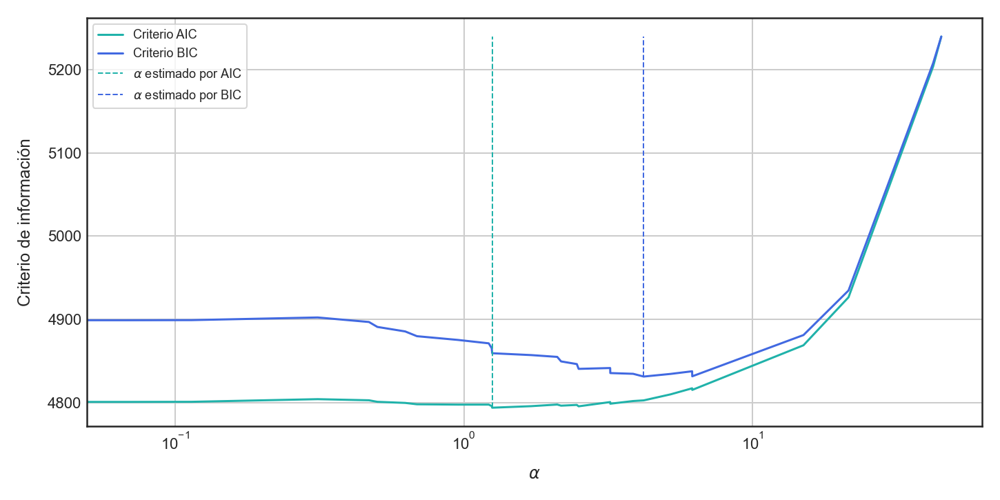

In [46]:
fig, ax = plt.subplots(figsize=(10, 5))
results.plot(ax=ax, color=["lightseagreen", "royalblue"])
ax.vlines(
    aic_alpha_value,
    results["Criterio AIC"].min(),
    results["Criterio AIC"].max(),
    label=r"$\alpha$ estimado por AIC",
    linestyle="--",
    color="lightseagreen",
    lw=1.0,
)
ax.vlines(
    bic_alpha_value,
    results["Criterio BIC"].min(),
    results["Criterio BIC"].max(),
    label=r"$\alpha$ estimado por BIC",
    linestyle="--",
    color="royalblue",
    lw=1.0,
)
ax.set_xlabel(r"$\alpha$", fontsize=12, labelpad=10)
ax.set_ylabel("Criterio de información", fontsize=12, labelpad=10)
ax.set_xscale("log")
ax.grid(True)
ax.legend(loc="upper left", frameon=True, fontsize=9)
plt.tight_layout();

Podemos observar que ambos criterios estiman valores distintos de $\alpha$, lo que demuestra el impacto de las 15 variables que hemos añadido al conjunto de datos en base a puro ruido. Podemos notar que esta implementación es relativamente rápida, ya que evalúa los grados de libertad del modelo en base a las dimensiones de las matrices de diseño imputadas en el método `fit()`, aunque ésto depende también de la calidad de las estimaciones para la varianza del ruido asociado a las observaciones de interés. En ambos casos, se espera que los conjuntos de datos tengan una cantidad *suficiente* de instancias, asumiendo siempre que el modelo con menor valor de $\mathrm{AIC}$ o $\mathrm{BIC}$ es correcto en base a los datos proporcionados.

Los coeficientes estimados para cada una de las variables en cada implementación de la regresión LASSO son los siguientes:

In [47]:
# Agrupamos los coeficientes resultantes en un DataFrame.
coefs = pd.DataFrame(
    data=np.column_stack(
        [
            lasso_lars_model_aic["model"].coef_, 
            lasso_lars_model_bic["model"].coef_,
        ]
    ),
    index=X_w_noise.columns,
    columns=results.columns,
)

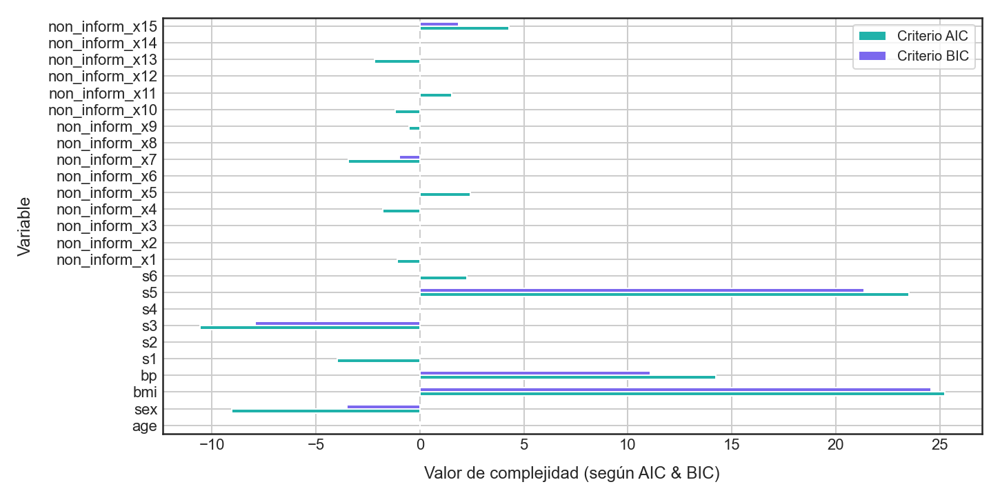

In [48]:
# Y graficamos los resultados.
fig, ax = plt.subplots(figsize=(10, 5))
coefs.plot(kind="barh", color=["lightseagreen", "mediumslateblue"], ax=ax)
ax.grid(True)
ax.set_xlabel("Valor de complejidad (según AIC & BIC)", fontsize=12, labelpad=10)
ax.set_ylabel("Variable", fontsize=12, labelpad=10)
ax.legend(loc="upper right", frameon=True, fontsize=10)
plt.tight_layout();

Notemos que ambos criterios estiman como muy relevantes casi las mismas variables, aunque hay algunas diferencias importantes. Por ejemplo, conforme el número de Akaike (que estima un valor óptimo $\alpha \approx 1.25$), se tiene que la variable `s1` tiene un impacto significativo en la respuesta `y`, mientras que, conforme el número de Bayes (que estima un valor óptimo $\alpha \approx 4.2$), la misma variable `s1` no tiene importancia alguna (su coeficiente es igual a cero), lo que naturalmente se debe al aumento del parámetro de regularización.

El mayor valor de $\alpha$ estimado conforme el criterio de Bayes para el modelo LASSO permita estimar (correctamente) que la mayoría de las variables `non_inform_xj` (con `j=1,...,15`) son irrelevantes, reduciendo sus coeficientes a cero por efecto de la regularización $\ell_{1}$, lo que, en esta primera etapa, permite descartar tales variables. Otras variables que saldrían de esta selección, pero que son parte del conjunto de datos original, son `s6`, `s4`, `s2`, `s1` y `age`. ◼︎

**Ejemplo 4.19 – Selección conjunta de atributos:** Otra forma de seleccionar atributos por medio de un modelo de tipo LASSO en **<font color='mediumorchid'>Scikit-Learn</font>** es por medio de un proceso que considera una serie de modelos secuenciales que son forzados a seleccionar siempre la misma cantidad de atributos en cada proceso de ajuste o *tarea*. Como resultado, las variables seleccionadas por este proceso pueden variar en rango y amplitud, incluso a pesar de ser siempre las mismas, estabilizando el procedimiento de selección.

El proceso de selección de atributos previamente descrito puede implementarse por medio de la clase `MultiTaskLasso`, la que acepta los mismos argumentos que `Lasso` (con algunas adiciones más particulares en las que no ahondaremos en este ejemplo particular). Para ilustrar el efecto de esta **selección conjunta de atributos**, compararemos los resultados con la implementación del modelo `Lasso` tradicional:

In [49]:
from sklearn.linear_model import Lasso, MultiTaskLasso

Lo que haremos a continuación será generar un conjunto de datos con una serie de variables de salida. Definiremos para ello algunos parámetros fijos:

- El número $m$ de instancias del conjunto de entrenamiento: `n_instances`.
- El número $n$ de variables independientes del conjunto de entrenamiento: `n_features`.
- El número $k$ de tareas a resolver, que simplemente representa el número de conjuntos de observaciones de salida respecto de los cuales ajustaremos nuestros modelos: `n_tasks`.
- El número $r$ de variables informativas con el que se generarán las observaciones: `n_informative`.

De esta manera, tenemos:

In [50]:
# Definimos una semilla aleatoria.
rng = np.random.RandomState(seed=42)

In [51]:
# Definimos las dimensiones del problema.
n_instances, n_features, n_tasks = 100, 30, 40

In [52]:
# Definimos el número de variables informativas.
n_informative = 6

Cada uno de los coeficientes asociados a las $r$ variables informativas, digamos $w_{s}$ para $s=1,...,r$, estará en función de un parámetro $t$, conforme una relación de tipo sinusoidal (para $t\in [0, 2\pi]$), para cada $s$. Tal relación será definida como

$$w_{s}=\mathrm{sen} \left( 1+\psi \right) t+3\beta$$
<p style="text-align: right;">$(4.121)$</p>

Donde $\psi$ y $\beta$ representan parámetros aleatorizados conforme una distribución uniforme, a fin de dificultar el trabajo de nuestros modelos:

In [53]:
# Inicializamos los coeficientes "reales" por medio de un arreglo 2D compuesto de 0s.
coef = np.zeros((n_tasks, n_features))

In [54]:
# Definimos el parámetro base `t` por medio de un rango.
t = np.linspace(start=0, stop=2 * np.pi, num=n_tasks)

In [55]:
# Construimos los coeficientes "reales" por medio de una relación sinusoidal.
for j in range(n_informative):
    coef[:, j] = np.sin((1.0 + rng.randn(1)) * t + 3 * rng.randn(1))

De esta manera, si $\mathbf{w}\in \mathbb{R}^{n}$ representa el vector de coeficientes usado para generar el conjunto de entrenamiento completo, únicamente sus primeras $p$ componentes serán no nulas, y estarán definidas conforme la relación (4.120). Siendo así, definimos la matriz de diseño `X` y el arreglo de observaciones `Y` como sigue:

In [56]:
# Definimos la matriz de diseño `X` y el arreglo con las observaciones `Y`.
X = rng.randn(n_instances, n_features)
Y = X @ coef.T + rng.randn(n_instances, n_tasks)

Notemos que `Y` ahora es un arreglo 2D, que aglutina un total de $k$ observaciones diferentes de un fenómeno simulado conforme la relación (4.120), en vez de un único vector. Esto se conoce en la práctica como **multi-output**.

Ya sólo nos resta instanciar nuestros modelos:

In [57]:
# Instanciamos los modelos.
lasso_model = Lasso(alpha=0.5)
multi_task_lasso_model = MultiTaskLasso(alpha=1.0)

El ajuste de los modelos `Lasso` y `MultiTaskLasso` es ligeramente diferente en este ejemplo. `Lasso`, como la mayoría de los modelos disponibles en la API de **<font color='mediumorchid'>Scikit-Learn</font>**, sólo acepta un arreglo unidimensional como *output*. Sin embargo, `MultiTaskLasso` puede trabajar con un *multi-ouput* de forma nativa conforme los métodos `fit()` y `predict()`:

In [58]:
# ... y los entrenamos, a fin de obtener los coeficientes para cada `y`.
coef_lasso = np.array([lasso_model.fit(X, yk).coef_ for yk in Y.T])
coef_multi_task_lasso = multi_task_lasso_model.fit(X, Y).coef_

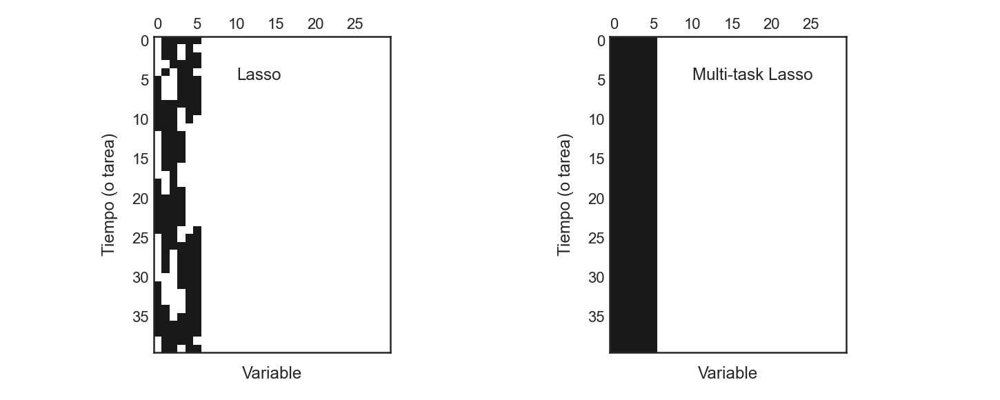

In [59]:
# Visualizamos los resultados.
fig, ax = plt.subplots(figsize=(10, 4), ncols=2)

ax[0].spy(coef_lasso)
ax[0].text(10, 5, "Lasso")
ax[0].set_xlabel("Variable", fontsize=12, labelpad=10)
ax[0].set_ylabel("Tiempo (o tarea)", fontsize=12, labelpad=10)

ax[1].spy(coef_multi_task_lasso)
ax[1].text(10, 5, "Multi-task Lasso")
ax[1].set_xlabel("Variable", fontsize=12, labelpad=10)
ax[1].set_ylabel("Tiempo (o tarea)", fontsize=12, labelpad=10)

plt.tight_layout();

La visualización anterior permite observar cuáles son los valores estimados para los coeficientes de cada uno de los modelos entrenados. Observemos que, en el caso del modelo `Lasso`, los únicos coeficientes que suelen no anularse van desde $w_{1}$ a $w_{6}$ (recordemos que Python comienza a contar desde el cero), aunque sólo en una de las *tareas* ninguno de esos coeficientes es nulo, que es lo deseado. Esto no ocurre en el caso del modelo construido por medio de `MultiTaskLasso`, porque, como comentamos previamente, este modelo construye una selección conjunta de atributos forzando siempre a que los mismos coeficientes no se anulen para varias *tareas* o *réplicas* del vector de observaciones de salida.

Para finalizar este ejemplo, visualizaremos las codependencias resultantes (y las reales) de cada uno de los parámetros de la regresión con respecto a $t$:

In [60]:
# Creamos una función para graficar las dependencias de los parámetros reales y estimados respecto
# del tiempo `t`.
def plot_feature_dependence(coef, coef_lasso, coef_mt_lasso, feat_to_plot, ax):
    ax.plot(
        coef[:, feat_to_plot], color="teal", lw=2.0, 
        label=f"Valor real de w{feat_to_plot + 1}",
    )
    ax.plot(
        coef_lasso[:, feat_to_plot], color="mediumslateblue", lw=2.0, 
        label=f"Estimación LASSO de w{feat_to_plot + 1}",
    )
    ax.plot(
        coef_multi_task_lasso[:, feat_to_plot], color="gold", lw=2.0, 
        label=f"Estimación MT-LASSO de w{feat_to_plot + 1}",
    )
    ax.legend(fontsize=7, loc="best", frameon=True)
    ax.set_title(f"Respecto de w{feat_to_plot + 1}", fontsize=12, fontweight="bold", pad=10)
    #ax.set_xlabel(r"$t$", fontsize=12, labelpad=10)
    #ax.set_ylabel(f"w{feat_to_plot}", fontsize=12, labelpad=10, rotation=0)

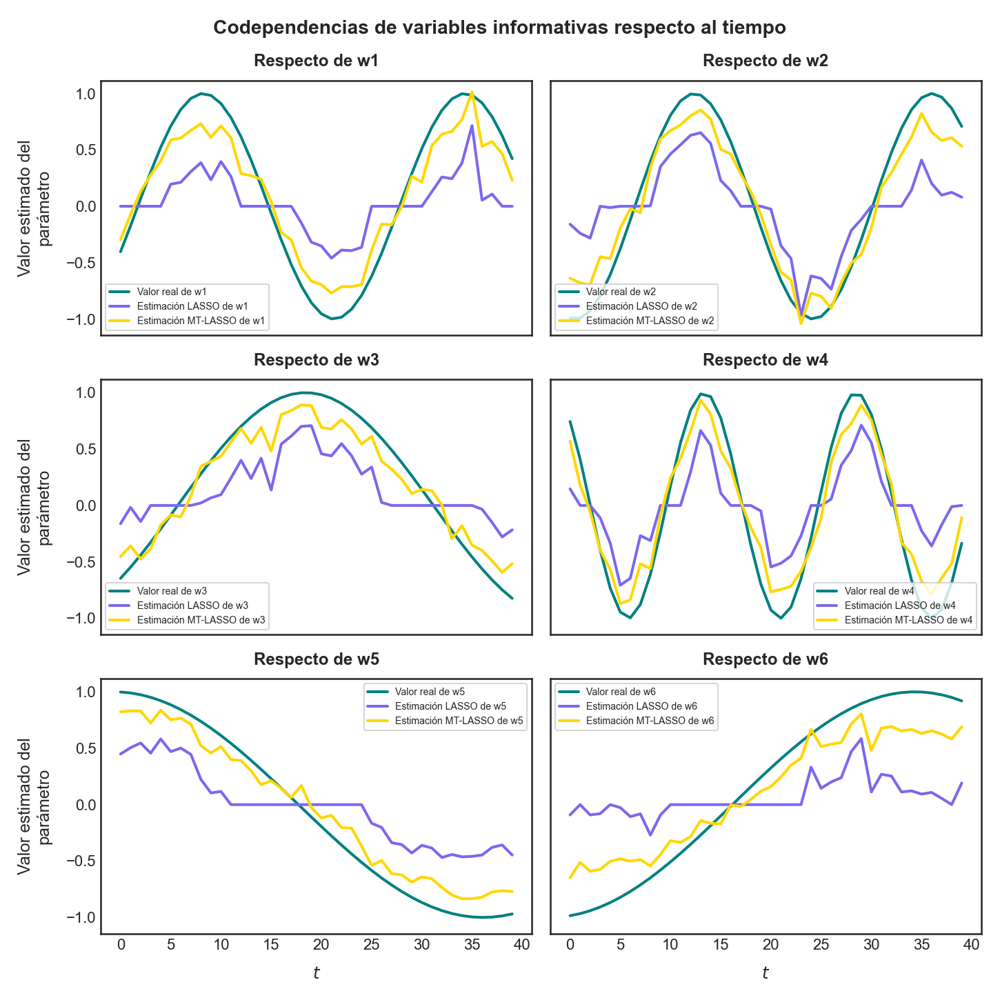

In [61]:
# Graficamos estas dependencias.
fig, ax = plt.subplots(figsize=(10, 10), nrows=3, ncols=2, sharex=True, sharey=True)
fig.suptitle(
    "Codependencias de variables informativas respecto al tiempo", fontsize=14, fontweight="bold",
)
plot_feature_dependence(coef, coef_lasso, coef_multi_task_lasso, feat_to_plot=0, ax=ax[0, 0])
plot_feature_dependence(coef, coef_lasso, coef_multi_task_lasso, feat_to_plot=1, ax=ax[0, 1])
plot_feature_dependence(coef, coef_lasso, coef_multi_task_lasso, feat_to_plot=2, ax=ax[1, 0])
plot_feature_dependence(coef, coef_lasso, coef_multi_task_lasso, feat_to_plot=3, ax=ax[1, 1])
plot_feature_dependence(coef, coef_lasso, coef_multi_task_lasso, feat_to_plot=4, ax=ax[2, 0])
plot_feature_dependence(coef, coef_lasso, coef_multi_task_lasso, feat_to_plot=5, ax=ax[2, 1])

ax[2, 0].set_xlabel(r"$t$", fontsize=12, labelpad=10)
ax[2, 1].set_xlabel(r"$t$", fontsize=12, labelpad=10)

ax[0, 0].set_ylabel("Valor estimado del\nparámetro", fontsize=12, labelpad=10)
ax[1, 0].set_ylabel("Valor estimado del\nparámetro", fontsize=12, labelpad=10)
ax[2, 0].set_ylabel("Valor estimado del\nparámetro", fontsize=12, labelpad=10)

plt.tight_layout();

Notemos que el modelo construido por medio de `MultiTaskLasso` aproxima mucho mejor estas codependencias que el modelo `Lasso`, aunque con ciertas imprecisiones razonables. Recordemos que, con toda su sofisticación, el modelo de tipo LASSO sigue siendo un modelo lineal, y las relaciones que generan los coeficientes $w_{1},...,w_{6}$ no lo son.

Este ejemplo se muestra igualmente en la [documentación](https://scikit-learn.org/stable/auto_examples/linear_model/plot_multi_task_lasso_support.html#sphx-glr-auto-examples-linear-model-plot-multi-task-lasso-support-py) de **<font color='mediumorchid'>Scikit-Learn</font>** ◼︎

### El modelo de red elástica.
El último tipo de regularización que estudiaremos en esta sección corresponde a una combinación de los modelos de tipo "ridge" y de tipo LASSO. Sea pues el conjunto de entrenamiento $\mathcal{D} =\left\{ \left( \mathbf{X} ,\mathbf{y} \right)  :\mathbf{X} \in \mathbb{R}^{m\times n} \wedge \mathbf{y} \in \mathbb{R} \right\}$, donde $\mathbf{x}_{i}\in \mathbb{R}^{n}$ representa una fila o instancia $i$-ésima de la matriz de datos de entrada $\mathbf{X}$, siendo $m$ el total de instancias de $\mathcal{D}$. Sea $\mathbf{w}\in \mathbb{R}^{n}$ el vector de parámetros que deseamos estimar por medio de un modelo de regresión tal que $\hat{\mathbf{y}}= \mathbf{X}\mathbf{w}$. Si $L(\mathbf{w})$ representa la función de costo utilizada para construir el modelo (y estimar $\mathbf{w}$), queremos construir una **función de costo regularizada** que pondere los términos de regularización $\ell_{1}$ y $\ell_{2}$ de los modelos estudiados con anterioridad conforme un **factor** $\rho$, tal que

$$J\left( \mathbf{w} \right) =L\left( \mathbf{w} \right) +\underbrace{\alpha \rho \left\Vert \mathbf{w} \right\Vert_{1}}_{\mathrm{regularizador} \  \ell_{1}} +\  \  \  \underbrace{\frac{\alpha}{2} \left( 1-\rho \right) \left\Vert \mathbf{w} \right\Vert_{2}^{2}}_{\mathrm{regularizador} \  \ell_{2}}$$
<p style="text-align: right;">$(4.122)$</p>

Donde $\alpha$ es la **potencia** de la regularización.

Si $L(\mathbf{w})$ es el **error cuadrático medio**, entonces el estimador $\hat{\mathbf{w}}_{\mathrm{net}}$ de este modelo puede definirse como

$$\hat{\mathbf{w}}_{\mathrm{net}} =\underset{\mathbf{w}}{\mathrm{argmin}} \  \frac{1}{2m} \left( \mathbf{X} \mathbf{w} -\mathbf{y} \right)^{\top} \left( \mathbf{X} \mathbf{w} -\mathbf{y} \right) +\alpha \rho \left\Vert \mathbf{w} \right\Vert_{1} +\frac{\alpha}{2} \left( 1-\rho \right) \left\Vert \mathbf{w} \right\Vert_{2}^{2}$$
<p style="text-align: right;">$(4.123)$</p>

En este modelo, se genera una especie de *trade-off* entre ambos tipos de regularización ($\ell_{1}$ y $\ell_{2}$), de manera tal que el estimador resultante es disperso, con pocas componentes no nulas, como en la regresión de tipo LASSO, pero manteniendo la uniformidad propia del modelo de tipo "ridge". Tal trade-off depende, naturalmente, del valor del parámetro $\rho$.

No ahondaremos en detalles matemáticos muy profundos para derivar el valor de $\hat{\mathbf{w}}_{\mathrm{net}}$, puesto que tal desarrollo resulta redundante, debido a que no es más que una combinación de los realizado para determinar expresiones para los estimadores de tipo "ridge" y LASSO. En este caso, solemos implementar soluciones numéricas para resolver (4.123) debido a la presencia del término de regularización con norma $\ell_{1}$, por lo que resulta muy común encontrar expresiones para los $n$ parámetros $w_{1},...,w_{n}$ en términos del operador de umbralización suave (4.120) o la función signo. Un ejemplo clásico es

$$\hat{w}_{j}=\frac{1}{1+\alpha \left( 1-\rho \right)} S\left( r_{i}^{j},\rho \alpha \right) \  ;\  j=1,...,n$$
<p style="text-align: right;">$(4.124)$</p>

Donde $r_{i}^{j}$ es el residuo parcial resultante de excluir a la $j$-ésima variable del modelo, definido en (4.111).

El modelo de red elástica gana todas las ventajas (y desventajas) de los modelos de tipo "ridge" y LASSO. Algunos aspectos muy relevantes son los siguientes:

- Permite realizar **selecciones de atributos**, gracias a que el término de regularización en norma $\ell_{1}$ permite anular parámetros asociados a variables que no impactan sobre la respuesta de interés cuando $\alpha$ crece.
- El término de regularización en norma $\ell_{2}$ permite distribuir los efectos que derivan de variables que están correlacionadas en el conjunto de entrenamiento, lo que permite mitigar la redundancia de información inducida por **problemas de multicolinealidad**, evitando que los parámetros de regresión oscilen con alta variabilidad, como ocurre (y hemos visto) en el modelo de tipo LASSO.

Como antes, la elección de los hiperparámetros $\alpha$ y $\rho$ es por medio de procedimientos de prueba y error, siendo muy común el uso de validaciones cruzadas para ese fin.

**Ejemplo 4.20 – Implementación del modelo de red elástica en <font color='mediumorchid'>Scikit-Learn</font>:** Naturalmente, el modelo de red elástica puede implementarse de manera relativamente sencilla en **<font color='mediumorchid'>Scikit-Learn</font>**. La más básica de las implementaciones que nos provee esta librería corresponde a la clase `ElsticNet`, la cual acepta –entre otros– a los siguientes parámetros:

- `alpha`: Corresponde al valor del parámetro de regularización $\alpha$ definido en la ecuación (4.123).
- `l1_ratio`: Corresponde al ponderador asociado a la fuerza de cada término de regularización, equivalente al parámetro $\rho$ en la ecuación (4.123).
- `fit_intercept`: Parámetro booleano que define si el modelo a estimar dispondrá (`True`) o no (`False`) de un parámetro de sesgo. Si `fit_intercept=False`, el modelo esperará que el conjunto de entrenamiento sea tal que la matriz de diseño `X` esté centrada con respecto a la media de sus columnas.
- `max_iter`: Número máximo de iteraciones a realizar por el algoritmo de optimización que estimará los parámetros. En **<font color='mediumorchid'>Scikit-Learn</font>**, al igual que la mayoría de las implementaciones del modelo de regresión LASSO, las implementaciones del modelo de red elástica usan el algoritmo de descenso por coordenadas para estimar el vector de parámetros completo, debido al término de regularización en norma $\ell_{1}$ en la expresión (4.123).
- `positive`: Parámetro booleano que permite forzar a que el modelo únicamente estime parámetros positivos.
- `tol`: Parámetro de tolerancia del algoritmo de optimización subyacente al modelo. Por defecto, su valor es `tol=1e-4`.
- `random_state`: Parámetro que permite establecer una semilla pseudo-aleatoria para garantizar la reproducibilidad de nuestro modelo.

En este ejercicio, resolveremos un problema sencillo generado a partir de la función `make_regression()` por medio de la clase `ElasticNet`, a fin de determinar el valor óptimo de $\alpha$ para nuestro modelo:

In [62]:
from sklearn.linear_model import ElasticNet

Para este ejercicio, consideraremos un conjunto de datos con un total de 500 variables independientes y 300 instancias. De estas 500 variables, únicamente 50 de ellas serán utilizadas para generar el modelo base de interés y, por lo tanto, sólo 50 de los parámetros "reales" del modelo no serán nulos:

In [63]:
# Creamos nuestro conjunto de datos.
X, y, w = make_regression(
    n_samples=300, n_features=500, n_informative=50,
    shuffle=False, noise=1.0, coef=True,
)

Ahora crearemos los conjuntos de entrenamiento y de prueba. En este caso particular, dejaremos un 60% de los datos como prueba, a fin de dificultar la labor de nuestro modelo:

In [64]:
# Creamos los conjuntos de entrenamiento y de prueba.
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.6, shuffle=False, random_state=42,
)

Ahora definimos un arreglo secuencial (logarítmico) de valores de $\alpha$, a fin de testear cada uno de estos valores en la construcción de nuestro modelo y elegir el que dé mejores resultados:

In [65]:
# Definimos una lista de valores para el hiperparámetro de regularización.
alphas = np.logspace(start=-5, stop=1, num=60)

In [66]:
# Instanciamos nuestro modelo.
model = ElasticNet(l1_ratio=0.7, max_iter=10000, random_state=42)

In [67]:
# Mediante un loop, calculamos los errores de entrenamiento y generalización.
train_errors, test_errors = [], []
for alpha_k in alphas:
    model.set_params(alpha=alpha_k)
    model.fit(X_train, y_train)
    train_errors.append(model.score(X_train, y_train))
    test_errors.append(model.score(X_test, y_test))

Con los modelos ya entrenados, ya simplemente resta buscar el valor de $\alpha$ que ha generado el mejor desempeño de nuestro modelo (mayor valor de $r^{2}$, conforme el método `score()`):

In [68]:
# Determinamos el valor óptimo de `alpha`.
best_alpha_idx = np.argmax(test_errors)
best_alpha = alphas[best_alpha_idx]

In [69]:
# Mostramos este valor óptimo en pantalla.
print(f"Valor óptimo de `alpha` = {best_alpha}")

Valor óptimo de `alpha` = 0.00026529484644318975


Con este valor de $\alpha$, reseteamos nuestro modelo y lo entrenamos sobre los datos de entrenamiento y recuperamos los correspondientes parámetros de regresión:

In [70]:
# Estimamos los parámetros de regresión con el valor óptimo de `alpha`.
model.set_params(alpha=best_alpha)
coeffs = model.fit(X_train, y_train).coef_

Finalmente, visualizamos nuestros resultados:

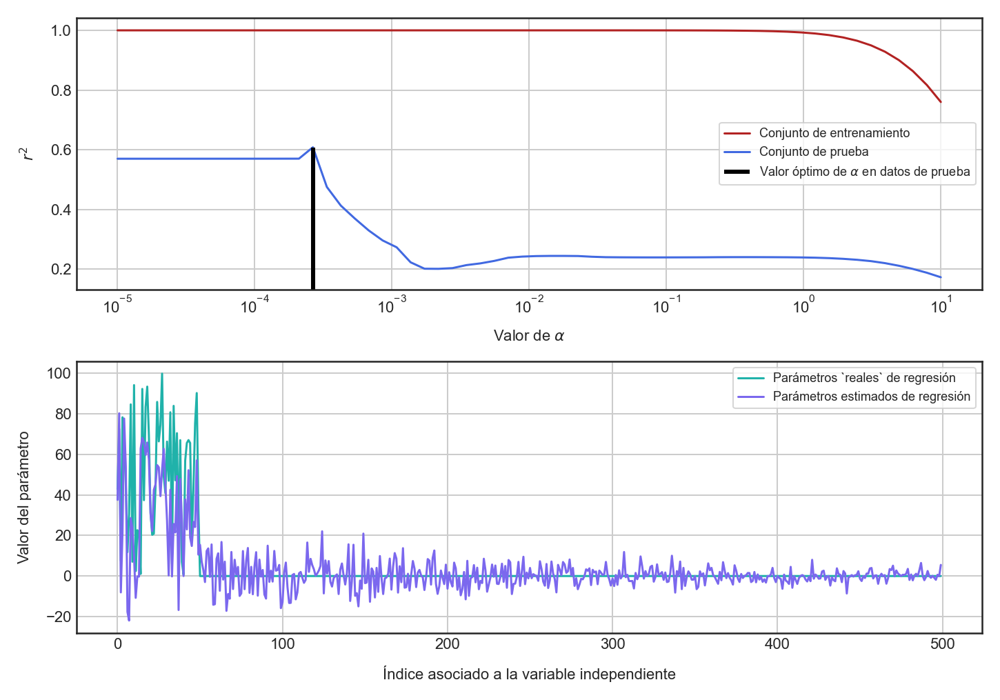

In [71]:
# Graficamos nuestros resultados.
fig, ax = plt.subplots(figsize=(10, 7), nrows=2)

ax[0].semilogx(alphas, train_errors, color="firebrick", label="Conjunto de entrenamiento")
ax[0].semilogx(alphas, test_errors, color="royalblue", label="Conjunto de prueba")
ax[0].vlines(
    best_alpha, ax[0].set_ylim()[0], np.max(test_errors), color="black", lw=3,
    label=r"Valor óptimo de $\alpha$ en datos de prueba",
)
ax[0].grid(True)
ax[0].legend(loc="center right", fontsize=9, frameon=True)
ax[0].set_xlabel(r"Valor de $\alpha$", fontsize=11, labelpad=10)
ax[0].set_ylabel(r"$r^{2}$", fontsize=11, labelpad=10)

ax[1].plot(w, color="lightseagreen", label="Parámetros `reales` de regresión")
ax[1].plot(coeffs, color="mediumslateblue", label="Parámetros estimados de regresión")
ax[1].grid(True)
ax[1].legend(loc="upper right", fontsize=9, frameon=True)
ax[1].set_xlabel("Índice asociado a la variable independiente", fontsize=11, labelpad=10)
ax[1].set_ylabel("Valor del parámetro", fontsize=11, labelpad=10)

plt.tight_layout();

En el primer gráfico, hemos gráficado el rango de valores de $\alpha$ con respecto al coeficiente $r^{2}$ del modelo para los datos de entrenamiento y de prueba. Se ha marcado con una línea vertical sólida el valor óptimo de $\alpha$ sobre los datos de prueba, que es consistente con el máximo valor de $r^{2}$ para dicho subconjunto de datos.

En el gráfico inferior se observa como oscila el valor de los parámetros estimados por el mejor de los modelos con respecto a los correspondientes valores "reales" (que fueron utilizados para generar el conjunto de datos completo). Notemos que sólo los primeros 50 parámetros son no nulos, por lo que el modelo estima valores de mayor magnitud para todos ellos, aunque no de manera precisa. El resto de los parámetros estimados oscila en torno a cero, aunque con un nivel significativo de variabilidad. ◼︎

**Ejemplo 4.21 – Una visualización del espacio de regularización para un término de regularización igual a 1:** En este sencillo ejemplo, vamos a ilustrar el campo de acción de un modelo de red elástico en términos de los valores que puede tomar el término de regularización asociado a dicho modelo cuando $\alpha= 1$. Con este ejercicio entenderemos por qué este modelo es llamado así.

Para efectos prácticos, consideraremos el caso de un vector $\mathbf{x}\in \mathbb{R}^{2}$, a fin de disponer de un resultado que podamos mirar sin ningún problema. Debido a que las normas $\ell_{1}$ y $\ell_{2}$ son formas de medir la longitud o magnitud de vectores en el espacio Euclídeo, sus gráficas representan las bolas unitarias correspondientes a cada norma, es decir, el conjunto de todos los vectores cuya norma es igual a $1$. Para el caso de la norma $\ell_{1}$, esta bola representa un rombo de área unitaria cuyos vértices están en los puntos $(1, 0)$, $(0, 1)$, $(-1, 0)$ y $(0, -1)$, mientras que, para el caso de la norma $\ell_{2}$, la bola correspondiente es la región representada por todos los puntos $x_{1}$ y $x_{2}$ tales que $x_{1}^{2}+x_{2}^{2}=1$; es decir, un círculo de radio $1$.

La red elástica, representada por la combinación $\rho \ell_{1}(\mathbf{x}) + (1- \rho)\ell_{2}(\mathbf{x})$, se representa por tanto como la región interna al círculo $x_{1}^{2}+x_{2}^{2}=1$, pero exterior al rombo $|x_{1}| + |x_{2}|= 1$. Este particular nombre se debe a que, dependiendo del valor de $\rho$, el **espacio de regularización** resultante estará más cercano al rombo o al círculo.

Para visualizar este efecto, consideraremos el caso $\rho= 0.5$. De esta manera, la red elástica será una especie de rombo con lados curvos que se corresponde con el dominio que queda justo a medio camino entre ambas normas. Partimos pues, para visualizar estos conjuntos de puntos, definiendo un rango base para construir las correspondientes regiones:

In [72]:
# Creamos el rango base para evaluar el término de regularización.
base_range = np.linspace(start=-1.5, stop=1.5, num=1000)

Y construimos estos conjuntos por medio de una grilla:

In [73]:
# Generamos una grilla con base en el rango anterior.
grid_x, grid_y = np.meshgrid(base_range, base_range, indexing="ij")

In [74]:
# Calculamos las correspondientes normas en cada caso.
l1_vals = np.abs(grid_x) + np.abs(grid_y)
l2_vals = grid_x ** 2 + grid_y ** 2
rho = 0.5
elastic_net = rho * l1_vals + (1 - rho) * l2_vals

Ya sólo nos queda visualizar el resultado:

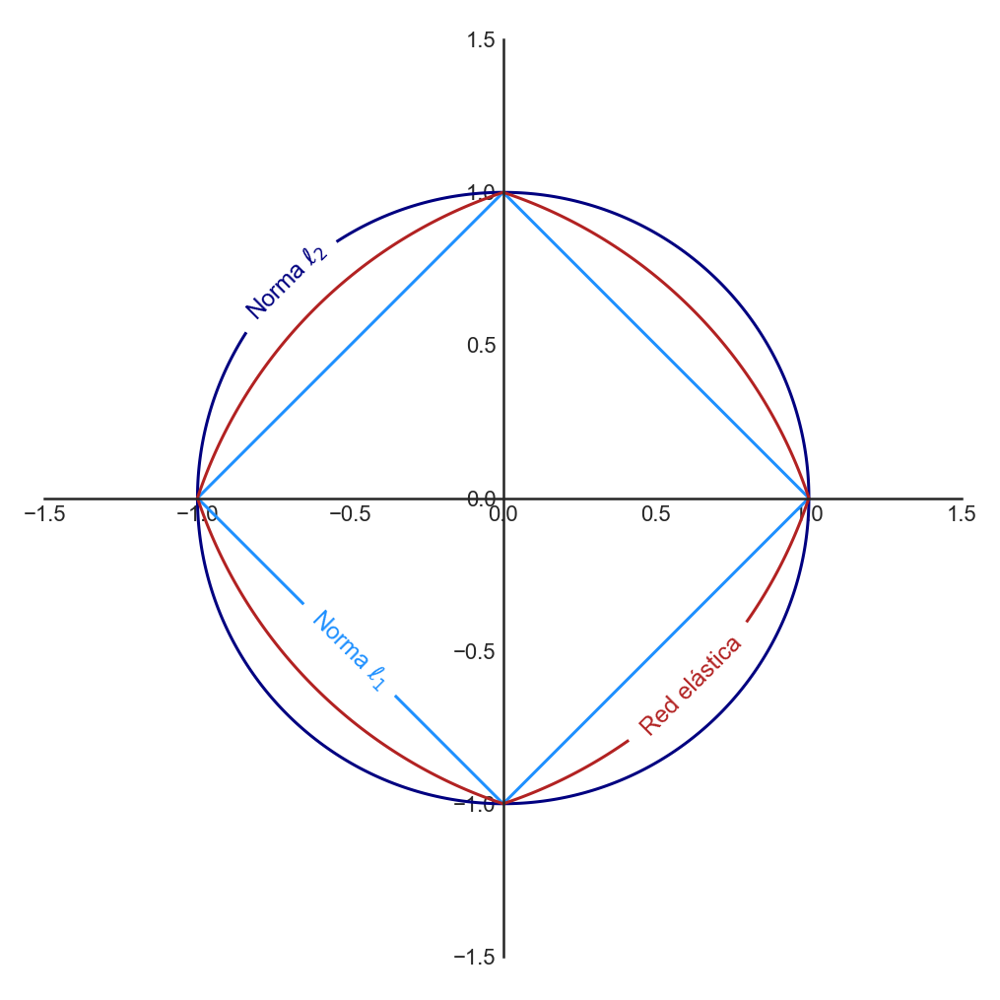

In [75]:
# Visualizamos los resultados.
fig, ax = plt.subplots(figsize=(7, 7))

p1 = ax.contour(grid_x, grid_y, l1_vals, levels=[1], colors="dodgerblue")
p2 = ax.contour(grid_x, grid_y, l2_vals, levels=[1], colors="navy")
p3 = ax.contour(grid_x, grid_y, elastic_net, levels=[1], colors="firebrick")

ax.spines["left"].set_position("center")
ax.spines["right"].set_color("none")
ax.spines["bottom"].set_position("center")
ax.spines["top"].set_color("none")

ax.clabel(
    p1,
    inline=1,
    fontsize=12,
    fmt={1.0: r"Norma $\ell_{1}$"},
    manual=[(-1, -1)],
)
ax.clabel(
    p2,
    inline=1,
    fontsize=12,
    fmt={1.0: r"Norma $\ell_{2}$"},
    manual=[(-1, +1)],
)
ax.clabel(
    p3,
    inline=1,
    fontsize=12,
    fmt={1.0: "Red elástica"},
    manual=[(1, -1)],
)

ax.set_aspect("equal")
plt.tight_layout();

En efecto, la bola $\mathcal{J}$ limitado por la red elástica es tal que las distancias medidas desde la frontera de $\mathcal{J}$ son siempre iguales con respecto a las bolas asociadas a las normas $\ell_{1}$ y $\ell_{2}$. De esta manera, cuando el valor de $\rho$ crece, la bola se asemeja mayormente al rombo $|x_{1}| + |x_{2}|= 1$, mientras que, si el valor de $\rho$ decrece, la bola se asemeja mayormente al círculo $x_{1}^{2}+x_{2}^{2}=1$.

Para observar que, efectivamente, la red elástica se ubica siempre entre las bolas asociadas a las normas $\ell_{1}$ y $\ell_{2}$, simplemente construimos un *loop* sencillo con suficientes valores de $\rho$ tales $0\leq \rho \leq 1$. De esta manera, obtenemos:

In [76]:
# Definimos un set de valores para rho.
rho_vals = np.linspace(start=0.0, stop=1.0, num=100)

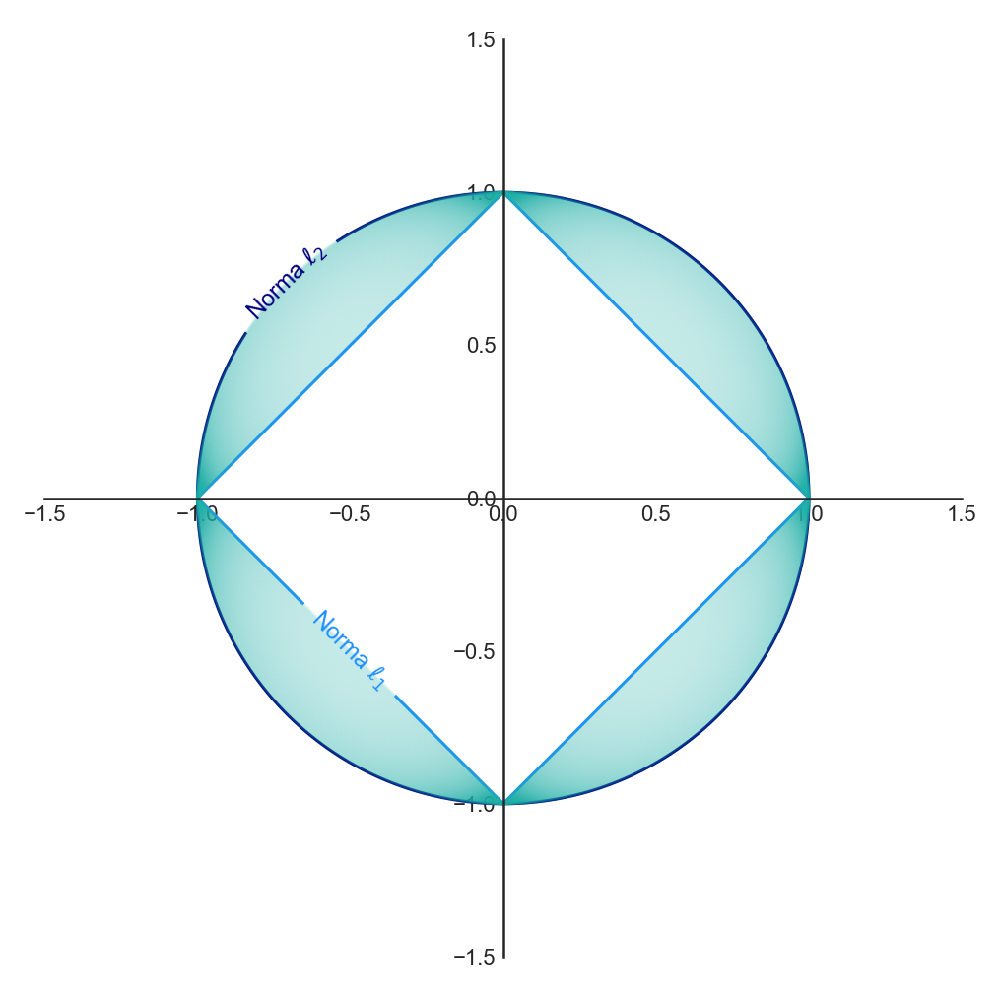

In [77]:
# Visualizamos los resultados de la red elástica.
fig, ax = plt.subplots(figsize=(7, 7))

p1 = ax.contour(grid_x, grid_y, l1_vals, levels=[1], colors="dodgerblue")
p2 = ax.contour(grid_x, grid_y, l2_vals, levels=[1], colors="navy")
for j, rho_j in enumerate(rho_vals):
    elastic_net_j = rho_j * l1_vals + (1 - rho_j) * l2_vals
    pj = ax.contour(
        grid_x, grid_y, elastic_net_j, levels=[1], colors="lightseagreen", alpha=0.1,
    )
    
ax.spines["left"].set_position("center")
ax.spines["right"].set_color("none")
ax.spines["bottom"].set_position("center")
ax.spines["top"].set_color("none")

ax.clabel(
    p1,
    inline=1,
    fontsize=12,
    fmt={1.0: r"Norma $\ell_{1}$"},
    manual=[(-1, -1)],
)
ax.clabel(
    p2,
    inline=1,
    fontsize=12,
    fmt={1.0: r"Norma $\ell_{2}$"},
    manual=[(-1, +1)],
)
ax.set_aspect("equal")
plt.tight_layout();

Y ahí lo tenemos. El efecto geométrico del hiperparámetro $\rho$ en el modelo de red elástica es esencialmente ajustar el término de regularización para que siempre se encuentre entre las bolas unitarias de las normas $\ell_{1}$ y $\ell_{2}$. Esto permite que el modelo sea lo suficientemente flexible para moverse entre las restricciones asociadas a ambas normas, combinando las propiedades de encogimiento de coeficientes de regresión de la norma $\ell_{1}$ con la estabilidad y agrupamiento de la norma $\ell_{2}$. ◼︎

## Un enfoque Bayesiano para el modelo de regresión lineal.
Los modelos lineales regularizados vistos previamente son el resultado de restringir el comportamiento de los parámetros de estos modelos por medio de la introducción de **conocimiento a priori** relativo a su comportamiento, independientemente de los datos de entrenamiento. Por ejemplo, seteando una distribución a priori de tipo normal estándar sobre los parámetros de regresión, obtendremos un estimador máximo a posteriori que coincide con el estimador de tipo "ridge", tal que los autovalores de la matriz de diseño normalizada ($\mathbf{X}^{\top}\mathbf{X}$) son todos iguales. El objetivo de este tipo de restricciones es evitar, en la medida de lo posible, que nuestros modelos sobreajusten los datos de entrenamiento.

A continuación desarrollaremos el concepto de **regresión lineal Bayesiana**, donde iremos más allá y, en vez de calcular un valor puntual a posteriori de los parámetros de regresión, **intentaremos determinar la distribución a posteriori de los mismos en toda su globalidad**. Como resultado, no ajustaremos ningún parámetro, sino que haremos nuestras estimaciones promediando los valores plausibles conforme tal distribución.

### Formulación.
En un contexto general, consideraremos el modelo

$$\begin{array}{ll}\mathrm{Distribucion\  a\  priori} :&P\left( \mathbf{w} \right) =\mathcal{N} \left( \mathbf{d}_{0} ,\mathbf{S}_{0} \right)\\ \mathrm{Funcion\  de\  verosimilitud} :&P\left( \mathbf{y} |\mathbf{X} ,\mathbf{w} \right) =\mathcal{N} \left( \mathbf{y} |\mathbf{\Phi} \left( \mathbf{X} \right) \mathbf{w} ,\sigma^{2} \mathbf{I} \right)\end{array}$$
<p style="text-align: right;">$(4.125)$</p>

En la expresión anterior, $\mathbf{X}\in \mathbb{R}^{m\times n}$ es la matriz de diseño original asociada a un conjunto de entrenamiento $\mathcal{D}$, $\mathbf{y}\in \mathbb{R}^{m}$ es el vector de observaciones de interés, $\mathbf{w}\in \mathbb{R}^{n}$ es el vector que aglutina los parámetros del modelo y $\mathbf{\Phi}$ es cualquier transformación aplicada sobre $\mathbf{X}$ que preserve la linealidad del modelo con respecto a $\mathbf{w}$. Notemos que ahora hemos impuesto una distribución a priori explícita $\mathcal{N}(\mathbf{d}_{0},\mathbf{S}_{0})$ sobre $\mathbf{w}$, a diferencia del caso de la estimación máxima a posteriori, lo que permite transformar a $\mathbf{w}$ en una **variable aleatoria**. Conforme el teorema de Bayes, el modelo probabilístico completo que representa la distribución conjunta de las variables observada ($\mathbf{y}$) y no observada ($\mathbf{w}$) resulta

$$P\left( y_{i},\mathbf{w} |\mathbf{x}_{i} \right) =P\left( y_{i}|\mathbf{x}_{i} ,\mathbf{w} \right) P\left( \mathbf{w} \right)$$
<p style="text-align: right;">$(4.126)$</p>

### Obtención de predicciones (a priori).
En la práctica, no estamos interesados en los valores de $\mathbf{w}$ propiamente tales. En vez de ello, solemos enfocarnos en las predicciones que podemos hacer con esos valores. En un contexto Bayesiano, tomamos la distribución seteada para los parámetros de regresión y calculamos el valor medio de todos los valores plausibles para $\mathbf{w}$, y luego de eso, realizamos nuestras predicciones. Matemáticamente, si $\mathbf{x}_{s}\in \mathbb{R}^{n}$ es una instancia de prueba que deseamos imputar para predecir el valor correspondiente de $y_{s}$, integramos el lado derecho de la fórmula (4.126), obteniendo

$$\begin{array}{lll}P\left( y_{s}|\mathbf{x}_{s} \right)&=&\displaystyle \int_{\mathcal{W}} P\left( y_{s}|\mathbf{x}_{s} ,\mathbf{w} \right) P\left( \mathbf{w} \right) d\mathbf{w}\\ &=&\mathrm{E}_{\mathbf{w}} \left[ P\left( y_{s}|\mathbf{x}_{s} ,\mathbf{w} \right) \right]\end{array}$$
<p style="text-align: right;">$(4.127)$</p>

Donde la integral múltiple anterior se calcula sobre el **espacio de parámetros** $\mathcal{W}$ (es decir, el conjunto de todos los valores posibles que puede tomar el vector $\mathbf{w}$). La última expresión del lado derecho de (4.127) puede interpretarse como el valor esperado ("promedio") de las predicciones para $y_{s}$, dados $\mathbf{x}_{s}$ y $\mathbf{w}$, conforme la distribución a priori $P(\mathbf{w})$. Notemos que las predicciones estimadas en base a esta distribución a priori únicamente requieren que especifiquemos el input $\mathbf{x}_{s}$ en vez de imputar todos los datos de entrenamiento.

En el modelo (4.125), escogimos una distribución a priori Gaussiana sobre $\mathbf{w}$, de manera tal que la distribución que aglutina las correspondientes predicciones es también Gaussiana y, más aún, puede expresarse por medio de una fómula algebraicamente cerrada. De este modo, reemplazando las ecuaciones (4.125) en la integral explicitada en la fórmula (4.127), obtenemos

$$\begin{array}{lll}P\left( y_{s}|\mathbf{x}_{s} \right)&=&\displaystyle \int_{\mathcal{W}} P\left( y_{s}|\mathbf{x}_{s} ,\mathbf{w} \right) P\left( \mathbf{w} \right) d\mathbf{w}\\ &=&\displaystyle \int_{\mathcal{W}} \mathcal{N} \left( y_{s}|\phi^{\top} \left( \mathbf{x}_{s} \right) \mathbf{w} ,\sigma^{2} \right) \mathcal{N} \left( \mathbf{d}_{0} ,\mathbf{S}_{0} \right) d\mathbf{w}\\ &=&\displaystyle \int_{\mathbb{R}^{n}} \underbrace{\left[ \frac{1}{\sqrt{2\pi \sigma^{2}}} \exp \left( -\frac{1}{2\sigma^{2}} \left( y_{s}-\phi^{\top} \left( \mathbf{x}_{s} \right) \mathbf{w} \right)^{2} \right) \right]}_{=\mathcal{N} \left( y_{s}|\phi^{\top} \left( \mathbf{x}_{s} \right) \mathbf{w} ,\sigma^{2} \right)} \underbrace{\left[ \frac{1}{\sqrt{\left( 2\pi \right)^{n} \det \left( \mathbf{S}_{0} \right)}} \exp \left( -\frac{1}{2} \left( \mathbf{w} -\mathbf{d}_{0} \right)^{\top} \mathbf{S}_{0}^{-1} \left( \mathbf{w} -\mathbf{d}_{0} \right) \right) \right]}_{=\mathcal{N} \left( \mathbf{d}_{0} ,\mathbf{S}_{0} \right)} d\mathbf{w}\\ &=&\displaystyle \frac{1}{\sqrt{2\pi \sigma^{2} (2\pi )^{n}\det (\mathbf{S}_{0} )}} \int_{\mathbb{R}^{n}} \exp \left( -\underbrace{\left( \frac{1}{2\sigma^{2}} \left( y_{s}-\phi^{\top} \left( \mathbf{x}_{s} \right) \mathbf{w} \right)^{2} +\frac{1}{2} \left( \mathbf{w} -\mathbf{d}_{0} \right)^{\top} \mathbf{S}_{0}^{-1} \left( \mathbf{w} -\mathbf{d}_{0} \right) \right)}_{=E\left( \mathbf{w} \right) \  \left( E\  \mathrm{no\  es\  el\  operador\  de\  esperanza} \right)} \right) d\mathbf{w}\\ &=&\displaystyle \frac{1}{\sqrt{2\pi \sigma^{2} (2\pi )^{n}\det (\mathbf{S}_{0} )}} \int_{\mathbb{R}^{n}} \exp \left( -E\left( \mathbf{w} \right) \right) d\mathbf{w}\end{array}$$
<p style="text-align: right;">$(4.128)$</p>

Ahora trabajamos el término exponencial $E(\mathbf{w})$,

$$\begin{array}{lll}E\left( \mathbf{w} \right)&=&\displaystyle \frac{1}{2\sigma^{2}} \left( y_{s}-\phi^{\top} \left( \mathbf{x}_{s} \right) \mathbf{w} \right)^{2} +\frac{1}{2} \left( \mathbf{w} -\mathbf{d}_{0} \right)^{\top} \mathbf{S}_{0}^{-1} \left( \mathbf{w} -\mathbf{d}_{0} \right)\\ &=&\displaystyle \frac{1}{2\sigma^{2}} \left( y_{s}^{2}-2\phi^{\top} \left( \mathbf{x}_{s} \right) \mathbf{w} +\mathbf{w}^{\top} \phi \left( \mathbf{x}_{s} \right) \phi^{\top} \left( \mathbf{x}_{s} \right) \mathbf{w} \right) +\frac{1}{2} \left( \mathbf{w} -\mathbf{d}_{0} \right)^{\top} \mathbf{S}_{0}^{-1} \left( \mathbf{w} -\mathbf{d}_{0} \right)\\ &=&\displaystyle \underbrace{\frac{1}{2\sigma^{2}} \mathbf{w}^{\top} \phi \left( \mathbf{x}_{s} \right) \phi^{\top} \left( \mathbf{x}_{s} \right) \mathbf{w} +\frac{1}{2} \mathbf{w}^{\top} \mathbf{S}_{0}^{-1} \mathbf{w}}_{\mathrm{terminos\  cuadraticos\  en} \  \mathbf{w}} -\underbrace{\frac{y_{s}}{\sigma^{2}} \phi^{\top} \left( \mathbf{x}_{s} \right) \mathbf{w} -\mathbf{d}_{0}^{\top} \mathbf{S}_{0}^{-1} \mathbf{w}}_{\mathrm{terminos\  lineales\  en} \  \mathbf{w}} +\underbrace{\frac{y_{s}}{2\sigma^{2}} +\frac{1}{2} \mathbf{d}_{0}^{\top} \mathbf{S}_{0}^{-1} \mathbf{d}_{0}}_{\mathrm{terminos\  independientes\  de} \  \mathbf{w}}\\ &=&\displaystyle \frac{1}{2} \mathbf{w}^{\top} \mathbf{A} \mathbf{w} -\mathbf{b}^{\top} \mathbf{w} +c\  \left( \mathrm{donde} :\  \begin{cases}\mathbf{A} =\frac{1}{\sigma^{2}} \phi \left( \mathbf{x}_{s} \right) \phi^{\top} \left( \mathbf{x}_{s} \right) +\mathbf{S}_{0}^{-1}&\left( \mathrm{termino\  cuadratico} \right)\\ \mathbf{b} =\frac{y_{s}}{\sigma^{2}} \phi \left( \mathbf{x}_{s} \right) +\mathbf{S}_{0}^{-1} \mathbf{d}_{0}&\left( \mathrm{termino\  lineal} \right)\\ c=\frac{y_{s}}{2\sigma^{2}} +\frac{1}{2} \mathbf{d}_{0}^{\top} \mathbf{S}_{0}^{-1} \mathbf{d}_{0}&\left( \mathrm{termino\  constante} \right)\end{cases} \right)\\ &=&\displaystyle \frac{1}{2} \left( \mathbf{w} -\mathbf{w}^{\ast} \right)^{\top} \mathbf{A} \left( \mathbf{w} -\mathbf{w}^{\ast} \right) +c-\frac{1}{2} \mathbf{w}^{\ast^{\top}} \mathbf{A} \mathbf{w}^{\ast} \  \left( \mathrm{donde} \  \mathbf{w}^{\ast} =\mathbf{A}^{-1} \mathbf{b} \right)\end{array}$$
<p style="text-align: right;">$(4.129)$</p>

De este modo, prosiguiendo con la integral,

$$\begin{array}{lll}P\left( y_{s}|\mathbf{x}_{s} \right)&=&\displaystyle \frac{1}{\sqrt{2\pi \sigma^{2} (2\pi )^{n}\det (\mathbf{S}_{0} )}} \int_{\mathbb{R}^{n}} \exp \left( -E\left( \mathbf{w} \right) \right) d\mathbf{w}\\ &=&\displaystyle \frac{1}{\sqrt{2\pi \sigma^{2} (2\pi )^{n}\det (\mathbf{S}_{0} )}} \int_{\mathbb{R}^{n}} \exp \left[ -\left( \frac{1}{2} \left( \mathbf{w} -\mathbf{w}^{\ast} \right)^{\top} \mathbf{A} \left( \mathbf{w} -\mathbf{w}^{\ast} \right) +c-\frac{1}{2} \mathbf{w}^{\ast^{\top}} \mathbf{A} \mathbf{w}^{\ast} \right) \right] d\mathbf{w}\\ &=&\displaystyle \frac{1}{\sqrt{2\pi \sigma^{2} (2\pi )^{n}\det (\mathbf{S}_{0} )}} \exp \left( -c+\frac{1}{2} \mathbf{w}^{\ast^{\top}} \mathbf{A} \mathbf{w}^{\ast} \right) \underbrace{\int_{\mathbb{R}^{n}} \exp \left( -\frac{1}{2} \left( \mathbf{w} -\mathbf{w}^{\ast} \right)^{\top} \mathbf{A} \left( \mathbf{w} -\mathbf{w}^{\ast} \right) \right) d\mathbf{w}}_{=\displaystyle \sqrt{\left( 2\pi \right)^{n} /\det \left( \mathbf{A} \right)}}\\ &=&\displaystyle \frac{1}{\sqrt{2\pi \sigma^{2} (2\pi )^{n}\det (\mathbf{S}_{0} )}} \exp \left( -c+\frac{1}{2} \mathbf{w}^{\ast^{\top}} \mathbf{A} \mathbf{w}^{\ast} \right) \sqrt{\frac{\left( 2\pi \right)^{n}}{\det \left( \mathbf{A} \right)}}\\ &=&\displaystyle \frac{1}{\sqrt{2\pi \sigma^{2}}} \frac{1}{\sqrt{\det (\mathbf{S}_{0} )}} \frac{1}{\sqrt{\det \left( \mathbf{A} \right)}} \exp \left( -c+\frac{1}{2} \mathbf{w}^{\ast^{\top}} \mathbf{A} \mathbf{w}^{\ast} \right)\end{array}$$
<p style="text-align: right;">$(4.130)$</p>

Observemos que tanto $\mathbf{w}^{\ast}$ como $c$ dependen de $y_{s}$. Nuestro objetivo es expresar $P(y_{s}| \mathbf{x}_{s})$ en términos de $y_{s}$ para identificar rápidamente la distribución de interés (su nombre, a efectos prácticos). Para ello, necesitamos calcular explícitamente y simplificar el valor de $\mathbf{w}^{\ast}$:

$$\mathbf{w}^{\ast} =\mathbf{A}^{-1} \mathbf{b} =\left( \frac{1}{\sigma^{2}} \phi \left( \mathbf{x}_{s} \right) \phi^{\top} \left( \mathbf{x}_{s} \right) +\mathbf{S}_{0}^{-1} \right)^{-1} \left( \frac{y_{s}}{\sigma^{2}} \phi \left( \mathbf{x}_{s} \right) +\mathbf{S}_{0}^{-1} \mathbf{d}_{0} \right)$$
<p style="text-align: right;">$(4.131)$</p>

En lugar de realizar un cálculo directo, aprovecharemos las propiedades de la distribución normal, con lo cual:

- Si $\mathbf{w} \sim \mathcal{N} \left( \mathbf{d}_{0} ,\mathbf{S}_{0} \right)$, entonces cualquier combinación lineal de $\phi^{\top}(\mathbf{x}_{s})\mathbf{w}$ es también una variable aleatoria normal con media $\mu_{\mathbf{w}}=\phi^{\top}(\mathbf{x}_{s}) \mathbf{d}_{0}$ y varianza $\sigma^{2}_{\mathbf{w}}=\phi^{\top}(\mathbf{x}_{s}) \mathbf{S}_{0} \phi^{\top}(\mathbf{x}_{s})$.
- Dado que $y_{s}|w_{s}\sim \mathcal{N} \left( \phi^{\top} (\mathbf{x}_{s} )\mathbf{w} ,\sigma^{2} \right)$, podemos interpretar $y_{s}$ como la suma de dos variables aleatorias normales independientes, a saber, $y_{s}= \phi^{\top} (\mathbf{x}_{s} )\mathbf{w}+ \mathbf{\varepsilon}$, donde $\mathbf{\varepsilon}\sim \mathcal{N}(0, \sigma^{2})$ es el correspondiente término de error o ruido.
- Por lo tanto, $y_{s}$ es una variable aleatoria normal media $\mu_{y_{s}}= \mu_{\mathbf{w}}= \phi^{\top}(\mathbf{x}_{s}) \mathbf{d}_{0}$ y varianza $\sigma^{2}_{y_{s}}= \sigma^{2}_{\mathbf{w}}+ \sigma^{2}=\phi^{\top} (\mathbf{x}_{s} )\mathbf{S}_{0} \phi^{\top} (\mathbf{x}_{s} )+\sigma^{2}$.

Por lo tanto, concluimos que

$$P\left( y_{s}|\mathbf{x}_{s} \right) =\mathcal{N} \left(\phi^{\top} (\mathbf{x}_{s} )\mathbf{d}_{0} ,\phi^{\top} (\mathbf{x}_{s} )\mathbf{S}_{0} \phi^{\top} (\mathbf{x}_{s} )+\sigma^{2} \right)$$
<p style="text-align: right;">$(4.132)$</p>

En la expresión anterior, el término $\phi^{\top} (\mathbf{x}_{s} )\mathbf{S}_{0} \phi^{\top} (\mathbf{x}_{s}$ da cuenta en forma explícita de la incertidumbre asociada al vector de parámetros $\mathbf{w}$, mientras que $\sigma^{2}$ es la contribución a la incertidumbre por parte del ruido asociado a las observaciones.

Si estamos interesados únicamente en predecir valores libres de ruido, la fórmula anterior se reduce a

$$P\left( y_{s}|\mathbf{x}_{s} \right) =\mathcal{N} \left(\phi^{\top} (\mathbf{x}_{s} )\mathbf{d}_{0} ,\phi^{\top} (\mathbf{x}_{s} )\mathbf{S}_{0} \phi^{\top} (\mathbf{x}_{s} ) \right)$$
<p style="text-align: right;">$(4.133)$</p>

Hagamos un pequeño paréntesis y recapitulemos un poco, ya que el desarrollo anterior probablemente fue un tanto agotador. Hemos llegado a una expresión en (4.132) que nos permite hacer predicciones conforme un modelo de regresión lineal, asumiendo explícitamente una distribución a priori $P(\mathbf{w})$ de tipo Gaussiana para los coeficientes de dicho modelo, algutinados en un vector $\mathbb{w}$, de manera tal que $P\left( \mathbf{w} \right) =\mathcal{N} \left( \mathbf{d}_{0} ,\mathbf{S}_{0} \right)$. 

Sin embargo, el asunto cambia si incorporamos los datos de un conjunto de entrenamiento al análisis, porque en un escenario con datos, aunque el proceso de inferencia no cambia, debemos cambiar la distribución a priori $P(\mathbf{w})$ por la distribución a posteriori $P(\mathbf{w}|\mathcal{X},\mathcal{Y})$, donde $\mathcal{X}$ e $\mathcal{Y}$ son los dominios que contemplan todos los valores posibles que pueden tomar $\mathbf{X}$ e $\mathbf{y}$ (llamados en la práctica **espacio de atributos** y **espacio de salida**, respectivamente).

### Distribución a posteriori.
Sea $\mathcal{D}$ un conjunto de entrenamiento descrito por una matriz de diseño $\mathbf{X}\in \mathbb{R}^{m\times n}$ y un vector de valores de interés $\mathbf{y}\in \mathbb{R}^{m}$. Sean $\mathcal{X}$ e $\mathcal{Y}$ los espacios de atributos y salida, respectivamente, de $\mathcal{D}$. Si consideramos la $i$-ésima instancia $(\mathbf{x}_{i}, y_{i})$ de $\mathcal{D}$ (para $i=1,...,m$) y llamamos $\mathbf{w}\in \mathbb{R}^{n}$ al vector que constituye los parámetros del modelo de regresión lineal $\mathbf{y}= \mathbf{X}\mathbf{w}+ \mathbf{\varepsilon}$, en el mismo contexto Bayesiano anterior (donde $\mathbf{\varepsilon}\in \mathbb{R}^{m}$ es el ruido asociado a $\mathbf{y}$), es posible usar el teorema de Bayes para calcular la distribución a posteriori sobre $\mathbf{w}$ conforme la fórmula

$$P\left( \mathbf{w} |\mathcal{X} ,\mathcal{Y} \right) =\frac{P\left( \mathcal{Y} |\mathcal{X} ,\mathbf{w} \right) P\left( \mathbf{w} \right)}{P\left( \mathcal{Y} |\mathcal{X} \right)}$$
<p style="text-align: right;">$(4.134)$</p>

En la fórmula anterior, $P(\mathcal{Y}|\mathcal{X},\mathbf{w})$ es la **función de verosimilitud**, $P(\mathbf{w})$ es la **distribución a priori para los parámetros** de la regresión y $P(\mathcal{Y}|\mathcal{X})$ es denominada **función marginal de verosimilitud** o **evidencia**, definida a su vez como

$$\begin{array}{lll}P\left( \mathcal{Y} |\mathcal{X} \right)&=&\displaystyle \int_{\mathbb{R}^{n}} P\left( \mathcal{Y} |\mathcal{X} ,\mathbf{w} \right) P\left( \mathbf{w} \right) d\mathbf{w}\\ &=&\mathrm{E}_{\mathbf{w}} \left[ P\left( \mathcal{Y} |\mathcal{X} ,\mathbf{w} \right) \right]\end{array}$$
<p style="text-align: right;">$(4.135)$</p>

Notemos que la evidencia $P(\mathcal{Y}|\mathcal{X})$ es independiente de $\mathbf{w}$ y su función es simplemente garantizar que la distribución a posteriori sobre los parámetros esté normalizada (es decir, que su integral sobre todo el espacio $\mathbb{R}^{n}$ sea igual a $1$). Podemos imaginar la evidencia como la verosimilitud promediada sobre todas las posibles combinaciones para $\mathbf{w}$, conforme la distribución a priori $P(\mathbf{w})$.

El cómputo de la distribución a posteriori $P\left( \mathbf{w} |\mathcal{X} ,\mathcal{Y} \right)$ de deriva del siguiente teorema.

**<font color='indianred'>Teorema 4.1 – Distribución a posteriori para parámetros de regresión:</font>** *Consideremos el siguiente modelo:*

$$\begin{array}{ll}\mathrm{Distribucion\  a\  priori} :&P\left( \mathbf{w} \right) =\mathcal{N} \left( \mathbf{w} |\mathbf{d}_{0} ,\mathbf{S}_{0} \right)\\ \mathrm{Funcion\  de\  verosimilitud} :&P\left( \mathcal{Y} |\mathcal{X} ,\mathbf{w} \right) =\mathcal{N} \left( \mathbf{y} |\mathbf{\Phi} \left( \mathbf{X} \right) \mathbf{w} ,\sigma^{2} \mathbf{I} \right)\\ \mathrm{Distribucion\  a\  posteriori} :&P\left( \mathbf{w} |\mathcal{X} ,\mathcal{Y} \right) =\displaystyle \frac{P\left( \mathcal{Y} |\mathcal{X} ,\mathbf{w} \right) P\left( \mathbf{w} \right)}{P\left( \mathcal{Y} |\mathcal{X} \right)}\end{array}$$
<p style="text-align: right;">$(4.136)$</p>

*Donde $\mathbf{\Phi}(\mathbf{X})$ es cualquier transformación sobre $\mathbf{X}$ que preserve la linealidad sobre $\mathbf{w}$, mientras que $\mathbf{d}_{0}$ y $\mathbf{S}_{0}$ son parámetros que permiten setear en forma explícita la distribución a priori $P(\mathbf{w})$. Si $m$ es el número de instancias del conjunto de entrenamiento, entonces la distribución a posteriori $P\left( \mathbf{w} |\mathcal{X} ,\mathcal{Y} \right)$ puede calcularse en forma algebraicamente cerrada como*

$$P\left( \mathbf{w} |\mathcal{X} ,\mathcal{Y} \right) =\mathcal{N} \left( \mathbf{w} |\mathbf{d}_{m} ,\mathbf{S}_{m} \right)$$
<p style="text-align: right;">$(4.137)$</p>

*Donde,*

$$\mathbf{S}_{m} =\left( \mathbf{S}_{0}^{-1} +\frac{1}{\sigma^{2}} \mathbf{\Phi}^{\top} \mathbf{\Phi} \right)^{-1} \  \wedge \  \mathbf{d}_{m} =\mathbf{S}_{m} \left( \mathbf{S}_{0}^{-1} \mathbf{d}_{0} +\frac{1}{\sigma^{2}} \mathbf{\Phi}^{\top} \mathbf{y} \right)$$
<p style="text-align: right;">$(4.138)$</p>
◆

Como somos curiosos (o eso pretendremos), vamos a demostrar el teorema (4.1) a fin de entender cómo llegamos a las fórmulas (4.137) y (4.138). Para ello, nos concentraremos en la fórmula de Bayes que permite definir la distribución a posteriori sobre $\mathbf{w}$ y aplicaremos una transformación logarítmica a fin de evitar trabajar con multiplicaciones de funciones de distribución.

De esta manera,

$$\begin{array}{lll}\log \left( P\left( \mathcal{Y} |\mathcal{X} ,\mathbf{w} \right) P\left( \mathbf{w} \right) \right)&=&\displaystyle \log \left( P\left( \mathcal{Y} |\mathcal{X} ,\mathbf{w} \right) \right) +\log \left( P\left( \mathbf{w} \right) \right)\\ &=&\displaystyle \log \left( \mathcal{N} \left( \mathbf{y} |\mathbf{\Phi} \left( \mathbf{X} \right) \mathbf{w} ,\sigma^{2} \mathbf{I} \right) \right) +\log \left( \mathcal{N} \left( \mathbf{w} |\mathbf{d}_{0} ,\mathbf{S}_{0} \right) \right)\\ &=&\displaystyle \log \left[ \frac{1}{\sqrt{2\pi \sigma^{2}}} \exp \left( -\frac{1}{2\sigma^{2}} \left( \mathbf{y} -\mathbf{\Phi} \left( \mathbf{X} \right) \mathbf{w} \right)^{\top} \left( \mathbf{y} -\mathbf{\Phi} \left( \mathbf{X} \right) \mathbf{w} \right) \right) \right] +\log \left[ \frac{1}{\sqrt{(2\pi )^{n}\det \left( \mathbf{S}_{0} \right)}} \exp \left( -\frac{1}{2} \left( \mathbf{w} -\mathbf{d}_{0} \right)^{\top} \mathbf{S}_{0}^{-1} \left( \mathbf{w} -\mathbf{d}_{0} \right) \right) \right]\\ &=&\displaystyle \underbrace{\log \left( \frac{1}{\sqrt{2\pi \sigma^{2}}} \right)}_{=\mathrm{constante}} +\log \left( \exp \left( -\frac{1}{2\sigma^{2}} \left( \mathbf{y} -\mathbf{\Phi} \left( \mathbf{X} \right) \mathbf{w} \right)^{\top} \left( \mathbf{y} -\mathbf{\Phi} \left( \mathbf{X} \right) \mathbf{w} \right) \right) \right) +\underbrace{\log \left( \frac{1}{\sqrt{(2\pi )^{n}\det \left( \mathbf{S}_{0} \right)}} \right)}_{=\mathrm{constante}} +\log \left( \exp \left( -\frac{1}{2} \left( \mathbf{w} -\mathbf{d}_{0} \right)^{\top} \mathbf{S}_{0}^{-1} \left( \mathbf{w} -\mathbf{d}_{0} \right) \right) \right)\\ &=&\displaystyle -\frac{1}{2\sigma^{2}} \left( \mathbf{y} -\mathbf{\Phi} \left( \mathbf{X} \right) \mathbf{w} \right)^{\top} \left( \mathbf{y} -\mathbf{\Phi} \left( \mathbf{X} \right) \mathbf{w} \right) -\frac{1}{2} \left( \mathbf{w} -\mathbf{d}_{0} \right)^{\top} \mathbf{S}_{0}^{-1} \left( \mathbf{w} -\mathbf{d}_{0} \right) +\mathrm{constante}\\ &=&\displaystyle -\frac{1}{2} \left( \frac{1}{\sigma^{2}} \left( \mathbf{y} -\mathbf{\Phi} \left( \mathbf{X} \right) \mathbf{w} \right)^{\top} \left( \mathbf{y} -\mathbf{\Phi} \left( \mathbf{X} \right) \mathbf{w} \right) +\left( \mathbf{w} -\mathbf{d}_{0} \right)^{\top} \mathbf{S}_{0}^{-1} \left( \mathbf{w} -\mathbf{d}_{0} \right) \right) +\mathrm{constante} \  \left( \mathrm{sea} \  \mathbf{\Phi} \left( \mathbf{X} \right) =\mathbf{\Phi} \right)\\ &=&\displaystyle -\frac{1}{2} \left( \underbrace{\frac{1}{\sigma^{2} \ } \mathbf{y}^{\top} \mathbf{y}}_{=\mathrm{constante}} -\frac{2}{\sigma^{2}} \mathbf{y}^{\top} \mathbf{\Phi} \mathbf{w} +\mathbf{w}^{\top} \frac{2}{\sigma^{2}} \mathbf{\Phi}^{\top} \mathbf{\Phi} \mathbf{w} +\mathbf{w}^{\top} \mathbf{S}_{0}^{-1} \mathbf{w} -2\mathbf{d}_{0}^{\top} \mathbf{S}_{0}^{-1} \mathbf{w} +\underbrace{\mathbf{d}_{0}^{\top} \mathbf{S}_{0}^{-1} \mathbf{d}_{0}}_{=\mathrm{constante}} \right)\\ &=&\displaystyle -\frac{1}{2} \left[ \mathbf{w}^{\top} \left( \frac{1}{\sigma^{2}} \mathbf{\Phi}^{\top} \mathbf{\Phi} +\mathbf{S}_{0}^{-1} \right) \mathbf{w} -2\left( \frac{1}{\sigma^{2}} \mathbf{\Phi}^{\top} \mathbf{y} +\mathbf{S}_{0}^{-1} \mathbf{d}_{0} \right)^{\top} \mathbf{w} \right] +\mathrm{constante}\end{array}$$
<p style="text-align: right;">$(4.139)$</p>

Notemos que, en la última línea del lado derecho de la ecuación (4.139), tal expresión está constituida por tres sumandos, siendo el primero cuadrático en $\mathbf{w}$, el segundo lineal en $\mathbf{w}$, y el último constante (no depende de $\mathbf{w}$). Tal expresión es, por tanto, una forma cuadrática.

De esta manera, como la distribución logarítmica (no normalizada) a posteriori $\log \left( P\left( \mathcal{Y} |\mathcal{X} ,\mathbf{w} \right) P\left( \mathbf{w} \right) \right)$ es una forma cuadrática (negativa), entonces se tiene que la distribución a posteriori (en su dominio original) es Gaussiana. Es decir,

$$\begin{array}{lll}P\left( \mathbf{w} |\mathcal{X} ,\mathcal{Y} \right)&=&\exp \left( \log \left( P\left( \mathbf{w} |\mathcal{X} ,\mathcal{Y} \right) \right) \right)\\ &\propto&\exp \left( \log \left( P\left( \mathcal{Y} |\mathcal{X} ,\mathbf{w} \right) \right) +\log \left( P\left( \mathbf{w} \right) \right) \right)\\ &\propto&\displaystyle \exp \left( -\frac{1}{2} \left[ \mathbf{w}^{\top} \left( \frac{1}{\sigma^{2}} \mathbf{\Phi}^{\top} \mathbf{\Phi} +\mathbf{S}_{0}^{-1} \right) \mathbf{w} -2\left( \frac{1}{\sigma^{2}} \mathbf{\Phi}^{\top} \mathbf{y} +\mathbf{S}_{0}^{-1} \mathbf{d}_{0} \right)^{\top} \mathbf{w} \right] \right)\end{array}$$
<p style="text-align: right;">$(4.140)$</p>

Ya sólo nos resta llevar esta distribución Gaussiana (no normalizada) a una forma tal que ésta sea proporcional a $\mathcal{N} \left( \mathbf{w} |\mathbf{d}_{m} ,\mathbf{S}_{m} \right)$. Esto es, debemos identificar la media $\mathbf{d}_{m}$ y la matriz de covarianza $\mathbf{S}_{m}$. Para ello, simplemente completamos cuadrados sobre la definición de la distribución Gaussiana multivariable, obteniendo

$$\begin{array}{lll}\log \left( \mathcal{N} \left( \mathbf{w} |\mathbf{d}_{m} ,\mathbf{S}_{m} \right) \right)&=&\displaystyle \log \left( \frac{1}{\sqrt{(2\pi )^{n}\det \left( \mathbf{S}_{m} \right)}} \exp \left( -\frac{1}{2} \left( \mathbf{w} -\mathbf{d}_{m} \right)^{\top} \mathbf{S}_{m}^{-1} \left( \mathbf{w} -\mathbf{d}_{m} \right) \right) \right)\\ &=&\displaystyle \underbrace{\log \left( \frac{1}{\sqrt{(2\pi )^{n}\det \left( \mathbf{S}_{m} \right)}} \right)}_{=\mathrm{constante}} +\log \left( \exp \left( -\frac{1}{2} \left( \mathbf{w} -\mathbf{d}_{m} \right)^{\top} \mathbf{S}_{m}^{-1} \left( \mathbf{w} -\mathbf{d}_{m} \right) \right) \right)\\ &=&\displaystyle -\frac{1}{2} \left( \mathbf{w} -\mathbf{d}_{m} \right)^{\top} \mathbf{S}_{m}^{-1} \left( \mathbf{w} -\mathbf{d}_{m} \right) +\mathrm{constante}\\ &=&\displaystyle -\frac{1}{2} \left( \mathbf{w}^{\top} \mathbf{S}_{m}^{-1} \mathbf{w} -2\mathbf{d}_{m}^{\top} \mathbf{S}_{m}^{-1} \mathbf{w} +\mathbf{d}_{m}^{\top} \mathbf{S}_{m}^{-1} \mathbf{d}_{m} \right)\end{array}$$
<p style="text-align: right;">$(4.141)$</p>

Comparando las últimas expresiones en (4.140) y (4.141), concluimos que

$$\begin{array}{ll}&\mathbf{S}_{m}^{-1} =\mathbf{\Phi}^{\top} \displaystyle \frac{1}{\sigma^{2}} \mathbf{I} \mathbf{\Phi} +\mathbf{S}_{0}^{-1}\\ \Longleftrightarrow&\mathbf{S}_{m} =\left( \displaystyle \frac{1}{\sigma^{2}} \mathbf{\Phi}^{\top} \mathbf{\Phi} +\mathbf{S}_{0}^{-1} \right)^{-1}\end{array} \  \  \  \wedge \  \  \  \begin{array}{ll}&\mathbf{d}_{m}^{\top} \mathbf{S}_{m}^{-1} =\left( \displaystyle \frac{1}{\sigma^{2}} \mathbf{\Phi}^{\top} \mathbf{y} +\mathbf{S}_{0}^{-1} \mathbf{d}_{0} \right)^{\top}\\ \Longleftrightarrow&\mathbf{d}_{m} =\mathbf{S}_{m} \left( \displaystyle \frac{1}{\sigma^{2}} \mathbf{\Phi}^{\top} \mathbf{y} +\mathbf{S}_{0}^{-1} \mathbf{d}_{0} \right)\end{array}$$
<p style="text-align: right;">$(4.142)$</p>

### Obtención de predicciones (a posteriori).
En la ecuación (4.127), calculamos la distribución a posteriori de $y_{s}$ sobre una instancia de prueba $\mathbf{x}_{s}$ usando la distribución a priori $P(\mathbf{w})$. En una primera aproximación, generar predicciones con la distribución a posteriori $P(\mathbf{w}|\mathcal{X},\mathcal{Y})$ no resulta muy distinto, dado el hecho de que, en nuestro modelo conjugado, tanto la distribución a priori como la distribución a posteriori son ambas Gaussianas (con diferentes parámetros). Por lo tanto, siguiendo el mismo razonamiento que utilizamos en el desarrollo (4.128), obtenemos la siguiente distribución a posteriori para nuestras predicciones:

$$\begin{array}{lll}P\left( y_{s}|\mathcal{X} ,\mathcal{Y} \right)&=&\displaystyle \int_{\mathbb{R}^{n}} P\left( y_{s}|\mathbf{x}_{s} ,\mathbf{w} \right) P\left( \mathbf{w} |\mathcal{X} ,\mathcal{Y} \right) d\mathbf{w}\\ &=&\displaystyle \int_{\mathbb{R}^{n}} \mathcal{N} \left( y_{s}|\mathbf{\phi}^{\top} \left( \mathbf{x}_{s} \right) \mathbf{w} ,\sigma^{2} \right) \mathcal{N} \left( \mathbf{w} |\mathbf{d}_{m} ,\mathbf{S}_{m} \right) d\mathbf{w} \  \left( \mathrm{pongamos} \  \mathbf{\phi}^{\top} \left( \mathbf{x}_{s} \right) =\mathbf{\phi}_{s}^{\top} \right)\\ &=&\displaystyle \int_{\mathbb{R}^{n}} \left[ \frac{1}{\sqrt{2\pi \sigma^{2}}} \exp \left( -\frac{1}{2\sigma^{2}} \left( y_{s}-\mathbf{\phi}_{s}^{\top} \mathbf{w} \right)^{2} \right) \right] \left[ \frac{1}{\sqrt{(2\pi )^{n}\det \left( \mathbf{S}_{m} \right)}} \exp \left( -\frac{1}{2} \left( \mathbf{w} -\mathbf{d}_{m} \right)^{\top} \mathbf{S}_{m}^{-1} \left( \mathbf{w} -\mathbf{d}_{m} \right) \right) \right] d\mathbf{w}\\ &=&\displaystyle \frac{1}{\sqrt{2\pi \sigma^{2}}} \frac{1}{\sqrt{(2\pi )^{n}\det \left( \mathbf{S}_{m} \right)}} \int_{\mathbb{R}^{n}} \exp \left( -\frac{1}{2\sigma^{2}} \left( y_{s}-\mathbf{\phi}_{s}^{\top} \mathbf{w} \right)^{2} \right) \exp \left( -\frac{1}{2} \left( \mathbf{w} -\mathbf{d}_{m} \right)^{\top} \mathbf{S}_{m}^{-1} \left( \mathbf{w} -\mathbf{d}_{m} \right) \right) d\mathbf{w}\\ &=&\displaystyle \frac{1}{\sqrt{2\pi \sigma^{2}} \sqrt{(2\pi )^{n}\det \left( \mathbf{S}_{m} \right)}} \int_{\mathbb{R}^{n}} \exp \left( -\underbrace{\frac{1}{2\sigma^{2}} \left( y_{s}-\mathbf{\phi}_{s}^{\top} \mathbf{w} \right)^{2} -\frac{1}{2} \left( \mathbf{w} -\mathbf{d}_{m} \right)^{\top} \mathbf{S}_{m}^{-1} \left( \mathbf{w} -\mathbf{d}_{m} \right)}_{=E\left( \mathbf{w} \right)} \right) d\mathbf{w}\\ &=&\displaystyle \frac{1}{\sqrt{2\pi \sigma^{2}} \sqrt{(2\pi )^{n}\det \left( \mathbf{S}_{m} \right)}} \int_{\mathbb{R}^{n}} \exp \left( -E\left( \mathbf{w} \right) \right) d\mathbf{w}\end{array}$$
<p style="text-align: right;">$(4.143)$</p>

Ahora debemos trabajar el término $E(\mathbf{w})$:

$$\begin{array}{lll}E\left( \mathbf{w} \right)&=&\displaystyle \frac{1}{2\sigma^{2}} \left( y_{s}-\mathbf{\phi}_{s}^{\top} \mathbf{w} \right)^{2} -\frac{1}{2} \left( \mathbf{w} -\mathbf{d}_{m} \right)^{\top} \mathbf{S}_{m}^{-1} \left( \mathbf{w} -\mathbf{d}_{m} \right)\\ &=&\displaystyle \frac{1}{2\sigma^{2}} \left( y_{s}^{2}-2y_{s}\mathbf{\phi}_{s}^{\top} \mathbf{w} +\mathbf{w}^{\top} \mathbf{\phi}_{s} \mathbf{\phi}_{s}^{\top} \mathbf{w} \right) -\frac{1}{2} \left( \mathbf{w}^{\top} \mathbf{S}_{m}^{-1} \mathbf{w} -2\mathbf{d}_{m}^{\top} \mathbf{S}_{m}^{-1} \mathbf{w} +\mathbf{d}_{m}^{\top} \mathbf{S}_{m}^{-1} \mathbf{d}_{m} \right)\\ &=&\displaystyle \frac{1}{2} \mathbf{w}^{\top} \mathbf{A} \mathbf{w} -\mathbf{b}^{\top} \mathbf{w} +c\  \left( \mathrm{donde} :\  \begin{cases}\mathbf{A} =\frac{1}{\sigma^{2}} \mathbf{\phi}_{s} \mathbf{\phi}_{s}^{\top} +\mathbf{S}_{m}^{-1}&\left( \mathrm{termino\  cuadratico} \  \mathrm{en} \  \mathbf{\phi}_{s} \right)\\ \mathbf{b} =\frac{1}{\sigma^{2}} y_{s}\mathbf{\phi}_{s} +\mathbf{S}_{m}^{-1} \mathbf{d}_{m}&\left( \mathrm{termino\  lineal} \  \mathrm{en} \  \mathbf{\phi}_{s} \right)\\ c=\frac{1}{2\sigma^{2}} y_{s}^{2}+\frac{1}{2} \mathbf{d}_{m}^{\top} \mathbf{S}_{m}^{-1} \mathbf{d}_{m}&\left( \mathrm{termino\  constante} \right)\end{cases} \right)\\ &=&\displaystyle \frac{1}{2} \left( \mathbf{w} -\mathbf{w}^{\ast} \right)^{\top} \mathbf{A} \left( \mathbf{w} -\mathbf{w}^{\ast} \right) +c-\frac{1}{2} \mathbf{w}^{\ast \top} \mathbf{A} \mathbf{w}^{\ast} +\mathbf{b}^{\top} \mathbf{w}^{\ast} \  \left( \mathrm{donde} \  \mathbf{w}^{\ast} =\mathbf{A}^{-1} \mathbf{b} \right)\end{array}$$
<p style="text-align: right;">$(4.144)$</p>

Ahora proseguimos con el desarrollo de la integral (4.143),

$$\begin{array}{lll}P\left( y_{s}|\mathcal{X} ,\mathcal{Y} \right)&=&\displaystyle \frac{1}{\sqrt{2\pi \sigma^{2}} \sqrt{(2\pi )^{n}\det \left( \mathbf{S}_{m} \right)}} \int_{\mathbb{R}^{n}} \exp \left( -E\left( \mathbf{w} \right) \right) d\mathbf{w}\\ &=&\displaystyle \frac{1}{\sqrt{2\pi \sigma^{2}} \sqrt{(2\pi )^{n}\det \left( \mathbf{S}_{m} \right)}} \int_{\mathbb{R}^{n}} \exp \left( \frac{1}{2} \left( \mathbf{w} -\mathbf{w}^{\ast} \right)^{\top} \mathbf{A} \left( \mathbf{w} -\mathbf{w}^{\ast} \right) +c-\frac{1}{2} \mathbf{w}^{\ast \top} \mathbf{A} \mathbf{w}^{\ast} +\mathbf{b}^{\top} \mathbf{w}^{\ast} \right) d\mathbf{w}\\ &=&\displaystyle \frac{1}{\sqrt{2\pi \sigma^{2}} \sqrt{(2\pi )^{n}\det \left( \mathbf{S}_{m} \right)}} \int_{\mathbb{R}^{n}} \exp \left( -\frac{1}{2} \left( \mathbf{w} -\mathbf{w}^{\ast} \right)^{\top} \mathbf{A} \left( \mathbf{w} -\mathbf{w}^{\ast} \right) \right) \exp \left( -\left( c-\frac{1}{2} \mathbf{w}^{\ast \top} \mathbf{A} \mathbf{w}^{\ast} +\mathbf{b}^{\top} \mathbf{w}^{\ast} \right) \right) d\mathbf{w}\\ &=&\displaystyle \frac{1}{\sqrt{2\pi \sigma^{2}} \sqrt{(2\pi )^{n}\det \left( \mathbf{S}_{m} \right)}} \exp \left( -\left( c+\frac{1}{2} \mathbf{w}^{\ast \top} \mathbf{b} \right) \right) \int_{\mathbb{R}^{n}} \exp \left( -\frac{1}{2} \left( \mathbf{w} -\mathbf{w}^{\ast} \right)^{\top} \mathbf{A} \left( \mathbf{w} -\mathbf{w}^{\ast} \right) \right) d\mathbf{w}\\ &=&\displaystyle \frac{1}{\sqrt{2\pi \sigma^{2}} \sqrt{(2\pi )^{n}\det \left( \mathbf{S}_{m} \right)}} \exp \left( -\left( c+\frac{1}{2} \mathbf{w}^{\ast \top} \mathbf{b} \right) \right) \sqrt{\frac{\left( 2\pi \right)^{n}}{\det (\mathbf{A}^{-1} )}}\\ &=&\displaystyle \left( \frac{\det \left( \mathbf{A}^{-1} \right)}{\sqrt{2\pi \sigma^{2}} \det \left( \mathbf{S}_{m} \right)} \right)^{1/2} \exp \left( -\left( c+\frac{1}{2} \mathbf{w}^{\ast \top} \mathbf{b} \right) \right)\\ &=&\mathcal{N} \left( y_{s}|\mathbf{\phi}_{s}^{\top} \mathbf{d}_{m} ,\sigma^{2} +\mathbf{\phi}_{s}^{\top} \mathbf{S}_{m} \mathbf{\phi}_{s} \right)\end{array}$$
<p style="text-align: right;">$(4.145)$</p>

Donde hemos seguido la misma lógica que en en (4.131) para llegar al resultado final.

Para finalizar la idea presentada previamente sobre la obtención de predicciones a posteriori en la regresión lineal Bayesiana (y no quedarnos con la idea de que únicamente hemos hecho pura *carpintería* de términos matemáticos), profundizaremos en la interpretación y las implicaciones del resultado obtenido en la ecuación (4.145). Además, discutiremos cómo este enfoque Bayesiano nos permite incorporar la incertidumbre de los parámetros en las predicciones y cómo se relaciona con el estimador máximo a posteriori (MAP).

Primero recapitularemos. El desarrollo previo nos ha permitido concluir que la distribución predictiva a posteriori de $y_{s}$, dada una instancia de prueba $\mathbf{x}_+{s}$ y los espacios de atributos y salida $\mathcal{X}$ e $\mathcal{Y}$, es una distribución Gaussiana:

$$P\left( y_{s}|\mathcal{X} ,\mathcal{Y} \right) =\mathcal{N} \left( y_{s}|\mathbf{\phi}_{s}^{\top} \mathbf{d}_{m} ,\sigma^{2} +\mathbf{\phi}_{s}^{\top} \mathbf{S}_{m} \mathbf{\phi}_{s} \right)$$
<p style="text-align: right;">$(4.146)$</p>

Donde,

- $\mathbf{\phi}_{s}$ es la instancia de prueba $\mathbf{x}_+{s}$ a la cual se le ha aplicado cualquier transformación $\mathbf{\phi}_{s}$ que preserva la linealidad con respecto a los parámetros $\mathbf{w}$.
- $\mathbf{d}_{m}$ es la media de la distribución a posteriori de los parámetros $\mathbf{w}$.
- $\mathbf{S}_{m}$ es la matriz de covarianza de la distribución a posteriori de los parámetros $\mathbf{w}$.
- $\sigma^{2}$ es la varianza del ruido asociado a las observaciones del conjunto de entrenamiento.

Notemos que la **varianza** de la distribución predictiva se compone de dos términos: La **incertidumbre asociada a los datos** $\sigma^{2}$, que representa al ruido inherente a las observaciones, y que corresponde a la porción de variabilidad asociada a las observaciones que comprenden el vector $\mathbf{y}$ que no puede explicarse por medio de nuestro modelo; y la **incertidumbre en los parámetros** $\mathbf{\phi}_{s}^{\top} \mathbf{S}_{m} \mathbf{\phi}_{s}$, la que está asociada a la estimación de los parámetros aglutinados en el vector $\mathbf{w}$ **después de haber observado los datos de entrenamiento**. Este último término, por tanto, permite **capturar cómo la incertidumbre de $\mathbf{w}$ se propaga a las predicciones** realizadas con nuestro modelo. Se trata pues de una componente de varianza adicional en nuestras predicciones y, matemáticamente, corresponde a la varianza de la *variable aleatoria* $\mathbf{\phi}_{s}^{\top} \mathbf{w}$ considerando la distribución a posteriori de $\mathbf{w}$:

$$\mathrm{Var} \left( \mathbf{\phi}_{s}^{\top} \mathbf{w} |\mathcal{X} ,\mathcal{Y} \right) =\mathbf{\phi}_{s}^{\top} \mathbf{S}_{m} \mathbf{\phi}_{s}$$
<p style="text-align: right;">$(4.147)$</p>

Observamos que esta varianza depende de las variables independientes que caracterizan el espacio de atributos $\mathcal{X}$. Por lo tanto, **la incertidumbre asociada a nuestra predicción dependerá de la posición relativa de la instancia de prueba $\mathbf{x}_{s}$ en el espacio de atributos**. Si $\mathbf{x}_{s}$ se localiza en una región de $\mathcal{X}$ donde hay una gran densidad de datos de entrenamiento, entonces el término $\mathbf{\phi}_{s}^{\top} \mathbf{S}_{m} \mathbf{\phi}_{s}$ será menor en magnitud.

Notemos además que la media de la distribución predictiva $\mathbf{\phi}_{s}^{\top} \mathbf{d}_{m}$ coincide con la predicción que obtendríamos utilizando el estimador máximo a posteriori para el vector de parámetros $\mathbf{w}$. Es decir,

$$\hat{\mathbf{w}}_{\mathrm{MAP}} =\mathbf{d}_{m}$$
<p style="text-align: right;">$(4.148)$</p>

Esto implica que, en términos de predicciones puntuales, el enfoque Bayesiano y el estimador máximo a posteriori producen el mismo resultado. Sin embargo, el enfoque Bayesiano va más allá al proporcionar una distribución completa para las predicciones, **incorporando la incertidumbre en los parámetros**.

Por lo tanto, en resumen, este desarrollo nos lleva a comprender que:

- **El enfoque Bayesiano en regresión lineal proporciona una predicción más completa**, al ofrecer no solo una estimación puntual sino también una medida de la **incertidumbre** asociada.
- **La varianza predictiva captura tanto el ruido en los datos como la incertidumbre en los parámetros**, lo que es crucial para una toma de decisiones informada.
- **La media predictiva coincide con el estimador máximo a posteriori**, asegurando consistencia con métodos frecuentistas en cuanto a predicciones puntuales, pero enriqueciendo el análisis con la consideración de incertidumbres.
- **Este enfoque es especialmente valioso en contextos con datos limitados o ruidosos, donde la incertidumbre en los parámetros es significativa y debe ser considerada**.

**Ejemplo 4.22 – Implementación de un modelo de regresión lineal Bayesiana en <font color='mediumorchid'>Scikit-Learn</font>:** En **<font color='mediumorchid'>Scikit-Learn</font>** tenemos disponible una implementación de la regresión lineal Bayesiana por medio de la clase `BayesianRidge`, cuya dependencia es el módulo `sklearn.linear_model`, y que trabaja sobre el supuesto de que el modelo probabilístico que subyace a la regresión de interés es del tipo

$$P\left( \mathbf{y} |\mathbf{X} ,\mathbf{w} ,\alpha \right) =\mathcal{N} \left( \mathbf{y} |\mathbf{X} \mathbf{w} ,\alpha^{-1} \right)$$
<p style="text-align: right;">$(4.149)$</p>

Donde $\alpha$ es un hiperparámetro de regularización de tipo $\ell_{2}$, similar al que consideramos en la regresión de tipo "ridge". No obstante, en esta formulación, $\alpha$ toma el papel de una variable aleatoria que se ajusta conforme los datos de entrenamiento. De este modo, la clase `BayesianRidge` permite construir un modelo de regresión lineal Bayesiano sobre la base de una distribución a priori Gaussiana para los parámetros aglutinados en el vector $\mathbf{w}$ del tipo

$$P\left( \mathbf{w} |\lambda \right) =\mathcal{N} \left( \mathbf{w} |0,\lambda^{-1} \mathbf{I} \right)$$
<p style="text-align: right;">$(4.150)$</p>

Conforme la formulación (4.136), observamos que $\lambda^{-1}$ representa la precisión de la estimación sobre $\mathbf{w}$, y que deriva en la incertidumbre relativa al modelo propiamente tal. Como en el caso de $\alpha$, $\lambda$ es tratado igualmente como una variable aleatoria. En ambos casos, se asume que éstos tienen una distribución Gamma:

$$P\left( \alpha |\alpha_{1} ,\alpha_{2} \right) =\frac{\alpha^{\alpha_{1} -1} \exp \left( -\alpha_{2} \alpha \right) \alpha_{2}^{\alpha_{1}}}{\Gamma \left( \alpha_{1} \right)} \  \wedge \  P\left( \lambda |\lambda_{1} ,\lambda_{2} \right) =\frac{\lambda^{\lambda_{1} -1} \exp \left( -\lambda_{2} \lambda \right) \lambda_{2}^{\lambda_{1}}}{\Gamma \left( \lambda_{1} \right)}$$
<p style="text-align: right;">$(4.151)$</p>

La elección anterior se debe a que la distribución Gamma (inversa), como ya aprendimos en la [clase 1.6](https://github.com/rquezadac/udd_data_science_lectures/blob/main/PARTE%20I%20-%20Fundamentos%20matem%C3%A1ticos%20elementales/clase_1_5.ipynb), es la conjugada de la distribución normal.

Ahora ya estamos en condiciones de describir los parámetros que caracterizan la implementación `BayesianRidge`:

- `max_iter`: Número entero que define el total de iteraciones a realizar sobre el conjunto de datos completo. Su valor por defecto es `max_iter=300`.
- `tol`: Parámetro de tolerancia que define el criterio de detención del algoritmo de solución. Su valor por defecto es `tol=1e-3`.
- `alpha_1` y `alpha_2`: Parámetros que gobiernan la distribución que describe a la variable aleatoria $\alpha$ en la formulación (4.149). Recordemos que $\alpha$ representa el nivel de regularización (de tipo $\ell_{2}$) aplicado sobre nuestro modelo. En ambos casos, el valor por defecto es `1e-6`.
- `lambda_1` y `lambda_2`: Parámetros que gobiernan la distribución que describe a la variable aleatoria $\lambda$ en la formulación (4.150). Al igual que antes, el valor por defecto es `1e-6`.
- `alpha_init` y `lambda_init`: Parámetros que definen los valores iniciales de $\alpha$ y $\lambda$. Los valores por defecto para estos parámetros serán $1/\mathrm{Var}(\mathbf{y})$ y `1`, respectivamente.
- `compute_score`: Parámetro booleano que permite calcular el valor de verosimilitud en cada iteración del algoritmo de solución.
- `fit_intercept`: Parámetro booleano que define si existirá un parámetro de sesgo aplicado sobre nuestro modelo. Tal parámetro no es tratado como una variable aleatoria y, por tanto, no tiene asociada una varianza. Si seteamos `fit_intercept=False`, se esperará que los datos de entrada se encuentren centrados (ojalá normalizados).

En este sencillo ejercicio, construiremos un modelo de regresión polinomial de tipo Bayesiano, aplicado sobre un conjunto de datos en un dominio $D\in \mathbb{R}^{2}$. Los pares $(x,y)$ estarán relacionados por un "modelo generador" definido como $y=\mathrm{sen}(2\pi x)$, al cual le aplicaremos un nivel menor de ruido uniforme para dificultar un poco la labor de nuestro modelo Bayesiano. Los puntos $x\in (0,1)$ se muestrearán conforme una distribución uniforme de tamaño $m=20$:

In [78]:
from sklearn.linear_model import BayesianRidge

In [79]:
# Definimos el número de instancias del conjunto de entrenamiento.
m = 20

In [80]:
# Definimos una semilla aleatoria fija.
rng = np.random.default_rng(seed=42)

In [81]:
# Construimos nuestro conjunto de entrenamiento.
X_train = rng.uniform(low=0, high=1, size=m)
y_train = np.sin(2 * np.pi * X_train) + rng.uniform(low=-0.3, high=0.3, size=m)

Ahora procederemos a instanciar nuestrow modelow. Debido a que los datos de entrenamiento fueron generados por medio de una función trigonométrica en el intervalo abierto $(0,1)$, entrenaremos un par de modelos Bayesianos de regresión polinomial de grados 2 y 3, a fin de verificar los resultados en términos predictivos y también de incertidumbre resultante. Para ello, simplemente generamos una estructura de tipo "pipeline" donde encadenamos tres pasos: Escalamiento (`"scaler"`), transformación polinomial del grado deseado (`"poly_transform"`) y el modelo Bayesiano propiamente tal (`"poly_transform"`):

In [82]:
# Instanciamos nuestro modelo por medio de una pipeline.
model_quad = Pipeline(
    steps=[
        ("scaler", StandardScaler()),
        ("poly_transform", PolynomialFeatures(degree=2)), 
        ("estimator", BayesianRidge(tol=1e-6, fit_intercept=False, compute_score=True, alpha_init=1.0, lambda_init=1e-3)),
    ],
)
model_cubic = Pipeline(
    steps=[
        ("scaler", StandardScaler()),
        ("poly_transform", PolynomialFeatures(degree=3)), 
        ("estimator", BayesianRidge(tol=1e-6, fit_intercept=False, compute_score=True, alpha_init=1.0, lambda_init=1e-3)),
    ],
)

Ahora entrenamos estos modelos:

In [83]:
# Entrenamos nuestro modelo.
model_quad.fit(X_train.reshape(-1, 1), y_train)
model_cubic.fit(X_train.reshape(-1, 1), y_train)

Pipeline(steps=[('scaler', StandardScaler()),
                ('poly_transform', PolynomialFeatures(degree=3)),
                ('estimator',
                 BayesianRidge(alpha_init=1.0, compute_score=True,
                               fit_intercept=False, lambda_init=0.001,
                               tol=1e-06))])

Para testear estos modelos, obtendremos algunas predicciones en un total de 100 puntos de prueba equiespaciados en el intervalo $(0, 1)$. Notemos que, dada la naturaleza del modelo Bayesiano, al obtener estas predicciones por medio del método `predict()`, lo que en realidad estamos calculando es el valor esperado (promedio) de las predicciones a posteriori derivadas del propio modelo. Naturalmente, también es posible obtener la desviación estándar de tales predicciones, seteando el argumento `return_std=True`, a fin de poder tener una idea muy general de la incertidumbre asociada a nuestro modelo:

In [84]:
# Obtenemos el valor medio de las predicciones (a posteriori) del modelo para algunas instancias de prueba.
X_test = np.linspace(start=0, stop=1, num=100)
y_mean_quad, y_std_quad = model_quad.predict(X_test.reshape(-1, 1), return_std=True)
y_mean_cubic, y_std_cubic = model_cubic.predict(X_test.reshape(-1, 1), return_std=True)

Para tener una comprensión visual de los resultados, generamos el siguiente gráfico:

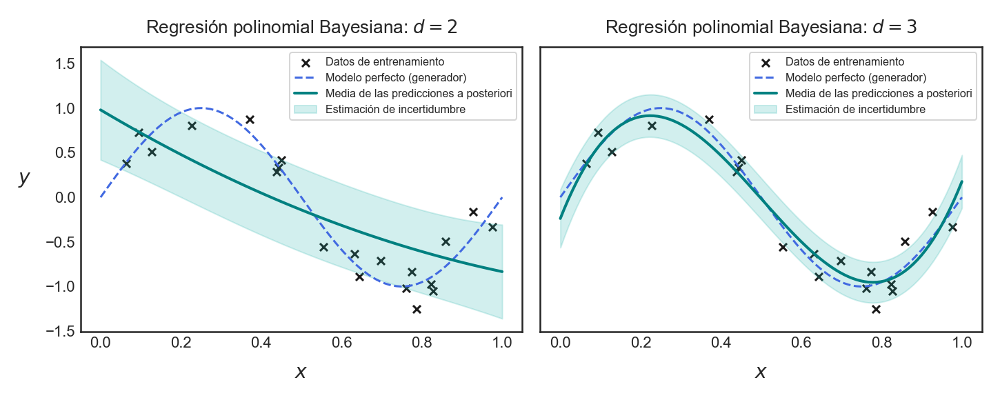

In [85]:
# Graficamos los resultados del modelo.
fig, ax = plt.subplots(figsize=(10, 4), ncols=2, sharey=True)
ax[0].scatter(
    X_train, y_train, s=30, marker="x", color="k", label="Datos de entrenamiento",
)
ax[0].plot(
    X_test, np.sin(2 * np.pi * X_test), color="royalblue", 
    lw=1.5, linestyle="--", label="Modelo perfecto (generador)",
)
ax[0].plot(
    X_test, y_mean_quad, color="teal", lw=2.0, label="Media de las predicciones a posteriori",
)
ax[0].fill_between(
    x=X_test, y1=y_mean_quad - y_std_quad, y2=y_mean_quad + y_std_quad, color="lightseagreen", 
    alpha=0.2, label="Estimación de incertidumbre",
)
ax[1].scatter(
    X_train, y_train, s=30, marker="x", color="k", label="Datos de entrenamiento",
)
ax[1].plot(
    X_test, np.sin(2 * np.pi * X_test), color="royalblue", 
    lw=1.5, linestyle="--", label="Modelo perfecto (generador)",
)
ax[1].plot(
    X_test, y_mean_cubic, color="teal", lw=2.0, label="Media de las predicciones a posteriori",
)
ax[1].fill_between(
    x=X_test, y1=y_mean_cubic - y_std_cubic, y2=y_mean_cubic + y_std_cubic, color="lightseagreen", 
    alpha=0.2, label="Estimación de incertidumbre",
)
ax[0].legend(loc="best", frameon=True, fontsize=8)
ax[0].set_xlabel(r"$x$", fontsize=14, labelpad=10)
ax[0].set_ylabel(r"$y$", fontsize=14, rotation=0, labelpad=15)
ax[0].set_title("Regresión polinomial Bayesiana: " + r"$d = 2$", fontsize=13, pad=10)
ax[1].legend(loc="best", frameon=True, fontsize=8)
ax[1].set_xlabel(r"$x$", fontsize=14, labelpad=10)
ax[1].set_title("Regresión polinomial Bayesiana: " + r"$d = 3$", fontsize=13, pad=10)
plt.tight_layout();

En los gráficos anteriores se muestran los resultados derivados de los modelos polinomiales Bayesianos, de grado $d=2$ y $d=3$, respectivamente. Los datos de entrenamiento se representan como marcadores en forma de `x`, mientras que el valor esperado de las predicciones del modelo se muestra como una línea continua de color verde. Observemos además que hemos graficado, usando una línea segmentada de color azul, la relación trigonométrica que hemos utilizado para generar originalmente nuestros datos, a modo comparativo. 

Cuando $d=2$, el valor medio de las predicciones a posteriori toma la forma de una curva cuadrática decreciente cuya incertidumbre se representa por medio de una banda de color verde transparente, limitada en cada caso por la desviación estándar derivada de la distribución a posteriori de las predicciones. Dicha banda tiene una amplitud singificativa, lo que da cuenta de que el nivel de incertidumbre asociada a estas predicciones es alto y, por tanto, da cuenta de la insuficiente calidad de este modelo.

Cuando $d=3$, el nivel de incertidumbre del modelo es evidentemente más bajo, puesto que la desviación estándar de la distribución a posteriori de las predicciones es mucho menor que en el caso cuadrático, lo que es consistente con la mejor calidad en las estimaciones realizadas. Esto último puede comprobarse visualmente, puesto que ambas curvas –la de (valor esperado de) nuestro modelo y la relación generadora de los datos de entrenamiento–, tienen un recorrido muy similar, siendo mayor la contribución de incertidumbre debida al ruido de las observaciones correspondientes. ◼︎

### Implementaciones más avanzadas.
La implementación del modelo lineal Bayesiano en **<font color='mediumorchid'>Scikit-Learn</font>** es más bien directa, con pocas opciones de personalización. Por ejemplo, no podemos establecer nuestras propias distribuciones a priori, ya que los hiperparámetros asociados a la implementación `BayesianRidge` vienen preseteados como variables aleatorias con distribución Gamma. Para construir modelos más personalizados, es mejor utilizar otras librerías más orientadas a este tipo de trabajos. Algunas opciones populares son:

- **<font color='mediumorchid'>PyMC</font>** (previamente conocida como **<font color='mediumorchid'>PyMC3</font>**): Librería de Python especializada en programación probabilística, y especialmente versada en todo tipo de modelos Bayesianos.
- **<font color='mediumorchid'>Emcee</font>**: Librería de Python especializada en el muestreo de de distribuciones de probabilidad (a posteriori) de gran complejidad, por medio de un algoritmo especializado.

Si bien no es parte de los objetivos de estos apuntes, ilustraremos de forma más bien introductoria el uso de estas librerías por medio de un par de ejemplos. Para ello, será esencial familiarizarnos con un concepto que ciertamente escapa un poco del alcance de los modelos de regresión lineal, pero que de todas maneras revisaremos en forma somera a fin de darle contexto al uso de las librerías anteriores, ya que ambas basan su uso en este concepto, aunque con algoritmos especializados diferentes. Tal concepto se denomina **método de Monte Carlo por cadenas de Markov** (comúnmente abreviado como **MCMC**, del inglés *Markov chain Monte Carlo*).

Los métodos de Monte Carlo por cadenas de Markov son una familia de algoritmos utilizados para **muestrear de distribuciones de probabilidad de alta complejidad**, especialmente cuando la dimensión del espacio de parámetros que caracterizan a tales distribuciones hace impracticable el muestreo directo, por lo difícil que resulta (computacionalmente) calcular las integrales que las definen. Estos métodos **combinan la teoría de cadenas de Markov y la simulación de Monte Carlo** para generar muestras que, después de un período inicial, pueden considerarse provenientes de la distribución de interés, siempre que contemos con algunos *insumos* previos.

Para definir estos métodos (en su generalidad), primeros formalizaremos algunos ingredientes esenciales. Primero, la **cadena de Markov**, el cual es un proceso estocástico que cumple la denominada **propiedad de Markov**, donde la probabilidad de transicionar de un estado al siguiente (de dicho proceso) depende únicamente del estado actual, y no de los estados anteriores. En términos didácticos, si el clima de mañana dependiera únicamente del clima ocurrido el día de hoy, sin importar el clima de ayer, anteayer, y de todo el resto del año, podríamos concluir que el clima constituye, por tanto, una cadena de Markov. Matemáticamente, si $X\left( t \right) =x_{t}$ representa el estado del proceso en un tiempo $t$, entonces dicho proceso será una cadena de Markov (discreta en el tiempo) si se cumple que

$$P\left( X_{t+1}=x_{t+1}|X_{t}=x_{t},X_{t-1}=x_{t-1},...,X_{0}=x_{0} \right) =P\left( X_{t+1}=x_{t+1}|X_{t}=x_{t} \right)$$
<p style="text-align: right;">$(4.152)$</p>

El conjunto (numerable) de todos los valores que puede tomar $X_{t}$ es llamado **espacio de estados (discreto)** de la cadena de Markov, y suele denotarse como $S$. Los cambios de un estado $X_{p}$ a otro $X_{q}$ son llamados **transiciones**. La probabilidad de que la cadena transiciones de un estado a otro se denomina, por tanto, **probabilidad de transición**. Tal probabilidad es la que se representa en la fórmula (4.152), referida a la transición desde $X_{t}$ a $X_{t+1}$.

Si el espacio de estados $S$ es finito, entonces la distribución asociada a las probabilidades de transición de la cadena de Markov puede representarse por medio de una matriz $\mathbf{P}$, denominada **matriz de transición**, cuyo elemento ubicado en la fila $i$ y columna $j$ es, en efecto, la probabilidad de transición $P(X_{t+1}=j|X_{t}=i)$, comúnmente abreviándose dicho valor como $p_{ij}$. Esta matriz tiene una propiedad extremadamente útil: Después de cada paso en el tiempo, si tales transiciones son homogéneas (es decir, el tamaño del paso es el mismo cada vez), ésta no cambia. Por lo tanto, la matriz de transición asociada a $k$ pasos en el futuro puede calcularse simplemente como la $k$-ésima *potencia* de $\mathbf{P}$. Es decir, $\mathbf{P}^{k}$ (en el sentido de la multiplicación matricial).

Cuando el espacio de estados $S$ no es discreto, el cálculo de una transición de un estado a otro en una cadena de Markov ya no es tan simple. Para un espacio de estados continuo, es común la utilización de funciones especiales, denominadas **kernel de transición**, que describen la probabilidad de moverse entre distintos estados. Un kernel de transición $K$ permite, en términos muy generales, *mapear* el cambio de un estado $x$ a otro $y$ en una cadena de Markov conforme una fórmula del tipo

$$P\left( X_{t+1}\in \mathcal{A} |X_{t}=x \right) =\int_{\mathcal{A}} K\left( x,y \right) dy$$
<p style="text-align: right;">$(4.153)$</p>

La función $K$ puede tomar diversas formas pre-seteadas por diversos autores. Sin embargo, no profundizaremos en ellas, ya que no es el objetivo de estos apuntes. Simplemente queremos ilustrar ciertos aspectos esenciales de las cadenas de Markov.

La fórmula (4.153) permite formular la siguiente pregunta: ¿Es posible que una cadena de Markov, después de una cantidad infinita de transiciones, converja a un estado final? Y la respuesta es afirmativa. Tal estado se denomina **estado límite** de la cadena, y suele representarse por medio de una **distribución de probabilidad estacionaria** $\pi$, definida como

$$\pi \left( u \right) =\int_{S} \pi \left( x \right) K\left( x,u \right) dx$$
<p style="text-align: right;">$(4.154)$</p>

Bajo ciertas condiciones (irreductibilidad, aperiodicidad, positividad), una cadena de Markov convergerá a su correspondiente distribución estacionaria, independientemente del valor de su estado inicial, después de una determinada cantidad de pasos. De esta manera, en el estado límite, tendremos que, si $X_{t}\sim \pi(x)$, entonces $X_{t+1}\sim \pi(x)$ y, en general, $X_{t+r}\sim \pi(x)$, para todo $r\in \mathbb{N}$. Si el estado límite se alcanza en una cantidad infinita de pasos ($t\rightarrow \infty$), la cadena se denominará **ergódica**.

El segundo ingrediente esencial de los métodos MCMC es la **simulación de Monte Carlo**, la cual es una técnica que suele utilizarse para aproximar propiedades de ciertas distribuciones de probabilidad por medio de muestras aleatorias. Formalmente, esta técnica suele construir aproximaciones de integrales que representan valores esperados de una cierta variable aleatoria, por lo que cada vez que la simulación corre, la cantidad de valores obtenidos debiera tener una distribución "parecida" a la que pretendemos aproximar. Matemáticamente, la técnica de Monte Carlo suele considerar problemas en los cuales deseamos aproximar integrales del tipo

$$\mathrm{E} \left[ f\left( X \right) \right] =\int_{S} \pi \left( x \right) f\left( x \right) dx$$
<p style="text-align: right;">$(4.155)$</p>

Donde $f$ es una función que se aplica sobre una variable aleatoria $X$ con distribución de probabilidad $\pi(x)$. En este caso, la técnica de Monte Carlo permite aproximar el valor esperado $\mathrm{E} \left[ f\left( X \right) \right]$ por medio del promedio de las observaciones de $f(X)$. Es decir,

$$\mathrm{E} \left[ f\left( X \right) \right] \approx \frac{1}{m} \sum_{i=1}^{m} f\left( x_{i} \right)$$
<p style="text-align: right;">$(4.156)$</p>

Siempre que las muestras $x_{i}\sim \pi(x)$ sean independientes entre sí.

En la formulación (4.155), las funciones $f(x)$ y $\pi (x)$ son **proporcionales**. Esto suele denotarse como $f(x)\propto \pi (x)$. La proporcionalidad entre funciones es un elemento clave en las técnicas MCMC.

Ya definidos los ingredientes esenciales de los métodos MCMC, prosigamos con su descripción. Un elemento fundamental de estas técnicas corresponde al caminante o "walker". Si estamos interesados en muestrear una distribución de probabilidad objetivo $\pi(x)$ caracterizada por una serie de parámetros cuyos valores comprenden un espacio $\mathcal{W}$, entonces un *walker* no es más que una especie de *entidad* (punto móvil, en un lenguaje menos esotérico) que se mueve por $\mathcal{W}$ siguiendo una cadena de Markov. Cada *walker* permite generar una secuencia de muestras que, después de un período inicial (denominado **burn-in**), se asumen como provenientes de la distribución de probabilidad objetivo. De esta manera, los *walkers* tienen el trabajo de explorar el espacio de parámetros de $\pi(x)$, permitiendo un muestreo eficiente de sus valores que, para un cantidad *suficiente* de muestras, puede aproximar con gran efectividad a $\pi(x)$. Hay ténicas MCMC que hacen uso de un único *walker* (como el algoritmo de Metróplis-Hastings), mientras que otras emplean varios de ellos (como el algoritmo de ensamble de *walkers* afines o simulación Hamiltoniana de tipo Monte Carlo, que se utilizan en las librerías **<font color='mediumorchid'>Emcee</font>** y **<font color='mediumorchid'>PyMC</font>**, respectivamente).

Es cierto. Quizás no está claro el concepto de "walker", pero tengamos paciencia. A continuación, describiremos dos técnicas MCMC que darán luz sobre este concepto.

Partiremos con el **algoritmo de Metrópolis-Hastings**. Nuestro objetivo es generar una secuencia de muestras $\left\{ w_{1},...,w_{n} \right\}$ de una distribución objetivo $\pi(\mathbf{w})$, donde $\mathbf{w}$ es un vector que aglutina a los parámetros de interés de la distribución $\pi$. El algoritmo seguirá la siguiente secuencia lógica:

**Metrópolis-Hastings**<br>
>**Paso 1 – Inicialización:** Seleccionar un valor inicial $w^{(0)}$.<br>
>**Paso 2 – Generación de candidatos:** En cada paso $t$, proponer un nuevo candidato $w^{\ast}$ desde una distribución propuesta, digamos $Q(w^{\ast}|w^{(t-1)})$.<br>
>**Paso 3 – Cálculo de la probabilidad de aceptación:** Calcular la probabilidad de aceptación $\alpha$ del *candidato a solución* $w^{\ast}$ como $$\alpha =\min \left( 1,\frac{\pi\left( w^{\ast} \right) Q\left( w^{\left( t-1 \right)}|w^{\ast} \right)}{\pi\left( w^{\left( t-1 \right)} \right) Q\left( w^{\ast}|w^{\left( t-1 \right)} \right)} \right)$$<br>
>**Paso 4 – Decisión de aceptación:** Generar un número aleatorio $u$ (en general, uniformemente distribuido entre $0$ y $1$). Si $u\leq \alpha$, aceptar el candidato $w^{(t)}=w^{\ast}$. De lo contrario, rechazarlo y mantener el valor anterior $w^{(t)}=w^{(t-1)}$.<br>
>**Paso 5 – Iteración:** Repetir los pasos 2 al 4 hasta obtener un número suficiente de muestras (tal número de iteraciones es, naturalmente, un hiperparámetro del algoritmo).<br>

<p style="text-align: center;">Algoritmo (4.1): Esquema general del algoritmo de Metrópolis-Hastings</p>

Hay varias observaciones que realizamos en relación al algoritmo:

- La decisión sobre qué distribución de propuesta $Q$ utilizaremos afecta, por supuesto, a la eficiencia del algoritmo. Es muy común la elección de distribuciones simétricas (es decir, tales que $Q\left( w^{\left( t-1 \right)}|w^{\ast} \right) =Q\left( w^{\ast}|w^{\left( t-1 \right)} \right)$), ya que de esta manera la fórmula de la probabilidad de aceptación se simplica a $\alpha =\min \left( 1,\frac{\pi \left( w^{\ast} \right)}{\pi \left( w^{\left( t-1 \right)} \right)} \right)$. En la práctica, muchas implementaciones computacionales escogen distribuciones normales centradas en $w^{(t-1)}$. La única *exigencia* es que $Q(w)$ debe ser proporcional a $\pi(w)$.
- Después del período de *burn-in*, la cadena **converge** a la distribución $\pi(w)$. Esto es consecuencia de la **propiedad de estacionariedad** de las cadenas de Markov.
- Notemos que, en el algoritmo de Metrópolis-Hastings, se emplea un único *walker*, y que corresponde a la cadena de Markov que se mueve por el espacio de parámetros propio de la distribución que queremos muestrear. De esta manera, en cada iteración $t$, el *walker* se encuentra en la posición $w^{(t-1)}$ de dicho espacio. Tal posición cambiará dependiendo de la probabilidad de aceptación $\alpha$ para cada $t$.

Naturalmente, no explicamos todo lo anterior únicamente por el place de "saber más" sólo porque sí. Debido a que las técnicas MCMC son especialmente útiles para muestrear valores desde una distribución a posteriori, es razonable su utilización en la construcción de modelos de regresión Bayesianos, donde, como vimos previamente, deseamos estimar la distribución (a posteriori) de los parámetros de tales modelos, dado un conjunto de entrenamiento y una distribución a priori para tales parámetros. Para ejemplificar, consideremos un conjunto de entrenamiento $\mathcal{D} =\left\{ \left( \mathbf{X} ,\mathbf{y} \right) :\mathbf{X} \in \mathbb{R}^{m\times n} \wedge \mathbf{y} \in \mathbb{R}^{m} \right\}$, donde $\mathbf{X}$ es la correspondiente matriz de diseño e $\mathbf{y}$ es el correspondiente vector de valores observados respecto del cual deseamos entrenar un modelo. Si $\mathcal{X}$ y $\mathcal{Y}$ representan los espacios de atributos y de salida, respectivamente, de $\mathcal{D}$, entonces nuestro objetivo, como ya sabemos, es construir un modelo de regresión del tipo $\mathbf{y} =\mathbf{X} \mathbf{w} +\mathbf{\varepsilon}$, donde $\mathbf{w}\in \mathbb{R}^{n}$ es el vector de parámetros que deseamos estimar y $\mathbf{\varepsilon}\in \mathbb{R}^{m}$ es el ruido (Gaussiano) asociado a las observaciones de $\mathcal{D}$, siendo tal que $\mathbf{\varepsilon}\sim \mathcal{N}(0, \sigma^{2})$. De la ecuación (4.136), sabemos que la función de verosimilitud que nos permite formular el problema de regresión en un conexto Bayesiano es $P\left( \mathcal{Y} |\mathcal{X} ,\mathbf{w} \right) =\mathcal{N} \left( \mathbf{y} |\mathbf{X} \mathbf{w} ,\sigma^{2} \mathbf{I} \right)$.

Si $P(\mathbf{w})$ representa la distribución a priori para los parámetros del modelo, de la ecuación (4.140), sabemos que la distribución a posteriori $P\left( \mathbf{w} |\mathcal{X} ,\mathcal{Y} \right)$ puede expresarse como

$$P\left( \mathbf{w} |\mathcal{X} ,\mathcal{Y} \right) \propto P\left( \mathbf{w} \right) P\left( \mathcal{Y} |\mathcal{X} ,\mathbf{w} \right)$$
<p style="text-align: right;">$(4.157)$</p>

A fin de evitar los cálculos explícitos, podemos aplicar el algoritmo de Metrópolis-Hastings para obtener una cantidad suficientemente grande de muestras de $P\left( \mathbf{w} |\mathcal{X} ,\mathcal{Y} \right)$ que *converjan* a la distribución real. De esta manera, la fórmula de la probabilidad de aceptación en este contexto toma la forma

$$\alpha =\min \left( 1,\frac{P\left( \mathbf{w}^{\ast} \right) P\left( \mathcal{Y} |\mathcal{X} ,\mathbf{w}^{\ast} \right) Q\left( \mathbf{w}^{\left( t-1 \right)} |\mathbf{w}^{\ast} \right)}{P\left( \mathbf{w}^{\left( t-1 \right)} \right) P\left( \mathcal{Y} |\mathcal{X} ,\mathbf{w}^{\left( t-1 \right)} \right) Q\left( \mathbf{w}^{\ast} |\mathbf{w}^{\left( t-1 \right)} \right)} \right)$$
<p style="text-align: right;">$(4.158)$</p>

La elección de $Q$ es, por tanto, clave en este diseño. En general, dependiendo del planteamiento del modelo de regresión modelo, lo normal será escoger una distribución normal para $P(\mathbf{w})$ y una distribución Gamma inversa para la varianza del ruido $\sigma^{2}$, aunque siempre dependerá de la información con la cual contemos para un determinado problema.

La mayoría de las librerías especializadas en métodos MCMC emplean algoritmos de muestreo de mayor complejidad, sobretodo enfocados en poder recorrer el espacio de parámetros de la distribución de probabilidad de interés por medio de varios *walkers* en vez de sólo uno, como en el caso del algoritmo de Metrópolis-Hastings. Previamente habíamos comentado que la librería **<font color='mediumorchid'>Emcee</font>** emplea, para el muestreo de distribuciones de interés, un algoritmo denominado **ensamble de "walkers" afines**, que hace uso de un conjunto colectivo o *ensamble* múltiples cadenas de Markov independientes entre sí para explorar el espacio de parámetros de interés, cuyas posiciones se actualizan conforme las posiciones del resto de los *walkers*. En esencia, el objetivo de este algoritmo es exactamente el mismo que el del algoritmo de Metrópilos-Hastings; es decir, queremos generar una secuencia de muestras $\left\{ w_{1},...,w_{n} \right\}$ de una distribución objetivo $\pi(\mathbf{w})$, donde $\mathbf{w}$ es un vector que aglutina a los parámetros de interés de la distribución $\pi$. El algoritmo seguirá la siguiente secuencia lógica:

**Ensamble de "walkers" afines**<br>
>**Paso 1 – Inicialización:** Seleccionar un conjunto inicial de posiciones para los $r$ *walkers* $\left\{ w_{1}^{\left( 0 \right)},w_{2}^{\left( 0 \right)},...,w_{r}^{\left( 0 \right)} \right\}$.<br>
>**Paso 2 – Actualización de "walkers":** Para cada iteración, actualizamos la posición de cada caminante $w_{k}$ (para $k=1,...,r$) utilizando las posiciones del resto de los "walkers". Para ello:.<br>
>>**Paso 2.1 – Selección de un "walker" complementario:** Para el "walker" $k$-ésimo, seleccionamos otro "walker" $p$ ($k\neq p$) del ensamble.<br>
>>**Paso 2.2 – Propuesta de actualización:** Generamos un factor de escalamiento $z$ a partir de una función de densidad $g(z)$ definida en el intervalo cerrado $[a, b]$, donde $0<a<1<b$. De lo anterior, calculamos la posición propuesta $w_{k}^{\ast}$ conforme la fórmula $$w_{k}^{\ast}=w_{p}+z\left( w_{k}-w_{p} \right)$$<br>
>>**Paso 2.3 – Cálculo de probabilidad de aceptación:** Calculamos la probabilidad de aceptación $\alpha$, definida como $$\alpha =\min \left( 1,z^{n-1}\frac{\pi \left( w_{k}^{\ast} \right)}{\pi \left( w_{i} \right)} \right)$$ Donde $n$ es la dimensión del espacio de parámetros.<br>
>>**Paso 2.4 – Decisión de aceptación:** Generamos un número aleatorio $u$ a partir de una distribución uniforme definida en $(0, 1)$, respecto del cual contrastamos la probabilidad $\alpha$. Si $u\leq \alpha$, entonces aceptamos la propuesta y, por tanto, $w_{k}^{\left( t+1 \right)}=w_{k}^{\ast}$. Por el contrario, si $u>\alpha$, rechazamos la propuesta y, por tanto, $w_{k}^{\left( t+1 \right)}=w_{k}^{\left( t \right)}$.<br>

>**Paso 3 – Repetición:** Se repite el paso 2 para todos los "walkers" del ensamble, y proseguimos hasta obtener un número suficiente de muestras.

<p style="text-align: center;">Algoritmo (4.2): Esquema general del algoritmo de ensamble de "walkers" afines</p>

El algoritmo de ensamble de *walkers* afines difiere del algoritmo de Metrópolis-Hastings en el número $r$ de *walkers* a emplear para explorar el espacio de parámetros y en la estructura de la fórmula de la probabilidad de aceptación $\alpha$ utilizada para contrastar las posiciones individuales del ensamble en cada iteración. La utilización de un factor de escalamiento permite que este algoritmo sea invariante frente a transformaciones afines; es decir, su rendimiento no se ve afectado por rotaciones, traslaciones lineales o cambios de escala en los parámetros de interés.

La distribución $g(z)$ comúnmente empleada en el paso 2.2 del algoritmo (4.2) es $g(z)= \frac{1}{\sqrt{z}}$, para $z=\left[ \frac{1}{a} ,a \right]$, siendo $a$ por tanto un hiperparámetro que controla la amplitud de la distribución $g$ (comúnmente, se escoge $a=2$).

La aplicación del algoritmo (4.2) para la construcción de un modelo de regresión Bayesiana no es muy distinta al que se planteó para el caso del algoritmo (4.1). A continuación, ilustraremos su implementación por medio de un ejemplo utilizando la librería **<font color='mediumorchid'>Emcee</font>**. Este ejercicio es muy similar al visto en el ejemplo (4.9), donde mostramos cómo transformar un problema de regresión no lineal en otro lineal por medio de la introducción de transformaciones trigonométricas.

**Ejemplo 4.23 – Una aproximación de los ciclos de Milankovitch de la Tierra por medio de sumas parciales semi-periódicas:** En el contexto de la geofísica, los **ciclos de Milankovitch** o **variaciones orbitales** permiten describir los efectos conjuntos sobre el movimiento del planeta Tierra por efecto del clima en una extensión de tiempo geológica (miles a millones de años). Tales efectos se observan en variables geofísicas de diversa naturaleza, tales como el eje de rotación de la Tierra, la excentricidad de su órbita, su índice de precesión, los cambios de temperatura en distintos espacios de tiempo geológico, espesor de capas de permahielo, entre otros. Se trata de uno de los fenómenos más estudiados por científicos y físicos en todo el mundo.

En este ejercicio, intentaremos aproximar el ciclo observado sobre diferencias de temperatura en una escala de tiempo geológico por medio de una serie semiperiódica de términos sinusoidales de la forma

$$y\left( t \right) =a_{0}+\sum_{k=1}^{s} a_{k}\  \mathrm{sen} \left( \frac{2\pi t}{p_{k}} \right)$$
<p style="text-align: right;">$(4.158)$</p>

Antes de proseguir, los créditos: Este ejercicio se ha modificado del maravilloso [tutorial de Python for Astronomers](https://github.com/prappleizer). Estos repositorios son fantásticos para aprender de todo un poco.

En el modelo (4.158), los parámetros a estimar son $a_{0}$, $a_{k}$ y $p_{k}$. El número $s$ de términos trigonométricos es variable y dependerá del nivel de complejidad que estemos dispuestos a aceptar. La variable de salida $y$ será el cambio de temperatura en distintos períodos geológicos de tiempo, fechados en edades $t$ estrictamente crecientes. El parámetro de sesgo $a_{0}$ representará, por tanto, el cambio inicial de temperatura (cuanto $t=0$). Notemos que este modelo es lineal en los parámetros $a_{0}$ y $a_{k}$ con respecto a las variables transformadas $\mathrm{sen} (2\pi t/p_{k})$, para $k=1,...,s$, pero no es lineal con respecto a los parámetros $p_{k}$, aunque estos últimos pueden escogerse libremente conforme una distribución a priori a fin de verificar los modelos resultantes, a fin de mantener la linealidad del modelo transformado.

Partiremos instalando las librerías de interés. En este caso, utilizaremos la librería **<font color='mediumorchid'>Emcee</font>** para implementar el algoritmo MCMC de ensamble de *walkers* afines a fin de generar muestras de la distribución a posteriori $P\left( \mathbf{w} |\mathcal{X} ,\mathcal{Y} \right)$ de los parámetros aglutinados en el vector $\mathbf{w}$ (conforme nuestros datos de entrenamiento), a partir de la distribución $P\left( \mathbf{w} \right) P\left( \mathcal{Y} |\mathcal{X} ,\mathbf{w} \right)$, que es proporcional a la distribución a posteriori. También haremos uso de la librería **<font color='mediumorchid'>Corner</font>**, que suele emplearse junto a **<font color='mediumorchid'>Emcee</font>** para visualizar los resultados de los muestreos correspondientes en términos de sus distribuciones marginales (individuales, de cada parámetro):

In [86]:
!pipenv install corner emcee

Installing corner...
Resolving corner...
✔ Installation Succeeded
⠋ Installing corner...
Installing emcee...
Resolving emcee...
✔ Installation Succeeded
⠋ Installing emcee...
Installing dependencies from Pipfile.lock (10055e)...


Trabajaremos con el archivo estático `ice_core_data.txt`, el cual corresponde a un registro de `5788` *observaciones* asociadas a diferentes tiempos geológicos para una serie de variables involucradas en las variaciones orbitales del planeta Tierra, como el contenido de deuterio atmosférico, cambios de temperatura, edad geológica, etc. Debido a que la extensión de este archivo es `.txt` y se trata de un archivo separado por espacios, accedemos a él haciendo uso de **<font color='mediumorchid'>Pandas</font>**:

In [87]:
import corner
import emcee

In [88]:
# Accedemos a nuestro archivo con los datos.
data = pd.read_csv("datasets/ice_core_data.txt", delimiter=r"\s+", names=[f"x{j}" for j in range(1, 6)])

In [89]:
# Inspeccionamos las primeras filas del dataset.
data.head()

,x1,x2,x3,x4,x5
0,13,6.60,38.37379,-390.9,0.88
1,14,7.15,46.81203,-385.1,1.84
2,15,7.70,55.05624,-377.8,3.04
3,16,8.25,64.41511,-394.1,0.35
4,17,8.80,73.15077,-398.7,-0.42


En este caso particular, estamos interesados en la edad geológica de interés como variable independiente (columna `"x3"`) y el cambio de temperatura medido en distintas muestras de hielo (columna `"x5"`). Para visualizar el problema de interés, graficaremos ambas variables:

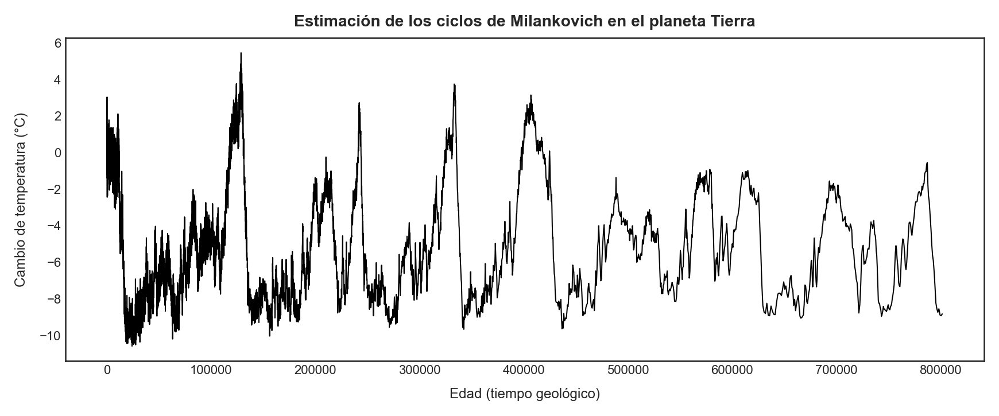

In [90]:
# Visualizamos la serie de tiempo para la temperatura.
fig, ax = plt.subplots(figsize=(12, 5))
ax.plot(data["x3"], data["x5"], color="black", lw=1.0)
ax.set_xlabel("Edad (tiempo geológico)", fontsize=12, labelpad=10)
ax.set_ylabel("Cambio de temperatura (°C)", fontsize=12, labelpad=10)
ax.set_title("Estimación de los ciclos de Milankovich en el planeta Tierra", fontsize=14, fontweight="bold", pad=10)
plt.tight_layout();

Podemos observar que esta serie de tiempo presenta, aproximadamente, tres semiperíodos, los que son puntos en el tiempo (edad geológica) donde la señal de cambio de temperatura tiende a retomar su recorrido inmediatamente anterior: 26000, 41000 y 100000 años. Verificaremos si nuestro modelo, más adelante, puede acercarse a esos valores.

Uno de los aspectos más importantes de trabajar en **<font color='mediumorchid'>Emcee</font>** es el hecho de que su filosofía de trabajo (como API) no es para nada similar a la de **<font color='mediumorchid'>Scikit-Learn</font>**. En general, estamos interesados en definir ciertas funciones que son necesarias (como `callables`) para una ejecución del muestreo MCMC de interés. La primera de estas funciones debe describir el modelo de interés y, como mínimo, debe aceptar como argumentos al vector de parámetros de interés (que llamaremos `w`) y a un arreglo de valores que se corresponden con la variable independiente (que llamaremos `t`). Es aquí donde definimos el modelo (4.158), al que llamaremos `linear_model()`:

In [91]:
def linear_model(
    w: np.ndarray, t: np.ndarray,
):
    a1, a2, a3, p1, p2, p3, T0 = w
    delta_T = T0\
        + a1 * np.sin(2 * np.pi * t / p1)\
        + a2 * np.sin(2 * np.pi * t / p2)\
        + a3 * np.sin(2 * np.pi * t / p3)
    return delta_T

Notemos que el modelo así definido constituye un total de tres términos en la suma (4.158). El parámetro de sesgo $a_{0}$ es representado por medio de la variable (interna) `T0`.

A continuación debemos definir una función que hará el papel de comprobar la calidad del modelo con respecto a los datos de entrenamiento. Tal función permitirá a nuestro método de estimación de los parámetros agrupados en `w` limitar el correspondiente espacio de parámetros, y suele seguir la estructura de un error cuadrático medio, relativo a los errores de medición ($\varepsilon_{1},...,\varepsilon_{m}$, para un total de $m$ instancias de entrenamiento) inferidos para la variable de respuesta que deseamos estimar (el cambio de temperatura en nuestras muestras de hielo). Es decir, tiene la forma

$$L=-\frac{1}{2} \sum_{i=1}^{m} \left( \frac{y_{i}-\hat{y_{i}}}{\varepsilon_{i}} \right)^{2}$$
<p style="text-align: right;">$(4.159)$</p>

Donde $y_{i}$ e $\hat{y}_{i}$ son los valores observados reales y estimados, respectivamente, por nuestro modelo, de los cambios de temperatura. Definiremos esta función en Python como `likelihood()`, y usaremos nuestra función previamente construida `linear_model()` para construir las correspondientes estimaciones:

In [92]:
def likelihood(
    w: np.ndarray, 
    t: np.ndarray, 
    y: np.ndarray, 
    y_err: np.ndarray,
):
    likelihood = -(1/2) * np.sum(
        ((y - linear_model(w, t)) / y_err) ** 2,
    )
    return likelihood

Ahora debemos definir las distribuciones a priori para los parámetros que deseamos estimar, los cuales –recordemos– se agrupan en el vector `w`. En este ejercicio, impondremos como *conocimiento a priori* que $0<a_{k}<5$ y $1\times 10^{4}<p_{k}<2\times 10^{5}$ para todo $k=1,2,3$; y $-10<a_{0}<0$. Para tales efectos, construiremos una función denominada `prior()` que se alimentará únicamente del vector `w`, y que conforme a los requerimiento del API de **<font color='mediumorchid'>Emcee</font>**, retornará cero cuando todos los valores de `w` cumplan con las condiciones anteriores (de manera simultánea), y $-\infty$ cuando no sea así:

In [93]:
def prior(
    w: np.ndarray,
):
    a1, a2, a3, p1, p2, p3, T0 = w
    if (0.0 < a1 < 5.0)\
        and (0.0 < a2 < 5.0)\
        and (0.0 < a3 < 5.0)\
        and (1e+4 < p1 < 2e+5)\
        and (1e+4 < p2 < 2e+5)\
        and (1e+4 < p3 < 2e+5)\
        and (-10.0 < T0 < 0.0):
        return 0.0
    else:
        return -np.inf

Los valores que hemos definido previamente como información a priori no son casuales, y son críticos para la convergencia de nuestro modelo. Notemos que los parámetros $a_{k}$ tienen menos grados de libertad que $p_{k}$, ya que los parámetros $a_{k}$ describen la amplitud de la banda de temperatura, la que, conforme el gráfico que muestra los ciclos para el cambio de temperatura, debería bordear, en promedio, los 5°C. Los parámetros $p_{k}$ describen los semiperíodos asociados al ciclo de interés y que, conforme igualmente al gráfico, son de, al menos, 10.000 años.

La última función que necesitamos definir debe chequear la información a priori seteada para los parámetros de interés en cada iteración del algoritmo de muestreo y, de estar dentro del espacio definido de valores para cada uno de ellos, retornar el error asociado a las estimaciones del modelo usando los parámetros propuestos para dicha iteración haciendo uso de la función `likelihood()`. De no cumplirse con los *supuestos a priori*, tal función debe retornar el valor $-\infty$:

In [94]:
def posterior(
    w: np.ndarray, 
    t: np.ndarray, 
    y: np.ndarray, 
    y_err: np.ndarray,
):
    prior_val = prior(w)
    if not np.isfinite(prior_val):
        return -np.inf
    else:
        return prior_val + likelihood(w, t, y, y_err)

Las cuatro funciones definidas previamente son los ingredientes fundamentales de la implementación del muestreo MCMC por medio de un ensamble de *walkers* afines en **<font color='mediumorchid'>Emcee</font>**. Ahora nos resta construir algunos parámetros iniciales a setear, los cuales serán imputados en un objeto especializado denominado `EnsembleSampler`. Entre otros argumentos, esta clase acepta los siguientes parámetros de entrada:

- `nwalkers`: El número total de *walkers* que recorrerán el espacio de parámetros de interés y que constituyen el ensamble completo.
- `ndim`: La dimensión del espacio de parámetros, y que coincide con el número de parámetros individuales a estimar.
- `log_prob_fn`: La función (en un formato de `callable`) que permite estimar los errores del modelo conforme el cumplimiento previo de los supuestos *a priori* imputados en nuestro problema.
- `args`: Una serie de argumentos adicionales que son consumidos por la función `log_prob_fn()`. En estricto rigor, tales argumentos son tales que `log_prob_fn(w, *args)` y, para el caso de nuestro ejercicio, es donde imputaremos los datos de interés.

En primer lugar, notamos que el método MCMC provisto por el objeto `EnsembleSampler` exige disponer de mediciones asociadas al error de observación en la variable de respuesta (que es producto del modelo), pero nuestro DataFrame no dispone de tales mediciones y, en general, será difícil saber el error o ruido asociado a las observaciones de interés. Para efectos prácticos, asumiremos que dicho error es igual a un 5% de la media de las observaciones de cambio de temperatura:

In [95]:
# Estimamos el error asociado a las mediciones en diferencias de temperatura.
T_err = 0.05 * data["x5"].mean()

In [96]:
# Mostramos este error en pantalla (en unidades de temperatura, °C).
print(f"Error estimado = {round(T_err, 4)} °C")

Error estimado = -0.2289 °C


A continuación debemos construir la estructura requerida por nuestra función de verosimilitud. Tal estructura es una tupla del tipo `(w, t, y, y_err)`, de la cual, previo a la ejecución del muestreo MCMC, contamos con los tres últimos componentes. Construiremos dicha tupla rápidamente, y la asignaremos a la variable `data_mcmc`:

In [97]:
# Seleccionamos únicamente el subconjunto de datos de interés.
data = data[["x3", "x5"]].rename(columns={"x3": "age", "x5": "temp_diff"})

In [98]:
# Generamos la estructura de datos requerida por el método.
data_mcmc = (data["age"].values, data["temp_diff"].values, T_err)

Ahora definimos los parámetros necesarios para inicializar el objeto `EnsembleSampler` y, además, algunos parámetros adicionales que serán necesarios para la ejecución del muestreo MCMC. Tales parámetros se aplicarán sobre el método `run_mcmc()`, y corresponden a:

- `initial_state`: Posición inicial (aleatorizada) de los *walkers*. Estas posiciones suelen especificarse en un contenedor, como una lista de Python, donde cada elemento es un vector que tiene tantas componentes como parámetros a estimar, y que describen esas posiciones. La lista tendrá tantos elementos como *walkers* a emplear para explorar el espacio de parámetros de interés.
- `nsteps`: Número de iteraciones a ejecutar por el algoritmo de ensamble.
- `progress`: Parámetro booleano que permite definir si se mostrará o no una barra de progreso para la ejecución del algoritmo.

Procedemos pues conforme los parámetros requeridos:

In [99]:
# Definimos una semilla aleatoria fija.
rng = np.random.default_rng(seed=42)

In [100]:
# Definimos algunos hiperparámetros para nuestro método MCMC.
n_walkers = 128
n_iter = 500
init_pos = np.array(
    [1.0, 1.0, 1.0, 2.6e+4, 4.1e+4, 1.0e+5, -4.5],
)
n = len(init_pos)
rand_init_pos = [np.array(init_pos) + 1e-7 * rng.uniform(low=-0.5, high=0.5, size=n) for j in range(n_walkers)]

Instanciaremos pues nuestro `EnsambleSampler` conforme `128` *walkers*, ejecutando el muestreo conforme `500` iteraciones para un total de `7` dimensiones en el espacio de parámetros. La posición inicial a partir de la cual generaremos las posiciones aleatorizadas para todos los *walkers* estará definida por el vector `[1.0, 1.0, 1.0, 2.6e+4, 4.1e+4, 1.0e+5, -4.5]`:

In [101]:
# Definimos el objeto que nos permitirá extraer muestras de la distribución a posteriori.
sampler = emcee.EnsembleSampler(
    nwalkers=n_walkers,
    ndim=n,
    log_prob_fn=posterior,
    args=data_mcmc,
)

Vamos a ejecutar dos corridas de MCMC para nuestro ejercicio. La primera será una corrida inicial de prueba o *burn-in*, de `100` iteraciones, que servirá para que nuestros *walkers* hagan una pequieña exploración inicial del espacio de parámetros:

In [102]:
# Primera corrida de "burn-in".
result_burn_in = sampler.run_mcmc(initial_state=rand_init_pos, nsteps=100, progress=True)
sampler.reset()

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:03<00:00, 31.45it/s]


Y a continuación generamos la corrida de producción o definitiva. En este caso, la posición inicial de los *walkers* se setea como `None`, a fin de indicarle al algoritmo de muestreo que reutilice la última posición almacenada, y que fue definida a partir del proceso de *burn-in*:

In [103]:
# Corrida de producción completa.
result = sampler.run_mcmc(initial_state=None, nsteps=n_iter, progress=True)

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:13<00:00, 37.73it/s]


Al ejecutar el método `run_mcmc()`, el resultado se almacena en un objeto de tipo `State`, que funciona como una tupla cuyos elementos almacenan las posiciones finales de los *walkers*, las probabilidades asociadas de cada uno (a posteriori) y el estado de cada cadena (referenciado a la variable independiente –la edad geológica, en sus unidades–). Podemos almacenar estos elementos en variables separadas para inspeccionarlas posteriormente:

In [104]:
# Separamos los elementos que constituyen el resultado.
res_pos, res_prob, res_state = result

Sin embargo, es natural que lo que más queramos es visualizar rápidamente nuestros resultados. Para ello, podemos obtener muestras de nuestro objeto `EnsembleSampler` por medio del atributo `flatchain`, lo que retorna todas las cadenas o *walkers* resultantes del proceso de muestreo, en una estructura *plana* que facilita significativamente su uso. En este contexto, que la estructura sea *plana* significa todos los *walkers* se muestran en una única secuencia para cada parámetro de interés. Es decir, el arreglo resultante tiene dimensiones `(n_walkers * n_iter, n)`:

In [105]:
# Obtenemos una versión plana de los walkers resultantes.
flat_samples = sampler.flatchain

Para visualizar nuestros resultados, escogeremos aleatoriamente un total de `250` *walkers* en sus posiciones finales, los que mapearán los parámetros de interés, y los graficaremos junto a la señal original del ciclo de Milankovitch de interés. En un escenario ideal, la mayoría de los *walkers* deberían producir estimaciones similares de dicha señal, pero también deberíamos observar varias señales muy diferentes. Esto es normal y representa, naturalmente, la **incertidumbre** asociada a las estimaciones, propia de un modelo de regresión Bayesiana:

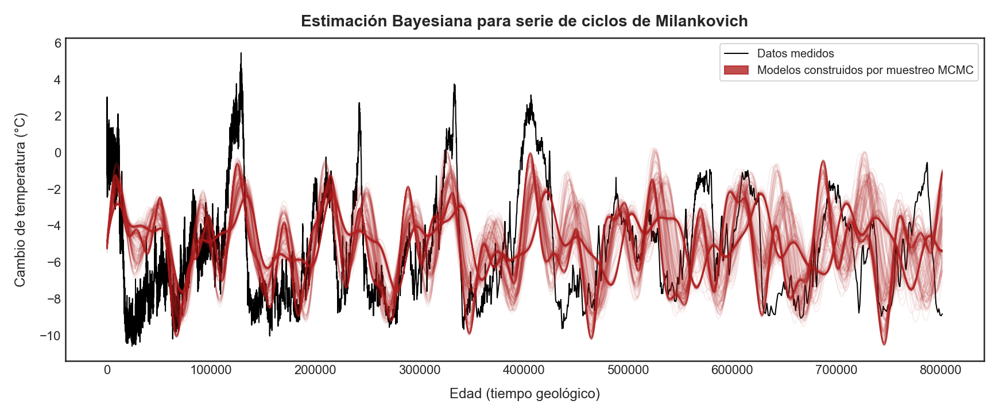

In [106]:
# Graficamos los primeros resultados.
fig, ax = plt.subplots(figsize=(12, 5))
ax.plot(data["age"], data["temp_diff"], color="black", lw=1.0, label="Datos medidos")
for wj in flat_samples[np.random.randint(len(flat_samples), size=250)]:
    ax.plot(data["age"], linear_model(wj, data["age"]), color="firebrick", alpha=0.08, lw=1.0)
ax.fill_between(0 * data["age"], 0, 0, color="firebrick", alpha=0.8, label="Modelos construidos por muestreo MCMC")
ax.set_xlabel("Edad (tiempo geológico)", fontsize=12, labelpad=10)
ax.set_ylabel("Cambio de temperatura (°C)", fontsize=12, labelpad=10)
ax.set_title("Estimación Bayesiana para serie de ciclos de Milankovich", fontsize=14, fontweight="bold", pad=10)
ax.legend(loc="best", frameon=True, fontsize=10)
plt.tight_layout();

Podemos observar que hay varias familias de modelos que se agrupan en torno a las cadenas muestreadas, siendo el primer tercio de la señal de cambio de temperatura la porción con peores resultados (aparentemente) en relación a los modelos construidos. En general, cuando hay varias familias de modelos agrupadas en torno a la señal real, aquello es un indicio de la posible existencia de distribuciones marginales multimodales entre cada par de variables aleatorias y sus distribuciones (a posteriori) que resultan del proceso de muestreo MCMC. Ya verificaremos esto al visualizar tales distribuciones.

Para obtener la estimación máximo verosímil resultante de nuestro modelo, consultamos los valores de verosimilitud asociados (en realidad, sus logaritmos) por medio del atributo `flatlnprobability` de nuestro `EnsembleSampler`. Lo que queremos es localizar los correspondientes máximos valores de verosimilitud y usar esas posiciones para recuperar los parámetros que generan tales valores máximos:

In [107]:
# Extraemos los parámetros asociados a las máximas probabilidades a posteriori.
w_best = flat_samples[np.argmax(sampler.flatlnprobability)]

Y usamos este mejor estimador para representar el mejor modelo:

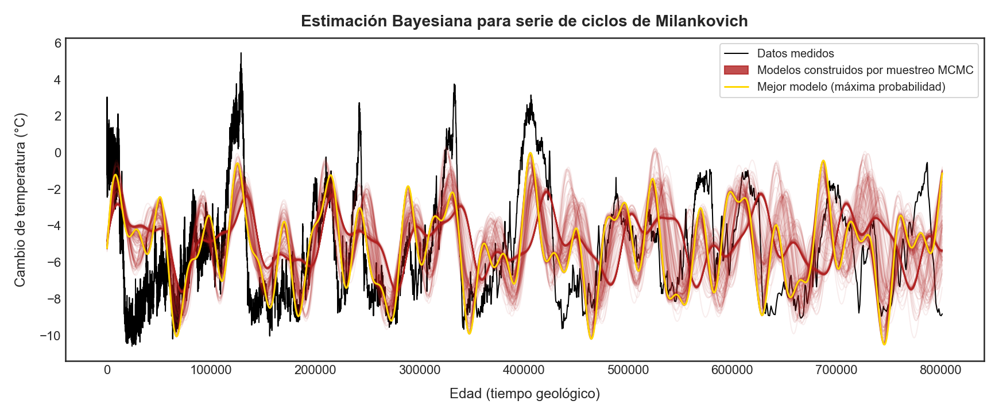

In [108]:
# Graficamos la comparativa versus el mejor modelo.
fig, ax = plt.subplots(figsize=(12, 5))
ax.plot(data["age"], data["temp_diff"], color="black", lw=1.0, label="Datos medidos")
for wj in flat_samples[np.random.randint(len(flat_samples), size=250)]:
    ax.plot(data["age"], linear_model(wj, data["age"]), color="firebrick", alpha=0.08, lw=1.0)
ax.fill_between(0 * data["age"], 0, 0, color="firebrick", alpha=0.8, label="Modelos construidos por muestreo MCMC")
ax.plot(data["age"], linear_model(w_best, data["age"]), color="gold", lw=1.5, label="Mejor modelo (máxima probabilidad)")
ax.set_xlabel("Edad (tiempo geológico)", fontsize=12, labelpad=10)
ax.set_ylabel("Cambio de temperatura (°C)", fontsize=12, labelpad=10)
ax.set_title("Estimación Bayesiana para serie de ciclos de Milankovich", fontsize=14, fontweight="bold", pad=10)
ax.legend(loc="best", frameon=True, fontsize=10)
plt.tight_layout();

In [109]:
# Mostramos en pantalla los mejores valores.
print(f"a1 = {w_best.round(4)[0]}")
print(f"a2 = {w_best.round(4)[1]}")
print(f"a3 = {w_best.round(4)[2]}")
print(f"p1 = {w_best.round(4)[3]}")
print(f"p2 = {w_best.round(4)[4]}")
print(f"p3 = {w_best.round(4)[5]}")
print(f"T0 = {w_best.round(4)[6]}")

a1 = 1.3233
a2 = 2.0859
a3 = 1.8947
p1 = 23520.9879
p2 = 39734.4141
p3 = 96145.9391
T0 = -5.2556


Podemos observar que los semiperíodos estimados por el modelo son cercanos a los que observamos previamente, lo que indica que, como un primer ejercicio o *línea base* hace un trabajo bastante decente.

Ahora emplearemos la librería **<font color='mediumorchid'>Corner</font>** para observar las distribuciones marginales (a posteriori) de cada uno de los parámetros estimados, resultantes de las trayectorias realizadas por los *walkers*. El nombre de esta librería se debe a que ésta se especializa en la creación de grillas de gráficos conocidas como *pairplots*, los que muestran las correspondencias entre cada par de variables de interés. **<font color='mediumorchid'>Corner</font>** está construida sobre una librería llamada **<font color='mediumorchid'>ArViz</font>**, que a su vez, está construida sobre **<font color='mediumorchid'>Matplotlib</font>**, pero a diferencia de otras librerías como **<font color='mediumorchid'>Seaborn</font>**, crea figuras completas en vez de manipular paneles de manera independiente.

**<font color='mediumorchid'>Corner</font>** permite crear rápidamente un *pairplot* de las distribuciones a posteriori marginales resultantes de nuestro proceso de muestreo por medio de la función `corner()`. Esta función crea una figura completa de **<font color='mediumorchid'>Matplotlib</font>**, la que, para poder manipular a partir de sus paneles, debe ser referenciada por medio del parámetros `fig`. La [documentación](https://corner.readthedocs.io/en/latest/api/) de **<font color='mediumorchid'>Corner</font>** es muy clara al respecto, pero enunciaremos algunos de los parámetros de esta función, y que son los que vamos a utilizar en este ejercicio:

- `data`: Cualquier arreglo de valores compatible con **<font color='mediumorchid'>ArViz</font>**. No profundizaremos mucho en esto, pero basta saber con que un arreglo de **<font color='mediumorchid'>Numpy</font>** es perfecto para su uso por medio de esta función.
- `show_titles`: Parámetro booleano que permite especificar si se muestran los títulos de cada variable en el gráfico. Tales títulos deben ser especificados por medio de uuna lista asignada al parámetro `labels`.
- `fig`: Parámetro que permite especificar una figura previamente construida directamente por medio de alguna dependencia de **<font color='mediumorchid'>Matplotlib</font>**.
- `quantiles`: Parámetro que permite indicar si deseamos visualizar ciertos percentiles de nuestros datos, especificándolos por medio de una lista de Python.
- `title_kwargs`: Diccionario de Python que permite identificar parámetros que son propios de cualquier función o método que asigne características específicas a los títulos de un gráfico en **<font color='mediumorchid'>Matplotlib</font>** (`plt.title()` o `ax.set_title()`).
- `color`: Parámetro que permite especificar el color de los puntos a mostrar en las correspondientes distribuciones marginales 2D.
- `hist_kwargs`: Diccionario de Python que permite especificar los parámetros propios de los histogramas que se muestran en la diagonal del *pairplot*. Tales parámetros son propios de cualquier constructor de histogramas de **<font color='mediumorchid'>Matplotlib</font>** (como `plt.hist()` o `ax.hist()`).
- `label_kwargs`: Diccionario de Python que permite especificar parámetros propios de cualquier función o metodo que asigne características específicas a las etiquetas de los ejes de un gráfico (por ejemplo, en el eje X, `plt.xlabel()` o `ax.set_xlabel()`).

De esta manera, tenemos:

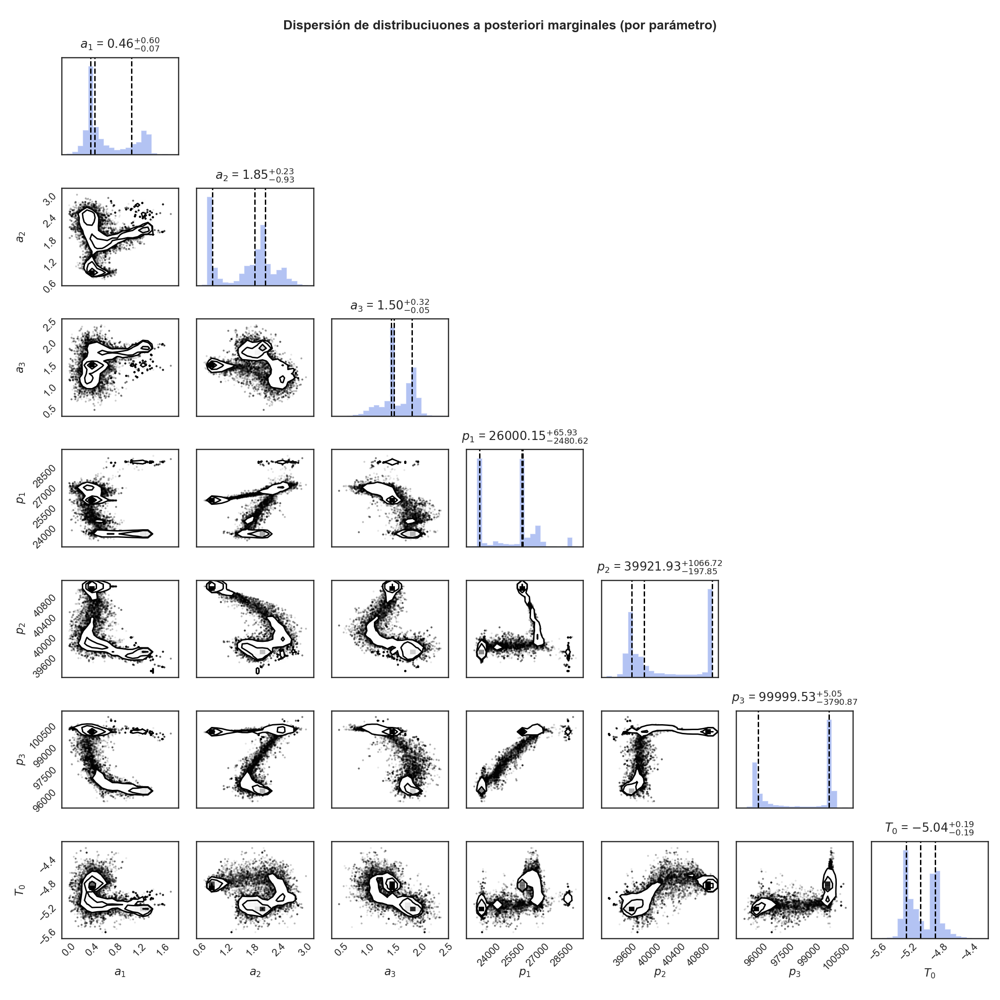

In [110]:
# Mostramos la dispersión de las distribuciones a posteriori marginales.
fig, ax = plt.subplots(figsize=(15, 15), nrows=n, ncols=n)
labels = [r"$a_{1}$", r"$a_{2}$", r"$a_{3}$", r"$p_{1}$", r"$p_{2}$", r"$p_{3}$", r"$T_{0}$"]
corner.corner(
    data=flat_samples, show_titles=True, labels=labels, fig=fig, quantiles=[0.25, 0.5, 0.75], 
    plot_datapoints=True, title_kwargs={"fontsize": 13, "pad": 10}, color="black",
    hist_kwargs={"color": "royalblue", "histtype": "stepfilled", "alpha": 0.4},
    label_kwargs={"labelpad": 20},
)
fig.suptitle(
    "Dispersión de distribuciuones a posteriori marginales (por parámetro)", 
    fontsize=14, fontweight="bold",
)
plt.tight_layout();

Al observar estas distribuciones marginales podemos concluir que los valores obtenidos por nuestro muestreo no son muy buenos. Se aprecian distribuciones multimodales y varias regiones con *outliers*, lo que naturalmente puede resultar en estimaciones máximo verosímiles de baja calidad. Las distribuciones multimodales indican que las cadenas de Markov resultantes **no convergen a un único valor** del parámetro que deseamos estimar, lo que resulta en distintas familias de modelos al trazar cientos de ellos en un gráfico, como vimos previamente.

En determinados casos, esto puede resolverse por medio de fuerza bruta, aumentando el número de *walkers* y de iteraciones en el algoritmo de muestreo. Intentaremos precisamente eso:

In [111]:
# Replanteamos algunos hiperparámetros de nuestro método MCMC.
n_walkers = 256
n_iter = 1000
rand_init_pos = [np.array(init_pos) + 1e-7 * rng.uniform(low=-0.5, high=0.5, size=n) for j in range(n_walkers)]

In [112]:
# Definimos el objeto que nos permitirá extraer muestras de la distribución a posteriori.
sampler = emcee.EnsembleSampler(
    nwalkers=n_walkers,
    ndim=n,
    log_prob_fn=posterior,
    args=data_mcmc,
)

In [113]:
# Primera corrida de "burn-in".
result_burn_in = sampler.run_mcmc(initial_state=rand_init_pos, nsteps=100, progress=True)
sampler.reset()

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:04<00:00, 21.72it/s]


In [114]:
# Corrida de producción completa.
result = sampler.run_mcmc(initial_state=None, nsteps=n_iter, progress=True)

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:43<00:00, 22.82it/s]


In [115]:
# Separamos los elementos que constituyen el resultado.
res_pos, res_prob, res_state = result

In [116]:
# Obtenemos una versión plana de los walkers resultantes.
flat_samples = sampler.flatchain

In [117]:
# Extraemos los parámetros asociados a las máximas probabilidades a posteriori.
w_best = flat_samples[np.argmax(sampler.flatlnprobability)]

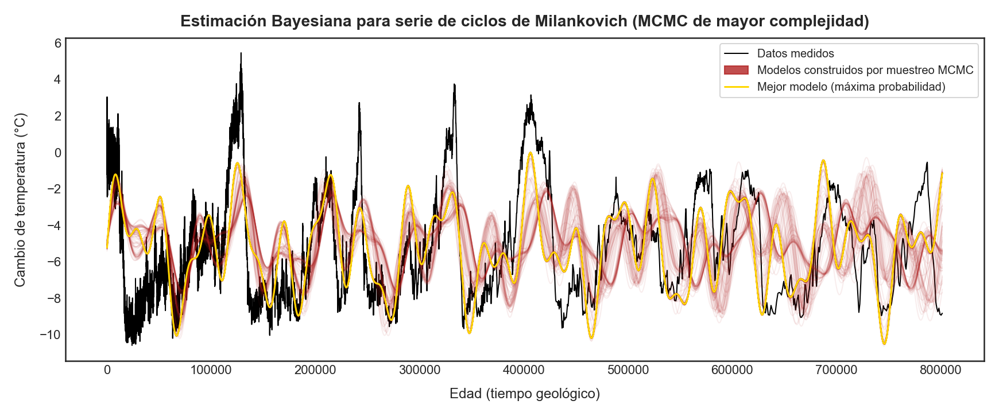

In [118]:
# Graficamos la comparativa versus el mejor modelo.
fig, ax = plt.subplots(figsize=(12, 5))
ax.plot(data["age"], data["temp_diff"], color="black", lw=1.0, label="Datos medidos")
for wj in flat_samples[np.random.randint(len(flat_samples), size=250)]:
    ax.plot(data["age"], linear_model(wj, data["age"]), color="firebrick", alpha=0.08, lw=1.0)
ax.fill_between(0 * data["age"], 0, 0, color="firebrick", alpha=0.8, label="Modelos construidos por muestreo MCMC")
ax.plot(data["age"], linear_model(w_best, data["age"]), color="gold", lw=1.5, label="Mejor modelo (máxima probabilidad)")
ax.set_xlabel("Edad (tiempo geológico)", fontsize=12, labelpad=10)
ax.set_ylabel("Cambio de temperatura (°C)", fontsize=12, labelpad=10)
ax.set_title("Estimación Bayesiana para serie de ciclos de Milankovich (MCMC de mayor complejidad)", fontsize=14, fontweight="bold", pad=10)
ax.legend(loc="best", frameon=True, fontsize=10)
plt.tight_layout();

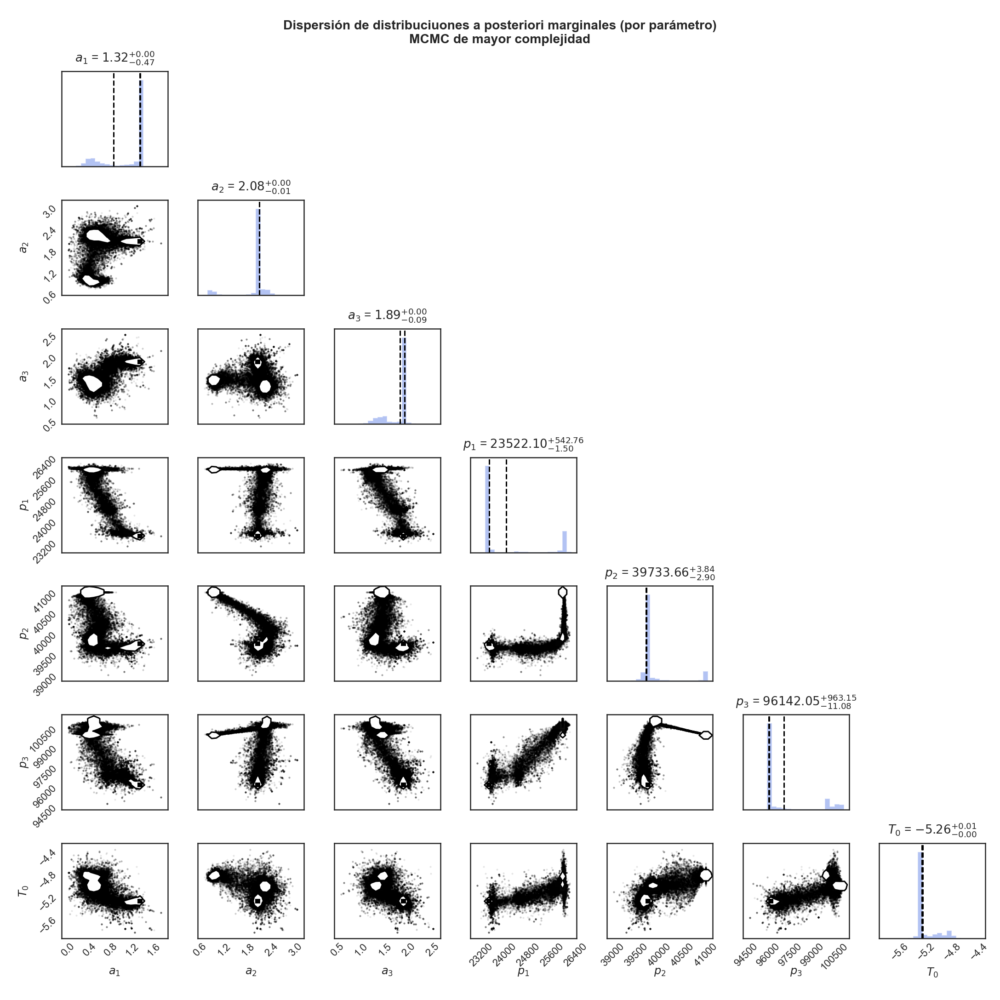

In [119]:
# Mostramos la dispersión de las distribuciones a posteriori marginales.
fig, ax = plt.subplots(figsize=(15, 15), nrows=n, ncols=n)
labels = [r"$a_{1}$", r"$a_{2}$", r"$a_{3}$", r"$p_{1}$", r"$p_{2}$", r"$p_{3}$", r"$T_{0}$"]
corner.corner(
    data=flat_samples, show_titles=True, labels=labels, fig=fig, quantiles=[0.25, 0.5, 0.75], 
    plot_datapoints=True, title_kwargs={"fontsize": 13, "pad": 10}, color="black",
    hist_kwargs={"color": "royalblue", "histtype": "stepfilled", "alpha": 0.4},
    label_kwargs={"labelpad": 20},
)
fig.suptitle(
    "Dispersión de distribuciuones a posteriori marginales (por parámetro)\nMCMC de mayor complejidad", 
    fontsize=14, fontweight="bold",
)
plt.tight_layout();

Los resultados no han mejorado demasiado, lo que indica que esto no es necesariamente un problema de fuerza bruta, sino de nuestros supuestos a priori. Incluso, del modelo escogido para representar la serie de tiempo original. No ahondaremos mucho en replantear todo desde cero, pero sí instamos al lector a realizarlo, a fin de verificar si ocurren ciertos cambios. Por ejemplo, podríamos intentar representar el ciclo de Milankovitch de interés por medio de una serie de Fourier completa, aunque aquello necesariamente inducirá un mayor tiempo de ejecución.

Una visualización interesante que permite ilustrar el resultado global de nuestro procedimiento MCMC corresponde a las distribuciones que se estiman a partir de la trayectoria de los *walkers* en el espacio de parámetros. Esto puede generarse a partir del resultado de la ejecución del algoritmo:

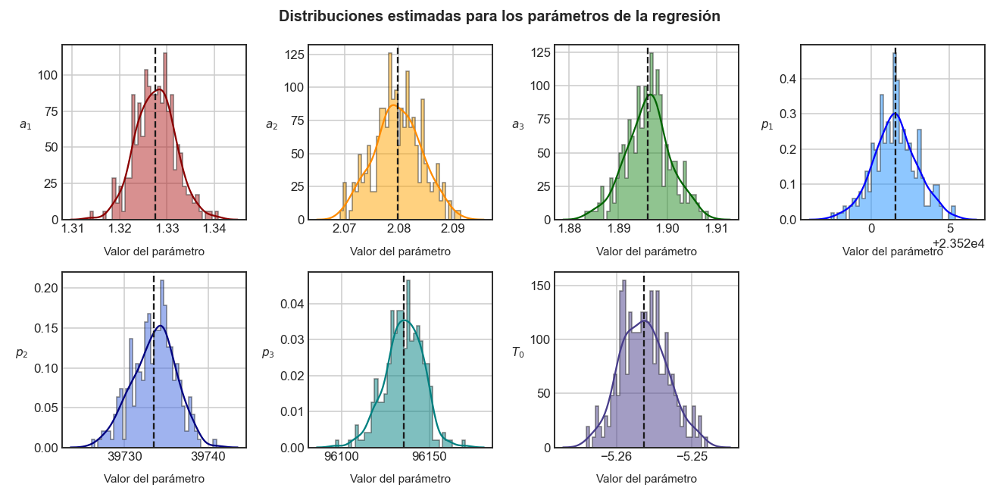

In [120]:
fig, ax = plt.subplots(figsize=(12, 6), ncols=4, nrows=2, dpi=110)

# Definimos las posiciones, colores y etiquetas para cada parámetro.
positions = [(0, 0), (0, 1), (0, 2), (0, 3), (1, 0), (1, 1), (1, 2)]
colors_hist = ["firebrick", "orange", "forestgreen", "dodgerblue", "royalblue", "teal", "darkslateblue"]
colors_kde = ["darkred", "darkorange", "darkgreen", "blue", "navy", "teal", "darkslateblue"]
labels = [r"$a_{1}$", r"$a_{2}$", r"$a_{3}$", r"$p_{1}$", r"$p_{2}$", r"$p_{3}$", r"$T_{0}$"]

# Iteramos sobre cada parámetro para generar los gráficos.
for idx, (pos, color_h, color_k, label) in enumerate(zip(positions, colors_hist, colors_kde, labels)):
    i, j = pos
    # Histograma.
    ax[i, j].hist(
        res_pos[:, idx],
        color=color_h,
        ec="k",
        lw=1.0,
        bins=40,
        histtype="stepfilled",
        density=True,
        alpha=0.5
    )
    # Función de densidad.
    sns.kdeplot(res_pos[:, idx], ax=ax[i, j], color=color_k)
    
    # Etiquetas y grilla.
    ax[i, j].set_ylabel(label, fontsize=10, labelpad=10, rotation=0)
    ax[i, j].set_xlabel("Valor del parámetro", fontsize=10, labelpad=10)
    ax[i, j].grid(True)
    
    # Marcamos la media de las distribuciones estimada (predicción esperada).
    ax[i, j].axvline(res_pos[:, idx].mean(), linestyle="--", color="k", lw=1.5)

# Apagamos el panel que no está en uso.
ax[1, 3].axis("off")

# Generamos un título.
fig.suptitle(
    "Distribuciones estimadas para los parámetros de la regresión",
    fontsize=13,
    fontweight="bold"
)
plt.tight_layout();

Otra última visualización interesante que podemos obtener rápidamente a partir de nuestros resultados, es el de la banda de incertidumbre asociada a nuestro mejor modelo. Tal banda se construye a partir de la desviación estándar (dispersión) del conjunto completo de muestras para cada uno de los parámetros de interés. Para ello, crearemos una función que realizará este trabajo a partir de una muestra *plana* de las cadenas de Markov resultantes del problema. No visualizaremos *todos* los walkers por un tema de eficiencia, pero sí realizaremos una selección aleatoria de los mismos, cuyo número se definirá por medio del hiperparámetro `n_samples`:

In [121]:
def sample_chain(
    data: pd.DataFrame,
    n_samples: int,
    flattened_chain: np.ndarray,
    n_sigma: int,
    random_state: float,
):
    # Inicializamos una lista vacía para almacenar los resultados.
    deltas = []

    # Escogemos al azar unas muestras.
    rng = np.random.default_rng(seed=random_state)
    draw_idx = np.floor(
        rng.uniform(
            low=0, 
            high=len(flattened_chain),
            size=n_samples,
        )
    ).astype(int)
    w_vals = flattened_chain[draw_idx]

    # Calculamos los valores de las diferencias de temperatura conforme
    # nuestro modelo.
    for w_k in w_vals:
        delta_Ti = linear_model(w=w_k, t=data["age"])
        deltas.append(delta_Ti)

    # Calculamos la desviación estándar y la mediana de estas muestras.
    spread = n_sigma * np.std(deltas, axis=0)
    median_delta = np.median(deltas, axis=0)

    return median_delta, spread

Notemos que la función que hemos construido permite escoger libremente cuantas desviaciones estándar consideraremos para generar una banda de incertidumbre, por medio del hiperparámetro `n_sigma`. En este ejercicio, mostraremos una banda de amplitud igual a dos veces la desviación estándar de la distribución a posteriori resultante:

In [122]:
# Obtenemos una predicción a posteriori y su correspondiente dispersión.
med_delta_T, spread_delta_T = sample_chain(data=data, n_samples=100, flattened_chain=flat_samples, n_sigma=2, random_state=42)

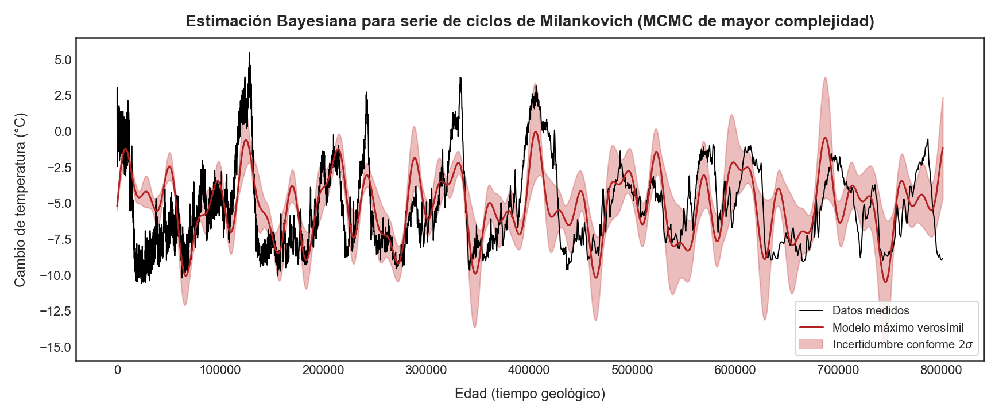

In [123]:
# Graficamos la comparativa versus el mejor modelo.
fig, ax = plt.subplots(figsize=(12, 5))
ax.plot(data["age"], data["temp_diff"], color="black", lw=1.0, label="Datos medidos")
ax.plot(data["age"], med_delta_T, color="firebrick", label="Modelo máximo verosímil")
ax.fill_between(
    x=data["age"], y1=med_delta_T + spread_delta_T, y2=med_delta_T - spread_delta_T,
    color="indianred", alpha=0.4, label="Incertidumbre conforme " + r"$2\sigma$",
)
ax.set_xlabel("Edad (tiempo geológico)", fontsize=12, labelpad=10)
ax.set_ylabel("Cambio de temperatura (°C)", fontsize=12, labelpad=10)
ax.set_title("Estimación Bayesiana para serie de ciclos de Milankovich (MCMC de mayor complejidad)", fontsize=14, fontweight="bold", pad=10)
ax.legend(loc="best", frameon=True, fontsize=10)
plt.tight_layout();

Notemos que el modelo esperado (correspondiente a la predicción "promedio" asociada a la distribución a posteriori muestreada) no es necesariamente el que se encuentra justo al medio de la banda de incertidumbre construida. Observamos además que el modelo presenta mayor incertidumbre en la segunda mitad de la señal, aún cuando es en esta porción del recorrido cuando obtiene los mejores resultados.

Una última visualización interesante que construiremos nos permitirá graficar las trayectorias que recorren los *walkers* durante la ejecución del algoritmo de muestreo, a fin de verificar las convergencias en cada caso. Tal ejercicio permite entender, entre otras cosas, cuál es el número ideal de iteraciones para cada número de *walkers* escogido por corrida.

Cada cadena de Markov puede extraerse por medio del método `get_chain()`, aplicado a nuestro `EnsembleSampler` (una vez corrido el muestreo MCMC). El resultado será un arreglo de **<font color='mediumorchid'>Corner</font>** de dimensión `(n_iter, n_walkers, n)`. Nuestro interés es crear una figura con un total de `n` paneles, sobre los cuales dibujaremos las trayectorias de cada *walker* para cada parámetro que deseamos estimar:

In [124]:
chains = sampler.get_chain()

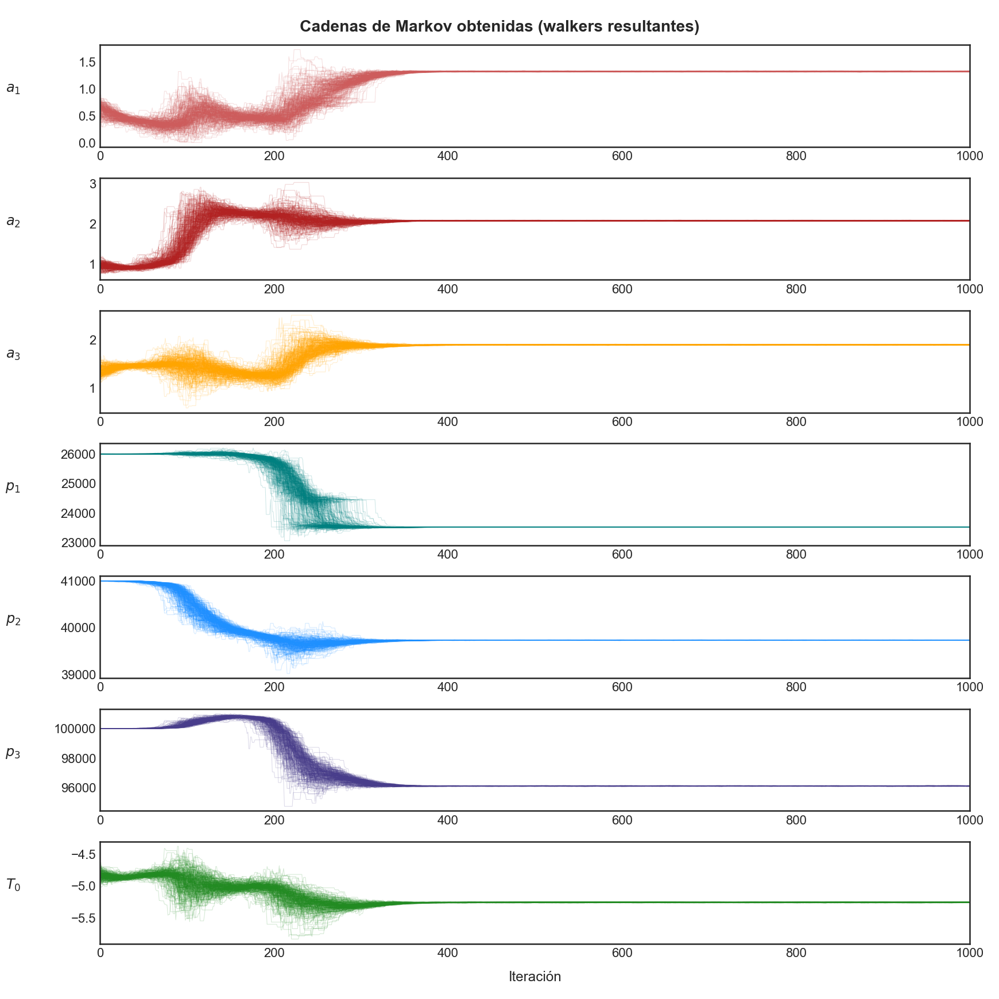

In [125]:
fig, ax = plt.subplots(figsize=(12, 12), nrows=n)
colors = ["indianred", "firebrick", "orange", "teal", "dodgerblue", "darkslateblue", "forestgreen"]
for k, color_k in zip(range(n), colors):
    ax[k].plot(chains[:, :, k], color=color_k, alpha=0.2, lw=0.5)
    ax[k].set_xlim(0, len(chains))
    ax[k].set_ylabel(labels[k], rotation=0, fontsize=12, labelpad=10)
    ax[k].yaxis.set_label_coords(-0.1, 0.5)
ax[-1].set_xlabel("Iteración", fontsize=12, labelpad=10)
fig.suptitle("Cadenas de Markov obtenidas (walkers resultantes)", fontsize=14, fontweight="bold")
plt.tight_layout();

Podemos observar que, para la iteración `400`, ya todos los *walkers* han convergido a un valor determinado. Los momentos de mayor incertidumbre se dan cerca las iteraciones `100` y `250`, porque en dichos entornos los *walkers* tienden a presentar una mayor variabilidad en sus posiciones. Sin embargo, cada *grumo* de alta variabilidad deriva en distribuciones marginales a posteriori multimodales, lo que evidentemente es un problema. Esto refuerza la tesis de que, probablemente, sea más factible probar otro modelo (linealizable), aunque eso se dejará como ejercicio al lector. ◼︎

El ejemplo anterior simplemente araña la superficie de todo un mundo asociado a las técnicas de modelamiento probabilístico, y usando una librería muy sencilla como lo es **<font color='mediumorchid'>Emcee</font>**. La librería **<font color='mediumorchid'>PyMC</font>** es muchísimo más rica en opciones, personalización y análisis de resultados, y nos ofrece diversas alternativas de construcción de modelos similares a las revisadas aquí. No obstante, ya nos hemos escapado demasiado del alcance de estos apuntes. Para quienes deseen satisfacer su curiosidad, siempre será posible recurrir a la [documentación](https://www.pymc.io/welcome.html) de **<font color='mediumorchid'>PyMC</font>**, que es muy completa y nos ofrece diversos ejemplos a fin de profundizar en estos temas.

## Modelos lineales generalizados.
Finalizaremos nuestro estudio de los modelos lineales de regresión introduciendo el concepto de **modelo lineal generalizado** (**GLM**, del inglés *generalized linear model*). Un GLM es, en esencia (y fiel a su nombre), una generalización *flexible* del modelo ordinario de regresión lineal que permite considerar variables de respuesta cuyas observaciones pueden describirse por medio de funciones de distribución que no necesariamente sean Gaussianas. Para ello, introducimos una **función de enlace** que relaciona el **valor esperado** de la variable de respuesta con las variables independientes que describen el conjunto de entrenamiento y, además, permitimos que la magnitud de la varianza en cada observación sea una función de su correspondiente predicción.

### Formulación.
Consideremos un conjunto de entrenamiento $\mathcal{D} =\left\{ \left( \mathbf{X} ,\mathbf{y} \right) :\mathbf{X} \in \mathbb{R}^{m\times n} \wedge \mathbf{y} \in \mathbb{R}^{m} \right\}$, donde $\mathbf{X}$ es la correspondiente matriz de diseño e $\mathbf{y}$ es el correspondiente vector de valores observados respecto del cual deseamos entrenar un modelo. Sea $\left( \mathbf{x}_{i} ,y_{i} \right) \in \mathbb{R}^{n+1}$ el par que representa la $i$-ésima instancia para $\mathbf{X}$ e $\mathbf{y}$. En un modelo lineal generalizado, asumimos que la observación $y_{i}$ es la realización de una variable aleatoria con una distribución pertenenciente a la **familia exponencial** (para un detalle completo de ésto, revisar la documentación de la [clase 1.5](https://github.com/rquezadac/udd_data_science_lectures/blob/main/PARTE%20I%20-%20Fundamentos%20matem%C3%A1ticos%20elementales/clase_1_5.ipynb) –definición (5.35)–) con media $\mu_{i}$, la cual se asume como una función (a menudo no lineal) de la combinación lineal $\mathbf{x}_{i}^{\top}\mathbf{w}$, donde $\mathbf{w}\in \mathbb{R}^{n}$ es un vector de parámetros que deseamos estimar. Es decir,

$$\mathrm{E} \left[ y_{i}|\mathbf{x}_{i} \right] =\mu_{i} =g\left( \mathbf{x}_{i}^{{}\top} \mathbf{w} \right)$$
<p style="text-align: right;">$(4.160)$</p>

La función $g$ se denomina **función de enlace** del modelo.

En esta formulación, reconocemos tres componentes principales en un GLM:

- **Componente aleatoria:** Una distribución que describe el rango completo de valores de $\mathbf{y}$. En el modelo de regresión lineal ordinario, dicha distribución es normal. Sin embargo, ahora consideraremos que todas las observaciones que conforman el vector $\mathbf{y}$ son realizaciones de una distribución perteneciente a una generalización de la familia exponencial (que incluye, por ejemplo, las distribuciones binomial, Poisson, gamma, entre otras). Esta es la única componente aleatoria del modelo; no incorporamos un término de ruido por separado.

- **Componente sistemática:** Es la combinación lineal de las variables independientes, que solemos expresar como $\eta_{i}= \mathbf{x}_{i}^{\top}\mathbf{w}$. Esta componente describe cómo las variables independientes que constituyen la matriz de diseño $\mathbf{X}$ se combinan linealmente mediante los parámetros que deseamos estimar. En las formulaciones clásicas, $\eta_{i}$ es llamado $i$-ésimo **predictor lineal** del modelo.

- **Función de enlace, $g$:** Especifica la relación entre las componentes aleatoria y sistemática del modelo lineal generalizado. Esta función indica cómo el valor esperado de la variable de respuesta se relaciona con la combinación lineal de las variables independientes.

### Distribución de probabilidad de la variable de respuesta.
Considerando la formulación (4.160), definimos una **familia exponencial sobredispersa** de distribuciones, parametrizada por $\mathbf{w}$ y $\tau$, como

$$f_{Y}\left( \mathbf{y} |\mathbf{w} ,\tau \right) =h\left( \mathbf{y} ,\tau \right) \exp \left( \frac{\mathbf{b} \left( \mathbf{w} \right)^{\top} \mathbf{T} \left( \mathbf{y} \right) -A\left( \mathbf{w} \right)}{d\left( \tau \right)} \right)$$
<p style="text-align: right;">$(4.161)$</p>

Donde $\tau$ es llamado **parámetro de dispersión** de la familia, y típicamente se relaciona con la varianza de la distribución correspondiente. Las funciones $h\left( \mathbf{y} ,\tau \right) ,\mathbf{b} \left( \mathbf{w} \right) ,\mathbf{T} \left( \mathbf{y} \right) ,A\left( \mathbf{w} \right)$ y $d(\tau)$ son conocidas. Observamos que la familia de distribuciones descrita por $f_{Y}$ es una generalización de la familia exponencial y, por tanto, incluye distribuciones como la Gaussiana, Poisson, binomial, exponencial, gamma, Bernoulli, multinomial y binomial negativa.

En la **regresión lineal ordinaria**, asumimos que cada instancia $y_{i}$ de la variable de respuesta proviene de una distribución Gaussiana con media $\mu_{i}$ y varianza constante $\sigma^{2}$. En la formulación (4.160), **la función de enlace es la función identidad**; es decir, $g(\mu_{i})= \mu_{i}$. Por lo tanto, conforme tal formulación, tenemos que

$$\mu_{i} =\mathrm{E} \left[ y_{i}|\mathbf{x}_{i} \right] =\mathbf{x}_{i}^{\top} \mathbf{w}$$
<p style="text-align: right;">$(4.162)$</p>

La distribución de probabilidad es, conforme la ecuación (4.161),

$$f_{Y}\left( y_{i}|\mathbf{w} ,\sigma^{2} \right) =\frac{1}{\sqrt{2\pi \sigma^{2}}} \exp \left( -\frac{\left( y_{i}-\mathbf{x}_{i}^{\top} \mathbf{w} \right)^{2}}{2\sigma^{2}} \right)$$
<p style="text-align: right;">$(4.163)$</p>

En este caso, notamos que el parámetro de dispersión $\tau$ es igual a $\sigma^{2}$ y es constante para todo $i=1,...,m$. La varianza de $f_{Y}$ es, en este caso, independiente de la media: $\mathrm{Var}(y_{i})=\sigma^{2}$.

**Ejemplo 4.24 – La regresión logística es un modelo lineal generalizado:** Sea el conjunto de entrenamiento $\mathcal{D} =\left\{ \left( \mathbf{X} ,\mathbf{y} \right) :\mathbf{X} \in \mathbb{R}^{m\times n} \wedge \mathbf{y} \in \mathbb{R}^{m} \right\}$, donde $\mathbf{X}$ es la correspondiente matriz de diseño e $\mathbf{y}$ es el correspondiente vector de valores observados respecto del cual deseamos entrenar un modelo. Sea $\left( \mathbf{x}_{i} ,y_{i} \right) \in \mathbb{R}^{n+1}$ el par que representa la $i$-ésima instancia para $\mathbf{X}$ e $\mathbf{y}$. Asumamos que $y_{i}$ únicamente puede tomar dos valores, codificados como $0$ y $1$, respectivamente. De esta manera, $y_{i}$ puede describirse por medio de una distribución binomial con probabilidad de éxito $p_{i}= P(y_{i}=1|\mathbf{x}_{i})$. Si la función de enlace se define como

$$g\left( \mu_{i} \right) =\log \left( \frac{\mu_{i}}{1-\mu_{i}} \right)$$
<p style="text-align: right;">$(4.164)$</p>

Entonces el predictor lineal $\eta_{i}= \mathbf{x}_{i}^{\top} \mathbf{w}$ queda descrito por

$$\eta_{i} =\mathbf{x}_{i}^{\top} \mathbf{w} =\log \left( \frac{p_{i}}{1-p_{i}} \right)$$
<p style="text-align: right;">$(4.165)$</p>

La función de enlace (4.162) es llamada **logit**. Despejando $p_{i}$,

$$\displaystyle \mathbf{x}_{i}^{\top} \mathbf{w} =\log \left( \frac{p_{i}}{1-p_{i}} \right) \  \Longleftrightarrow \  p_{i}=\frac{1}{\exp \left( -\mathbf{x}_{i}^{\top} \mathbf{w} \right) +1}$$
<p style="text-align: right;">$(4.165)$</p>

Conforme la ecuación (4.161), la distribución de probabilidad para $y_{i}$ es, por tanto,

$$f_{Y}\left( y_{i}|\mathbf{w} \right) =p_{i}^{y_{i}}\left( 1-p_{i} \right)^{1-p_{i}}$$
<p style="text-align: right;">$(4.166)$</p>

Notemos que, en este caso, el parámetro de dispersión es $\tau = 1$, ya que la varianza está determinada por la media $\mu_{i}$ como $\mathrm{Var}(y_{i})= \mu_{i}(1- \mu_{i})$. La última línea de la expresión (4.165) toma explícitamente la forma de un modelo de regresión logística binaria, donde la estimación $p_{i}$ de $y_{i}$ es continua y *reside* en el intervalo $(0, 1)$, a pesar de que $y_{i}\in \left\{ 0,1 \right\}$. Hemos llegado pues a un importante resultado: **La regresión logística binaria es un caso particular de modelo lineal generalizado, en el cual la variable de respuesta es asumida como la realización de una distribución binomial con probabilidad $p_{i}$, y con varianza dependiente de la media**.

Supongamos ahora que la variable de respuesta puede tomar uno de $k$ valores discretos, digamos $y_{i}\in \left\{ 1,2,...,k \right\}$, que denominamos **clases** o **categorías**. Por lo tanto, $y_{i}$ puede describirse por medio de la probabilidad $p_{is}=P\left( y_{i}=s|\mathbf{x}_{i} \right)$, donde $1\leq s\leq k$, donde $p_{is}$ es la probabilidad de que $y_{i}$ sea igual a la $s$-ésima clase o categoría. Si usamos la **función softmax** para modelar la probabilidad $p_{is}$, entonces tendremos que

$$p_{is}=\frac{\exp \left( \eta_{is} \right)}{\sum\nolimits_{r=1}^{k} \exp \left( \eta_{ir} \right)}$$
<p style="text-align: right;">$(4.167)$</p>

Donde $\eta_{is} =\mathbf{x}_{i}^{\top} \mathbf{w}_{s}$ es el predictor lineal para la clase $s$, siendo $\mathbf{w}_{s}$ el vector de parámetros asociado a dicha clase. Notemos que, en esta formulación, si añadimos cualquier constante (digamos $c$) a todos los predictores lineales $\eta_{is}$, entonces las probabilidad $p_{is}$ permanecerán invariantes, ya que

$$p_{is}=\frac{\exp \left( \eta_{is} +c \right)}{\sum\nolimits_{r=1}^{k} \exp \left( \eta_{ir} +c \right)} =\frac{\exp \left( \eta_{is} \right) \exp \left( c \right)}{\sum\nolimits_{r=1}^{k} \exp \left( \eta_{ir} \right) \exp \left( c \right)} =\frac{\exp \left( \eta_{is} \right)}{\sum\nolimits_{r=1}^{k} \exp \left( \eta_{ir} \right)}$$
<p style="text-align: right;">$(4.168)$</p>

Por tanto, hay infinitas combinaciones de los parámetros $\mathbf{w}_{s}$ que generan las mismas probabilidad $p_{is}$ y que difieren en una constante, lo que, en estricto rigor, deriva en que es imposible identificar de manera única los parámetros basándonos únicamente en los datos del conjunto que describen al conjunto de entrenamiento. Este fenómeno se conoce como **problema de indentificabilidad**.

Para resolver este problema, es común restringir una de las clases del modelo, fijándola a un **valor de referencia**, típicamente nulo. Por ejemplo si escogemos la clase $k$ como referencia, podemos escribir $\mathbf{w}_{k}=\mathbf{0}$, lo que implicará que $\eta_{ik}=0$ para todo $i=1,...,m$. De esta manera, los predictores lineales para el resto de las clases podrán interpretarse con respecto a esta clase de referencia, porque habrá una única manera de expresar las probabilidad $p_{is}$ en función de los vectores de parámetros $\mathbf{w}_{s}$.

Fijada pues $k$ como la clase de referencia, y agrupando todas las probabilidades $p_{is}$ en el vector $\mathbf{p}_{i}\in \mathbb{R}^{k}$, podemos describir a $y_{i}$ como la realización de una distribución multinomial con un único ensayo (denominada también como distribución de Bernoulli generalizada), tal que

$$f_{Y}\left( y_{i}|\mathbf{p}_{i} \right) =\prod_{r=1}^{k} p_{ir}^{y_{ir}}$$
<p style="text-align: right;">$(4.169)$</p>

En la formulación (4.169), es posible demostrar que el parámetro de dispersión es, nuevamente, $\tau=1$, estando la varianza y covarianza determinadas unívocamente por las probabilidades agrupadas en el vector $\mathbf{p}_{i}$ (se deja como ejercicio demostrar que $\mathrm{Var} \left( y_{is} \right) =p_{is}\left( 1-p_{is} \right) \wedge \mathrm{Cov} \left( y_{ir},y_{is} \right) =-p_{ir}p_{is}$, para $r\neq s$). Notemos que **la expresión final para (4.168) toma la forma de un modelo de regresión logística multinomial y, por tanto, concluimos que este modelo es también un caso particular de modelo lineal generalizado**. Esto pone de manifiesto algo extremadamente interesante: La [clase 2.3](https://github.com/rquezadac/udd_data_science_lectures/blob/main/PARTE%20II%20-%20Modelos%20de%20aprendizaje%20supervisado/clase_2_3.ipynb) fue simplemente un estudio muy detallado de un caso particular de GLM, y que podríamos haber *jurado* que resultaba extremadamente novedoso. La verdad es que, para efectos prácticos, lo fue. **Y este resultado simplemente refuerza la enorme importancia del modelo de regresión lineal (y su generalización) en el campo del aprendizaje automático** como la base esencial de muchísimos desarrollos de gran poder predictivo. ◼︎

### El modelo de Poisson.
El último modelo lineal generalizado que revisaremos, y al que le dedicaremos una sección especial por su gran utilidad, es el llamado **modelo de regresión de Poisson**. Este modelo resulta de considerar una variable de respuesta discreta, la cual suele representar un conteo de eventos de interés. De este modo, $y_{i}\in \left\{ 0,1,2,... \right\}$, por lo que cada observación de la variable de respuesta puede ser considerada como la realización de una variable aleatoria con distribución de Poisson de parámetro $\lambda_{i}$. Es decir,

$$f_{Y}\left( y_{i}|\lambda_{i} \right) =\frac{\lambda_{i}^{y_{i}} \exp \left( -\lambda_{i} \right)}{y_{i}!}$$
<p style="text-align: right;">$(4.170)$</p>

Conforme la formulación (4.160), emplearemos una función de enlace de tipo logarítmica, tal que

$$g(\mu_{i})= \log(\mu_{i})$$
<p style="text-align: right;">$(4.171)$</p>

Por lo tanto, el modelo de regresión resultante puede escribirse como

$$\log \left( \lambda_{i} \right) =\mathbf{x}_{i}^{\top} \mathbf{w}$$
<p style="text-align: right;">$(4.172)$</p>

De esta manera, dado un vector de parámetros $\mathbf{w}$ estimado para un modelo de regresión de Poisson y una instancia $\mathbf{x}_{i}$ de datos de entrada, entonces el valor medio predicho para la distribución de Poisson ilustrada en la expresión (4.170) estará dado por $\lambda_{i}=\exp(\mathbf{x}_{i}^{\top} \mathbf{w})$. Si las $m$ observaciones $y_{1},...,y_{m}$ son independientes, entonces es posible estimar los valores de $\mathbf{w}$ por medio del método de máxima verosimilitud. Sin embargo, a diferencia de la regresión lineal ordinaria, el estimador resultante no tiene una forma algebraicamente cerrada, lo que implica que la resolución del problema inherente al modelo de Poisson requiere de métodos numéricos de optimización. Esto es algo que mostraremos en el siguiente ejemplo.

**Ejemplo 4.25 – El estimador máximo verosímil para el modelo de Poisson:** Sea $\mathcal{D} =\left\{ \mathbf{X} ,\mathbf{y} :\mathbf{X} \in \mathbb{R}^{m\times n} \wedge \mathbb{R}^{m} \right\}$ un conjunto de entrenamiento caracterizado por la matriz de diseño $\mathbf{X}$ y el vector de valores observados $\mathbf{y}$. Sea $\mathbf{x}_{i}$ una instancia (fila) de $\mathbf{X}$. Dado un vector de parámetros $\mathbf{w}\in \mathbb{R}^{n}$, el valor esperado (o media) de la distribución de Poisson asociada a la instancia $y_{i}$ es, conforme la ecuación (4.172),

$$\lambda_{i} =\mathrm{E} \left[ y_{i}|\mathbf{x}_{i} \right] =\exp \left( \mathbf{x}_{i}^{\top} \mathbf{w} \right)$$
<p style="text-align: right;">$(4.173)$</p>

La función de probabilidad para dicha instancia, dado el correspondiente parámetro $\lambda_{i}$, es

$$P\left( y_{i}|\lambda_{i} \right) =\frac{\lambda_{i}^{y_{i}}}{y_{i}!} \exp \left( -\lambda_{i} \right)$$
<p style="text-align: right;">$(4.174)$</p>

Asumiendo que todas las observaciones que comprenden el vector $\mathbf{y}$ son independientes, podemos escribir la función de verosimilitud conjunta para el vector $\mathbf{w}$ como

$$\begin{array}{lll}L\left( \mathbf{w} \right)&=&\displaystyle \prod_{i=1}^{m} P\left( y_{i}|\lambda_{i} \right)\\ &=&\displaystyle \prod_{i=1}^{m} \frac{\lambda_{i}^{y_{i}}}{y_{i}!} \exp \left( -\lambda_{i} \right)\end{array}$$
<p style="text-align: right;">$(4.175)$</p>

Como en el caso del modelo de regresión lineal ordinario, es mucho más sencillo trabajar con el logaritmo de la función (4.175), a fin de no lidiar con series de productos. De esta manera, tenemos que

$$\begin{array}{lll}LL\left( \mathbf{w} \right)&=&\displaystyle \log \left( \prod_{i=1}^{m} \frac{\lambda_{i}^{y_{i}}}{y_{i}!} \exp \left( -\lambda_{i} \right) \right)\\ &=&\displaystyle \sum_{i=1}^{m} \log \left( \frac{\lambda_{i}^{y_{i}}}{y_{i}!} \exp \left( -\lambda_{i} \right) \right)\\ &=&\displaystyle \sum_{i=1}^{m} \left( \log \left( \lambda_{i}^{y_{i}} \exp \left( -\lambda_{i} \right) -\log \left( y_{i}! \right) \right) \right)\\ &=&\displaystyle \sum_{i=1}^{m} \left( \log \left( \lambda_{i}^{y_{i}} \right) -\log \left( \exp \left( \lambda_{i} \right) \right) -\log \left( y_{i}! \right) \right)\\ &=&\displaystyle \sum_{i=1}^{m} \left( y_{i}\log \left( \lambda_{i} \right) -\lambda_{i} -\log \left( y_{i}! \right) \right)\end{array}$$
<p style="text-align: right;">$(4.176)$</p>

Reemplazando (4.173) en la última línea de la expresión (4.176), obtenemos

$$LL\left( \mathbf{w} \right) =\sum_{i=1}^{m} \left( y_{i}\left( \mathbf{x}_{i}^{\top} \mathbf{w} \right) -\exp \left( \mathbf{x}_{i}^{\top} \mathbf{w} \right) \right) +\mathrm{constante}$$
<p style="text-align: right;">$(4.177)$</p>

Donde la constante es el resultado de la suma de términos dependientes de $\log(y_{i}!)$. De esta manera, ya sólo nos resta calcular el gradiente de la expresión (4.177) e igualar el vector resultante a $\mathbf{0}$, a fin de estimar los parámetros que constituyen el vector $\mathbf{w}$. Por lo tanto,

$$\begin{array}{lll}\nabla_{\mathbf{w}} LL\left( \mathbf{w} \right)&=&\displaystyle \frac{\partial}{\partial \mathbf{w}} \left( \sum_{i=1}^{m} \left( y_{i}\left( \mathbf{x}_{i}^{\top} \mathbf{w} \right) -\exp \left( \mathbf{x}_{i}^{\top} \mathbf{w} \right) \right) \right)\\ &=&\displaystyle \sum_{i=1}^{m} \left( y_{i}\mathbf{x}_{i} -\underbrace{\exp \left( \mathbf{x}_{i}^{\top} \mathbf{w} \right)}_{=\lambda_{i}} \mathbf{x}_{i} \right)\\ &=&\displaystyle \sum_{i=1}^{m} \mathbf{x}_{i} \left( y_{i}-\lambda_{i} \right)\\ &=&\displaystyle \mathbf{X}^{\top} \left( \mathbf{y} -\mathbf{\lambda} \right)\end{array}$$
<p style="text-align: right;">$(4.178)$</p>

Luego,

$$\mathbf{X}^{\top} \left( \mathbf{y} -\mathbf{\lambda} \right) =\mathbf{0}$$
<p style="text-align: right;">$(4.179)$</p>

Donde $\mathbf{\lambda}=(\lambda_{1},...,\lambda_{m})^{\top}$. La expresión (4.179) es llamada **ecuación normal** para $\mathbf{w}$, en el contexto de la regresión de Poisson.

La ecuación normal es no lineal en $\mathbf{w}$ debido a la dependencia exponencial en $\lambda_{i}$, para todo $i=1,...,m$. Por lo tanto, no es posible obtener una solución alegbraicamente cerrada para (4.179). En su lugar, es común la utilización de métodos numéricos de resolución, tales como el algoritmo de Newton-Raphson. Daremos pues por terminado este ejercicio, aunque se deja la tarea al lector para elaborar una rutina que permita resolver iterativamente la ecuación normal (4.179). ◼︎

Los parámetros $w_{1},...,w_{n}$ en el modelo de Poisson (4.172) representan una especie de **efecto logarítmico** sobre el valor esperado de la variable de respuesta. En particular, nos informan de la razón de cambio del logaritmo de la media esperada $\lambda_{i}$ para la observación $i$ ante un cambio incremental en el valor $x_{ij}$ la variable independiente $j$ ($j=1,...,n$), manteniendo fijas el resto de las variables.

En efecto, descomponiendo el modelo de Poisson para una instancia $i$, obtenemos

$$\log \left( \lambda_{i} \right) =w_{1}x_{i1}+\cdots +w_{n}x_{in}$$
<p style="text-align: right;">$(4.180)$</p>

Calculando la derivada parcial de $\log(\lambda_{i})$ con respecto a $x_{ij}$, nos da

$$\frac{\partial}{\partial x_{ij}} \left( \log \left( \lambda_{i} \right) \right) =w_{j}$$
<p style="text-align: right;">$(4.181)$</p>

Es decir, $w_{j}$ es la razón de cambio en $\log(\lambda_{i})$ por cada unidad incremental de $x_{ij}$. Si escribimos explícitamente este cambio como $\triangle x_{ij}$, entonces la nueva media esperada será

$$\lambda_{i}^{\prime} =\exp \left( \mathbf{x}_{i}^{\top} \mathbf{w} +w_{j}\triangle x_{ij} \right) =\lambda_{i} \exp \left( w_{j}\triangle x_{ij} \right)$$
<p style="text-align: right;">$(4.182)$</p>

Suponiendo que todas las variables comparten el mismo orden de magnitud (digamos, la misma escala), podemos asumir que un cambio unitario puede representarse por medio de $\triangle x_{ij}= 1$, con lo cual, reemplazando en la ecuación (4.182), obtenemos

$$\lambda_{i}^{\prime} =\lambda_{i} \exp \left( w_{j} \right)$$
<p style="text-align: right;">$(4.183)$</p>

Por lo tanto, podemos concluir que:

- $\exp \left( w_{j} \right)$ es el factor multiplicativo en la media esperada $\lambda_{i}$ resultante de un cambio incremental o unitario en $x_{ij}$.
- Si $w_{j}> 0$, la media esperada aumenta.
- Si $w_{j}< 0$, la media esperada disminuye.

De esta manera, los parámetros que caracterizan el modelo de regresión de Poisson tienen una interpretación directa y útil en términos de cómo las variables predictoras afectan multiplicativamente la media esperada de la variable de respuesta. El efecto, por supuesto, es exponencial, con un impacto que tiene el mismo signo que el parámetro respectivo.

Previo a revisar algunos ejemplos prácticos de implementación del modelo de Poisson en **<font color='mediumorchid'>Scikit-Learn</font>**, dejamos un cuadro resumen en la Tabla (4.2) que sumariza los modelos lineales generalizados que hemos revisado en esta sección, incluyendo los que hemos ejemplificado de manera puramente práctica.

<p style="text-align: center;">Tabla (4.2): Cuadro comparativo entre algunos modelos lineales generalizados</p>

| Modelo | Componente aleatoria | Componente sistemática | Función de enlace | Función de enlace inversa | Dominio | Casos de uso |
| :----- | :------------------- | :--------------------- | :---------------- | :------------------------ | :------ | :----------- |
| Regresión lineal | $y_{i}\sim \mathcal{N} \left( \mu ,\sigma^{2} \right)$ | $\eta_{i} =\mathbf{x}_{i}^{\top} \mathbf{w}$ | Identidad: $g\left( \mu_{i} \right) =\mu_{i}$ | Identidad: $\mu_{i} =\eta_{i}$ | $\mu_{i} \in \mathbb{R}$ | Predicción de valores continuos (tratamiento de mineral, recuperación metalúrgica, etc.). |
| Regresión logística binaria | $y_{i}\sim \mathcal{B} \left( p_{i} \right)$ | $\eta_{i} =\mathbf{x}_{i}^{\top} \mathbf{w}$ | Logit: $g\left( p_{i} \right) =\log \left( \frac{p_{i}}{1-p_{i}} \right)$ | Logística: $p_{i}=\frac{1}{1+\exp \left( -\eta_{i} \right)}$ | $0< p_{i}< 1$ | Clasificación binaria (detección de spam, probabilidades de daño en un macizo rocoso, fallas en un sistema de fabricación de piezas, etc.). |
| Regresión logística multinomial | $y_{i}\sim \mathcal{M} \left( 1;p_{i1},...,p_{ik} \right)$ | $\eta_{ik} =\mathbf{x}_{i}^{\top} \mathbf{w}_{k}$ | Logit generalizada: $g\left( \mu_{is} \right) =\log \left( \frac{\mu_{is}}{\mu_{ik}} \right)$, donde $k$ es una clase de referencia. | Softmax: $p_{is}=\frac{\exp \left( \eta_{is} \right)}{\sum\nolimits_{j=1}^{k} \exp \left( \eta_{ij} \right)}$, donde $s$ es la clase de interés. | $0< p_{is}< 1$ | Clasificación multinomial (reconocimiento de imágenes o texto). |
| Regresión de Poisson | $y_{i}\sim \mathcal{P} \left( \lambda_{i} \right)$ | $\eta_{i} =\mathbf{x}_{i}^{\top} \mathbf{w}$ | Logarítmica: $g\left( \lambda_{i} \right) =\log \left( \lambda_{i} \right)$ | Exponencial: $\lambda_{i} =\exp \left( \eta_{i} \right)$ | $\lambda_{i}>0$ | Modelamiento de cuantías de eventos o incidencias de casos de interés. |

En las componentes aleatorias especificadas en la Tabla (4.2), se tiene que (en los contextos estudiados para cada caso):

- $\mathcal{N}(\mu, \sigma^{2})$ es una distribución normal de media $\mu$ y desviación estándar $\sigma$.
- $\mathcal{B}(p_{i})$ es una distribución de Bernoulli de parámetro $p_{i}$.
- $\mathcal{M}(1;p_{i1},...,p_{ik})$ es una distribución multinomial con probabilidades $p_{i1},...,p_{ik}$, para cada clase $1,...,k$.
- $\mathcal{P}(\lambda_{i})$ es una distribución de Poisson de parámetro $\lambda_{i}$.

**Ejemplo 4.26 – Implementación del modelo de Poisson en <font color='mediumorchid'>Scikit-Learn</font>:** La implementación de la regresión de Poisson en **<font color='mediumorchid'>Scikit-Learn</font>** es directa, y se realiza por medio de la clase `PoissonRegressor`, cuya dependencia es `sklearn.linear_model`. Para ilustrar su uso, mostraremos el desarrollo de un ejercicio que puede revisarse en detalle en la [documentación de **<font color='mediumorchid'>Scikit-Learn</font>**](https://scikit-learn.org/stable/auto_examples/linear_model/plot_poisson_regression_non_normal_loss.html#sphx-glr-auto-examples-linear-model-plot-poisson-regression-non-normal-loss-py), y que hace uso de un dataset conocido en muchísimos frameworks de aprendizaje automático como **<font color='forestgreen'>freMTPL2freq</font>** (acrónimo –o algo así– de *french motor third-party liability claims*), y que está disponible por medio de la plataforma de [OpenML](https://www.openml.org/search?type=data&sort=runs&id=41214&status=active). En **<font color='mediumorchid'>Scikit-Learn</font>**, podemos descargar este dataset por medio de la función `fetch_openml()` como sigue:

In [126]:
from sklearn.datasets import fetch_openml

In [127]:
# Descargamos el dataset freMTPL2freq.
dataset = fetch_openml(data_id=41214, as_frame=True)

In [128]:
# Mostramos la documentación de este dataset.
print(dataset["DESCR"])

The dataset freMTPL2freq contains risk features for 677,991 motor third-part liability policies (observed mostly on one year). See https://github.com/dutangc/CASdatasets for more details. The dataset is associated with 'Computational Actuarial Science with R' edited by Arthur Charpentier, CRC, 2018.

Downloaded from openml.org.


Este conjunto de datos comprende una serie de variables relativas a riesgos para un total de 677.991 pólizas de responsabilidad civil de terceros para vehículos de motor, observadas durante un período aproximado de un año. No se trata de un dataset especialmente minero, pero es perfecto para comprender la implementación de un modelo cuyo objetivo es estimar cuantías de eventos o incidencias. Para darle un contexto más robusto a este ejercicio, ilustraremos algunas definiciones previas:

- Una **póliza** es un contrato entre una compañía de seguros y un sujeto o individuo, denominado **tenedor** o **asegurado** (en inglés, *policyholder*).
- Una **reclamación** o **demanda** es un requerimiento realizado por un asegurado a la compañía para obtener una compensación por una pérdida cubiera por el seguro correspondiente.
- La **exposición** es la duración de la cobertura de una póliza de seguros, normalmente medida en años.
- La **frecuencia de demandas** es el número de demandas por unidad de exposición.

En el conjunto de datos **<font color='forestgreen'>freMTPL2freq</font>**, cada instancia corresponde a una póliza de seguros asociada a una determinada compañía aseguadora de automóviles. Algunas de las variables independientes contemplan la edad del conductor, la edad del vehículo, la potencia del vehículo, entre otras. Nuestro objetivo es predecir la frecuencia esperada de demandas que siguen a accidentes vehiculares para un nuevo asegurado, dados los datos históricos para una población de asegurados *observados*.

Partimos pues observado las primeras filas de nuestro conjunto de datos:

In [129]:
# Extraemos el dataset e imprimimos en pantalla sus primeras 5 filas.
df = dataset["frame"]
df.head()

,IDpol,ClaimNb,Exposure,Area,VehPower,VehAge,DrivAge,BonusMalus,VehBrand,VehGas,Density,Region
0,1.0,1,0.10,D,5,0,55,50,B12,'Regular',1217,R82
1,3.0,1,0.77,D,5,0,55,50,B12,'Regular',1217,R82
2,5.0,1,0.75,B,6,2,52,50,B12,'Diesel',54,R22
3,10.0,1,0.09,B,7,0,46,50,B12,'Diesel',76,R72
4,11.0,1,0.84,B,7,0,46,50,B12,'Diesel',76,R72


Las variables que nos interesan son `"ClaimNb"` y `"Exposure"`, que corresponden al número de demandas y a la exposición de cada póliza instanciada en este conjunto de datos. Naturalmente, debido a que estamos interesados en estimar una frecuencia de demandas por unidad de exposición, es necesario igualmente construir esa nueva variable por medio de una simple división de las columnas anteriormente descritas:

In [130]:
# Calculamos la frecuencia de demandas por tiempo de duración de cada póliza.
df["Frequency"] = df["ClaimNb"] / df["Exposure"]

Ahora, visualizamos estas variables:

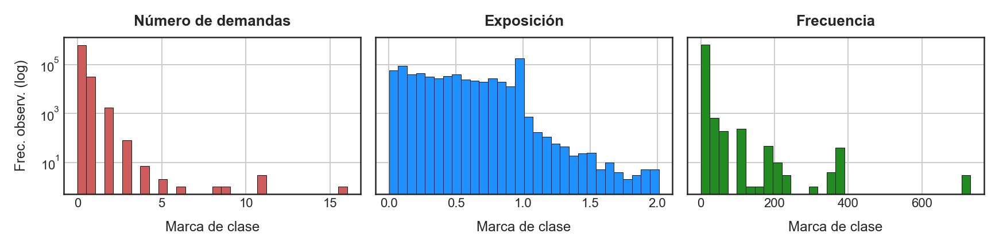

In [131]:
# Histogramas de frecuencias para las variables de interés.
fig, ax = plt.subplots(figsize=(12, 3), ncols=3, sharey=True)

ax[0].hist(df["ClaimNb"], bins=30, color="indianred", ec="k", log=True, lw=0.5)
ax[1].hist(df["Exposure"], bins=30, color="dodgerblue", ec="k", log=True, lw=0.5)
ax[2].hist(df["Frequency"], bins=30, color="forestgreen", ec="k", log=True, lw=0.5)

ax[0].set_title("Número de demandas", fontsize=13, fontweight="bold", pad=10)
ax[1].set_title("Exposición", fontsize=13, fontweight="bold", pad=10)
ax[2].set_title("Frecuencia", fontsize=13, fontweight="bold", pad=10)

ax[0].set_ylabel("Frec. observ. (log)", fontsize=12, labelpad=10)

for j in range(ax.shape[0]):
    ax[j].set_xlabel("Marca de clase", fontsize=12, labelpad=10)
    ax[j].grid(True)

plt.tight_layout();

El resto de las columnas del DataFrame serán utilizadas para construir nuestro modelo y predecir los valores de `"Frequency"` propiamente tales. Para ello, inspeccionaremos el DataFrame en su totalidad, a fin de verificar si es necesario implementar un determinado preprocesamiento de datos no numéricos:

In [132]:
# Inspeccionamos globalmente el DataFrame.
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 678013 entries, 0 to 678012
Data columns (total 13 columns):
 #   Column      Non-Null Count   Dtype   
---  ------      --------------   -----   
 0   IDpol       678013 non-null  float64 
 1   ClaimNb     678013 non-null  int64   
 2   Exposure    678013 non-null  float64 
 3   Area        678013 non-null  category
 4   VehPower    678013 non-null  int64   
 5   VehAge      678013 non-null  int64   
 6   DrivAge     678013 non-null  int64   
 7   BonusMalus  678013 non-null  int64   
 8   VehBrand    678013 non-null  category
 9   VehGas      678013 non-null  object  
 10  Density     678013 non-null  int64   
 11  Region      678013 non-null  category
 12  Frequency   678013 non-null  float64 
dtypes: category(3), float64(3), int64(6), object(1)
memory usage: 53.7+ MB


Si bien no se observan registros vacíos (`NaN`), sí vemos que las variables *independientes* a utilizar para construir nuestro modelo constituyen varios tipos de datos, ya sea números de punto flotante, enteros, categóricos e, incluso, strings. Por esta razón, es necesario aplicar algunas técnicas de preprocesamiento que implicarán varias transformaciones de variables (*featurization*), y que aglutinaremos en una gran pipeline que bautizaremos como `featurization_pipe`. Nos valdremos de la clase `ColumnTransformer` (cuya dependencia es `sklearn.compose`) para aplicar estas transformaciones en determinadas columnas de nuestro DataFrame de forma separada.

La pipeline de preprocesamiento contemplará las siguientes transformaciones:

- Las columnas `"VehAge"` y `"DrivAge"` (que representan las edades de los correspondientes vehículos y sus conductores, y son de tipo entero) serán discretizadas en intervalos de tamaño `10` (años) de forma similar a lo que realizamos al construir histogramas, fijando la correspondiente semilla aleatoria a fin de garantizar la reproducibilidad de los resultados. Para ello, se hará uso de un transformador denominado `KBinsDiscretizer`. Denominaremos tal transformación simplemente como `"binned_numeric"`.
- Las columnas `"VehBrand"`, `"VehGas"`, `"VehPower"`, `"Region"` y `"Area"` serán binarizadas en un esquema de tipo *one-hot* por medio del transformador `OneHotEncoder`.
- A la columna `"Density"` (que representa la densidad de habitantes por kilómetro cuadrado en la región donde vive el correspondiente conductor) se le aplicará una transformación logarítmica compuesta, la que incluirá una normalización a fin de eliminar problemas de órdenes de magnitud típicos en las variables de tipo numéricas. Tal transformación se realizará por medio de una *sub-pipeline* que denominaremos `log_scale_transformer`, donde aplicaremos la transformación usando la clase `FunctionTransformer` (la que permite aplicar transformaciones funcionales arbitrarias), con respecto a la función `numpy.log()`. La normalización se implementará de manera regular en la misma sub-pipeline, haciendo uso de la clase `StandardScaler`.
- A la columna `"BonusMalus"` (que representa una relación de riesgo para el asegurado dependiendo de su historial de demandas) no se le aplicará ninguna transformación. Para ello, simplemente se utilizarán identificadores propios del objeto `ColumnTransformer` que nos servirán para especificar tal acción en un esquema de tupla del tipo `(nombre_del_transformador, tipo_de_transformador, columna_de_interes)`: De esta manera, el nombre del transformador será `"passthrough_numeric"`, y simplemente indicará que no haremos ninguna cosa sobre esta variable, que es numérica. El tipo de transformador se especificará por medio de un identificador llamado `"passthrough"`, que indica a **<font color='mediumorchid'>Scikit-Learn</font>** que no se aplicará ninguna transformación sobre la columna individualizada. Finalmente, la columna de interés será, naturalmente, `"BonusMalus"`.

Todo el trabajo descrito se muestra en los siguientes bloques de código:

In [133]:
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import (
    FunctionTransformer,
    KBinsDiscretizer,
    OneHotEncoder,
    StandardScaler,
)

In [134]:
# Creamos la sub-pipeline para generar transformaciones logarítmicas normalizadas.
log_scale_transformer = make_pipeline(
    FunctionTransformer(func=np.log, validate=False), 
    StandardScaler(),
)

In [135]:
# Y ahora creamos nuestra pipeline de pre-procesamiento.
featurization_pipe = ColumnTransformer(
    [
        # Sobre la columna "BonusMalus":
        (
            "passthrough_numeric",
            "passthrough",
            ["BonusMalus"],
        ),
        # Sobre las columnas "DrivAge" y "VehAge":
        (
            "binned_numeric",
            KBinsDiscretizer(n_bins=10, random_state=42),
            ["DrivAge", "VehAge"],
        ),
        # Sobre la columna "Density":
        (
            "log_scaled_numeric",
            log_scale_transformer,
            ["Density"],
        ),
        # Sobre las columnas "VehBrand", "VehGas", "VehPower", "Region" y "Area":
        (
            "onehot_categorical",
            OneHotEncoder(),
            ["VehBrand", "VehPower", "VehGas", "Region", "Area"]
        ),
    ],
    # Descartamos el resto de las columnas.
    remainder="drop",
)

Previo a implementar la pipeline anterior, examinemos la respuesta de interés. Queremos entender si la proporción de instancias (pólizas) con reclamaciones es significativamente alta. En un principio, asumimos que no, y por eso construimos histogramas en unidades logarítmicas. Pero vale la pena entender la proporción real de instancias de interés en el conjunto de datos completo:

In [136]:
# Calculamos la fracción de tiempo de duración de pólizas con respecto a las reclamaciones.
claims_fraction = df.loc[df["ClaimNb"] == 0, "Exposure"].sum() / df["Exposure"].sum()

In [137]:
# Mostramos el resultado en pantalla.
print(f"Proporción de exposición con cero reclamaciones = {round(claims_fraction * 100, 2)} %")

Proporción de exposición con cero reclamaciones = 93.9 %


Es decir, más del 93% de los tenedores tienen cero reclamaciones. Por supuesto, si quisiéramos convertir este problema en uno de clasificación, binarizando esta variable en términos de la existencia o no de demandas a las correspondientes aseguradoras, el resultado sería un conjunto de datos extremadamente poco balanceado. Un modelo de clasificación *tonto* (o *"dummy"*, como suele llamarse en términos más elegantes) podría, basándose únicamente en las predicciones del valor medio de la variable de respuesta, tener una exactitud del 93% fácilmente, lo que nos aleja del objetivo de interés. Sin embargo, se trata de una línea base razonable para, desde ahí, empezar a construir un modelo verdaderamente efectivo. En **<font color='mediumorchid'>Scikit-Learn</font>**, es posible *entrenar* un modelo de regresión de tipo *dummy* por medio de la clase `DummyRegressor` (cuya dependencia es `sklearn.dummy`), que consistentemente retornará el valor medio de la variable de respuesta:

In [138]:
from sklearn.dummy import DummyRegressor

Debido a que no importa el orden de las instancias en nuestro conjunto de datos, podemos realizar cualquier tipo de separación para construir los correspondientes conjuntos de entrenamiento y de prueba. En estricto rigor, el procedimiento estándar debiese estar basado en un muestreo estratificado, a fin de asegurar representatividad, pero seremos fieles a la documentación de **<font color='mediumorchid'>Scikit-Learn</font>** y generaremos un muestreo aleatorizado sencillo, dejando un tercio de los datos como conjunto de prueba:

In [139]:
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline

In [140]:
# Construimos los conjuntos de entrenamiento y de prueba.
train_set, test_set = train_test_split(df, test_size=0.33, random_state=42)

Y ya "entrenamos" nuestro modelo *tonto* para usarlo como línea base:

In [141]:
# Instanciamos nuestro modelo "tonto".
dummy_model = Pipeline(
    [
        ("featurization", featurization_pipe),
        ("regressor", DummyRegressor(strategy="mean")),
    ],
)

In [142]:
# Y luego lo "entrenamos".
dummy_model.fit(train_set, train_set["Frequency"], regressor__sample_weight=train_set["Exposure"])

Pipeline(steps=[('featurization',
                 ColumnTransformer(transformers=[('passthrough_numeric',
                                                  'passthrough',
                                                  ['BonusMalus']),
                                                 ('binned_numeric',
                                                  KBinsDiscretizer(n_bins=10,
                                                                   random_state=42),
                                                  ['DrivAge', 'VehAge']),
                                                 ('log_scaled_numeric',
                                                  Pipeline(steps=[('functiontransformer',
                                                                   FunctionTransformer(func=<ufunc 'log'>)),
                                                                  ('standardscaler',
                                                                   StandardScaler())]),
                                                  ['Density']),
                                                 ('onehot_categorical',
                                                  OneHotEncoder(),
                                                  ['VehBrand', 'VehPower',
                                                   'VehGas', 'Region',
                                                   'Area'])])),
                ('regressor', DummyRegressor())])

Para chequear la *potencia* de esta línea base, usaremos tres métricas de desempeño. Dos de ellas son ya conocidas (MSE y MAE). La tercera es llamada **desviación media de Poisson**, y nos permite saber cuán desviada está una distribución (observada) de Poisson con respecto a su media (también observada). Si la distribución de Poisson de interés tiene parámetro $\lambda$, entonces dicha desviación (comúnmente denotada como $D$) se calcula como $D=\mathrm{E} \left[ \left| X-\lambda \right| \right]$, donde $X$ es una variable aleatoria de Poisson (y que comúnmente se representa por medio de una variable de interés, como si fuera una realización). En **<font color='mediumorchid'>Scikit-Learn</font>**, la desviación media de Poisson puede calcularse fácilmente por medio de la función `mean_poisson_deviance()`, cuya dependencia es, naturalmente, el módulo `sklearn.metrics`:

In [143]:
from sklearn.metrics import mean_poisson_deviance

In [144]:
# Construimos una función para evluar rápidamente cualquier estimador.
def estimator_score(
    estimator: Pipeline,
    test_set: pd.DataFrame,
):
    """
    Una función sencilla que nos permitirá identificar la calidad de nuestro modelo
    sobre un conjunto arbitrario de datos de prueba.

    Parámetros:
    -----------
    estimator : Cualquier objeto de Scikit-Learn que represente un modelo o una pipeline
    propia de esta librería, equipada con los métodos fit() y predict().
    test_set : DataFrame de Pandas que contiene los datos de prueba.
    """
    # Construimos las predicción para los datos de prueba.
    y_pred = estimator.predict(test_set)

    # Imprimimos en pantalla los indicadores de desempeño de nuestro modelo.
    print(
        "MSE = %.3f"
        % mean_squared_error(
            test_set["Frequency"], y_pred, sample_weight=test_set["Exposure"]
        )
    )
    print(
        "MAE =  %.3f"
        % mean_absolute_error(
            test_set["Frequency"], y_pred, sample_weight=test_set["Exposure"]
        )
    )
    # Dado que la distribución de Poisson está definida para valores positivos, los excluimos
    # de las correspondientes predicciones.
    mask = y_pred > 0
    if (~mask).any():
        n_masked, n_samples = (~mask).sum(), mask.shape[0]
        print(
            "ADVERTENCIA: El estimador es inválido, ya que predice valores negativos "
            + f"para un total de {n_masked} instancias de prueba de un total de {n_samples}. "
            + "Estas predicciones serán ignoradas para el cálculo de la desviación de Poisson."
        )
    print(
        "Desviación media de Poisson = %.3f"
        % mean_poisson_deviance(
            test_set["Frequency"][mask],
            y_pred[mask],
            sample_weight=test_set["Exposure"][mask],
        )
    )

In [145]:
# Calculamos los indicadores de desempeño para nuestro modelo "tonto".
estimator_score(dummy_model, test_set)

MSE = 0.570
MAE =  0.189
Desviación media de Poisson = 0.624


Y ahí tenemos nuestra línea base. Los valores anteriores nos servirán para constrastar los resultados de cualquier otro modelo que queramos construir (esta vez, responsablemente).

Partimos pues con un modelo lineal con regularización $\ell_{2}$ (de tipo "ridge"), con un valor pequeño de $\alpha$. Para su implementación, construiremos igualmente una pequeña pipeline:

In [146]:
# Definimos la pipeline que implementará el modelo de tipo "ridge".
ridge_model = Pipeline(
    [
        ("featurization", featurization_pipe),
        ("ridge_regressor", Ridge(alpha=1e-6)),
    ]
)

In [147]:
# Y entrenamos este modelo.
ridge_model.fit(train_set, train_set["Frequency"], ridge_regressor__sample_weight=train_set["Exposure"])

Pipeline(steps=[('featurization',
                 ColumnTransformer(transformers=[('passthrough_numeric',
                                                  'passthrough',
                                                  ['BonusMalus']),
                                                 ('binned_numeric',
                                                  KBinsDiscretizer(n_bins=10,
                                                                   random_state=42),
                                                  ['DrivAge', 'VehAge']),
                                                 ('log_scaled_numeric',
                                                  Pipeline(steps=[('functiontransformer',
                                                                   FunctionTransformer(func=<ufunc 'log'>)),
                                                                  ('standardscaler',
                                                                   StandardScaler())]),
                                                  ['Density']),
                                                 ('onehot_categorical',
                                                  OneHotEncoder(),
                                                  ['VehBrand', 'VehPower',
                                                   'VehGas', 'Region',
                                                   'Area'])])),
                ('ridge_regressor', Ridge(alpha=1e-06))])

Ahora evaluamos nuestro modelo en los datos de prueba, obteniendo:

In [148]:
# Calculamos los indicadores de desempeño para nuestro modelo de tipo "ridge".
estimator_score(ridge_model, test_set)

MSE = 0.566
MAE =  0.186
ADVERTENCIA: El estimador es inválido, ya que predice valores negativos para un total de 688 instancias de prueba de un total de 223745. Estas predicciones serán ignoradas para el cálculo de la desviación de Poisson.
Desviación media de Poisson = 0.596


Podemos observar que nuestro modelo lineal no es suficiente para tratar este problema, y su desempeño es peor que el de nuestra línea base (que, recordemos, no es más que un "modelo" que simplemente retorna la media de los valores observados). Esto pone de manifiesto la incapacidad del modelo de regresión lineal (en todos sus *sabores*) para tratar cualquier problema, sobretodo aquellos que implican la predicción de cuantías.

Ahora intentaremos entrenar un modelo de regresión de Poisson haciendo uso de una pipeline similar a la anterior. En **<font color='mediumorchid'>Scikit-Learn</font>**, este modelo también se regulariza por medio de un término que penaliza sus parámetros en norma $\ell_{2}$ (es decir, el mismo tipo de regularización que el modelo de tipo "ridge"). Algunos hiperparámetros importantes a considerar en la clase `PoissonRegressor` son los siguientes:

- `alpha`: Número flotante que determina la potencia del término de regularización $\ell_{2}$ de nuestro modelo. Por defecto, su valor es igual a `1`, pero puede variar en el rango `[0.0, inf)`.
- `fit_intercept`: Al igual que en las implementaciones de los modelos de regresión lineal, este hiperparámetro Booleano permite definir si deseamos o no que nuestro modelo lleve consigo un parámetro de sesgo (o coeficiente de intercepción, en un lenguaje más clásico). Por defecto, su valor es igual a `True`.
- `solver`: Parámetro que permite definir el tipo de algoritmo a implementar para resolver numéricamente el problema de optimización inherente al cálculo del estimador de Poisson. Por defecto, su valor es `"lbfgs"`, el cual aplica un método denominado [algoritmo de Broyden–Fletcher–Goldfarb–Shanno](https://en.wikipedia.org/wiki/Broyden%E2%80%93Fletcher%E2%80%93Goldfarb%E2%80%93Shanno_algorithm) de [memoria limitada](https://en.wikipedia.org/wiki/Limited-memory_BFGS), y que permite resolver rápidamente problemas con restricciones de tipo caja (es decir, las variables del problema, digamos $x_{j}$ –para $j=1,...,n$–, son tales que $a_{j}\leq x_{j}\leq b_{j}$, para $a_{j}\wedge b_{j}\in \mathbb{R}$). Otra opción es `"newton-cholesky"`, que permite aplicar una variante del algoritmo de Newton-Raphson para resolver el problema. Esta última opción resulta en una mejor precisión, pero tiene una dependencia cuadrática respecto del número de variables independientes del conjunto de entrenamiento, por lo que no se recomienda su uso cuando dicho número es demasiado grande.
- `warm_start`: Parámetro Booleano que permite reutilizar las soluciones para los parámetros de regresión encontradas en iteraciones previas del método `fit()` para nuevos entrenamientos.

Procedemos pues como sigue:

In [149]:
from sklearn.linear_model import PoissonRegressor

In [150]:
# Rescatamos el número de instancias de nuestro conjunto de entrenamiento.
m = train_set.shape[0]

In [151]:
# Construimos la pipeline para nuestro modelo de Poisson.
poisson_model = Pipeline(
    [
        ("featurization", featurization_pipe),
        ("poisson_regressor", PoissonRegressor(alpha=1e-6, solver="newton-cholesky")),
    ]
)

In [152]:
# Entrenamos nuestro modelo.
poisson_model.fit(train_set, train_set["Frequency"], poisson_regressor__sample_weight=train_set["Exposure"])

Pipeline(steps=[('featurization',
                 ColumnTransformer(transformers=[('passthrough_numeric',
                                                  'passthrough',
                                                  ['BonusMalus']),
                                                 ('binned_numeric',
                                                  KBinsDiscretizer(n_bins=10,
                                                                   random_state=42),
                                                  ['DrivAge', 'VehAge']),
                                                 ('log_scaled_numeric',
                                                  Pipeline(steps=[('functiontransformer',
                                                                   FunctionTransformer(func=<ufunc 'log'>)),
                                                                  ('standardscaler',
                                                                   StandardScaler())]),
                                                  ['Density']),
                                                 ('onehot_categorical',
                                                  OneHotEncoder(),
                                                  ['VehBrand', 'VehPower',
                                                   'VehGas', 'Region',
                                                   'Area'])])),
                ('poisson_regressor',
                 PoissonRegressor(alpha=1e-06, solver='newton-cholesky'))])

In [153]:
# Y lo evaluamos en el conjunto de prueba.
estimator_score(poisson_model, test_set)

MSE = 0.565
MAE =  0.186
Desviación media de Poisson = 0.593


Notemos que nuestro modelo de Poisson reduce en algunos puntos la desviación media de Poisson resultante de la evaluación en los datos de prueba, aunque los cambios en el resto de los KPIs de desempeño no es significativo, ya que el modelo de Poisson apunta siempre a reducir dicha desaviación media. A fin de comprender la calidad de las estimaciones de forma más visual, podemos construir algunos gráficos donde comparemos los histogramas de frecuencias para los valores de respuesta observados versus los estimados por nuestros modelos:

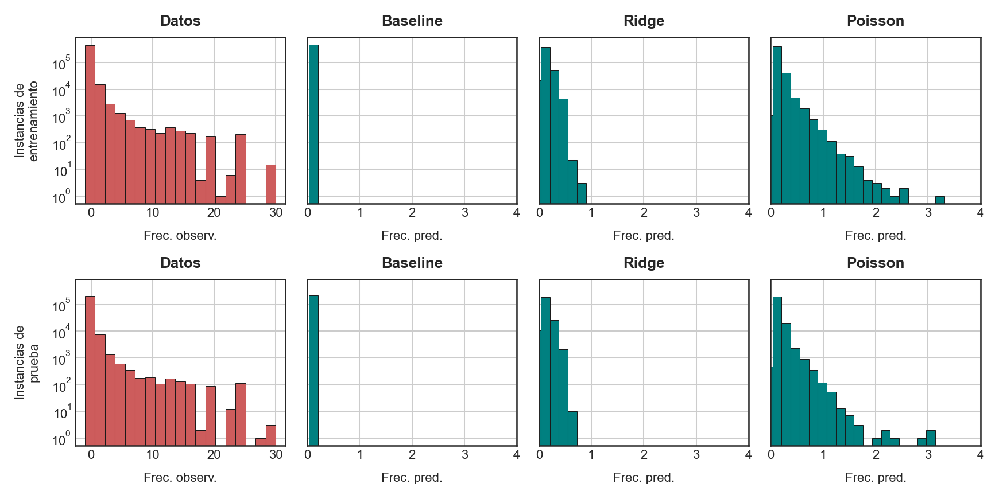

In [154]:
# Visualizamos nuestros resultados.
fig, ax = plt.subplots(figsize=(12, 6), nrows=2, ncols=4, sharey=True)
labels = ["entrenamiento", "prueba"]
titles = ["Baseline", "Ridge", "Poisson"]

for row_i, label_i, df_i in zip(range(ax.shape[0]), labels, [train_set, test_set]):
    # Graficamos los datos reales de frecuencias de reclamaciones.
    df_i["Frequency"].plot(
        kind="hist", bins=np.linspace(start=-1, stop=30, num=20), ax=ax[row_i, 0],
        color="indianred", ec="k", lw=0.5,
    )
    ax[row_i, 0].set_title("Datos", fontsize=13, fontweight="bold", pad=10)
    ax[row_i, 0].set_xlabel("Frec. observ.", fontsize=11, labelpad=10)
    ax[row_i, 0].set_ylabel("Instancias de\n" + label_i, fontsize=11, labelpad=10)
    ax[row_i, 0].set_yscale("log")
    ax[row_i, 0].grid(True)

    # Graficamos los resultados por medio de un loop.
    for (col_j, model_j), title_j in zip(enumerate([dummy_model, ridge_model, poisson_model]), titles):
        # Predicciones del modelo.
        y_pred = model_j.predict(df_i)

        # Graficamos los resultados del correspondiente modelo.
        pd.Series(y_pred).plot(
            kind="hist", bins=np.linspace(start=-1, stop=4, num=30), color="teal",
            ax=ax[row_i, col_j + 1], ec="k", lw=0.5,
        )
        ax[row_i, col_j + 1].set_title(title_j, fontsize=13, fontweight="bold", pad=10)
        ax[row_i, col_j + 1].set_xlabel("Frec. pred.", fontsize=11, labelpad=10)
        ax[row_i, col_j + 1].set_yscale("log")
        ax[row_i, col_j + 1].grid(True)
        ax[row_i, col_j + 1].set_xlim(0, 4)

plt.tight_layout();

Podemos observar que el modelo de regresión de tipo "ridge" falla en reproducir la distribución observada de la frecuencia de reclamaciones, debido a que sólo es capaz de predecir valores que, casi con total probabilidad, se ubican en el intervalo $[0, 1]$. El modelo de Poisson permite reproducir de mejor forma la distribución original, aunque con honestidad, sigue estando lejos de los datos observados y se trata de un modelo que ciertamente podemos mejorar. Esto se debe, en este ejercicio particular, a que los datos observados presentan una distribución con colas más pesadas, a las que podemos asignar ponderadores mayores en un ejercicio más sofisticado. ◼︎